# Satellite derived Bathymetry

### ee.Authenticate() is used to authenticate access to Google Earth Engine (GEE).

In [1]:
import ee
ee.Authenticate()

Enter verification code: 4/1AUJR-x4HL9nZ3t08cn6pBjkksHu3AA3K-fcAazgkAtQHPec4WP6VkI9ymKI

Successfully saved authorization token.


### This block imports the necessary Python libraries and custom functions from the SDB module for processing satellite-derived bathymetry (SDB).

In [2]:
import ee
import matplotlib.colors as mcolors
from scipy.ndimage import median_filter
import geemap
import matplotlib as plt
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import numpy as np
import pandas as pd
from SDB import get_coordinates_and_utm, get_coordinates, calculate_mndwi_sen,calculate_mndwi_land, sunglint_removal_per_band_sen, sunglint_removal_per_band_land,extract_and_convert_metadata, calculate_subsurface_angle
from SDB import calc_w, calculate_Rrs_infinity, calculate_Kd, calculate_depth_Albert, calculate_f_arrow,calculate_R_u, calculate_Cx
from SDB import optimize_a, calculate_subsurface_angle, extract_metadata_solar_only
from SDB import load_existing_depth, match_reference_tiff_to_band_depth, calculate_depth_Albert
from SDB import evaluate_bins,plot_comparison, match_reference_tiff_to_band_cx, calculate_f_arrow_land, residuals, residuals_opt
from SDB import match_reference_tiff_to_band_cp,match_reference_tiff_to_band_ay,simulate_rrs_pixel,residuals_pixelwise,optimize_a_pixelwise
from SDB import residual_zB,residual_CX,residual_CP,residual_aY
import parameters
from matplotlib.patches import Patch
import cmocean
from pyproj import Transformer
import os
import rasterio
from rasterio.warp import Resampling
from rasterio.windows import from_bounds
from pyproj import Transformer
import os
import numpy as np
import rasterio
from rasterio.warp import Resampling
from rasterio.windows import from_bounds
from pyproj import Transformer
import matplotlib.pyplot as plt
import cmocean
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
from scipy.optimize import least_squares
import rasterio
from rasterio.transform import from_bounds
from scipy.interpolate import interp1d
import rasterio
from rasterio.transform import from_bounds
import os

### 1.Region selection
#### Step 1: Initialize Google Earth Engine and Create an Interactive Map
- We start by initializing the **Google Earth Engine API (`ee.Initialize()`)**.
- Then, we create an **interactive map (`geemap.Map()`)** that allows the user to visualize and select a region.
- A **drawing tool is added (`Map.add_draw_control()`)** so that users can manually select an area of interest (AOI).
- The map is displayed for user interaction.

#### Step 2: Retrieve the Selected Region (ROI)
- The script retrieves the **last drawn polygon (`Map.draw_last_feature`)**.
- If a polygon is drawn, its geometry is extracted and printed.
- If no polygon is drawn, the user is **prompted to manually enter coordinates**.
- A placeholder function `get_coordinates()` is defined, which can be customized to allow manual coordinate input.
- Finally, the script checks whether a region has been successfully selected and prints the result.

In [47]:
ee.Initialize()
Map = geemap.Map()
Map.add_draw_control()
Map

Map(center=[0, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(childr…

TraitError: The 'east' trait of a Map instance expected a float, not the NoneType None.

TraitError: The 'east' trait of a Map instance expected a float, not the NoneType None.

In [49]:
polygon = Map.draw_last_feature  
if polygon:
    region = polygon.geometry()  
    print(f"Polygon drawn: {region.getInfo()}")
else:
    print("No polygon drawn. Please draw a polygon on the map or enter coordinates manually.") 
    print("Please enter coordinates manually in the following format:")
    print(">>> [[lon1, lat1], [lon2, lat2], [lon3, lat3], ..., [lon1, lat1]]")
    print("Make sure the first and last coordinate are the same to close the polygon.")
    print("Example: [[9.056928, 47.683013], [9.056928, 47.684631], [9.059589, 47.684631], [9.059589, 47.683013], [9.056928, 47.683013]]")
    
    region = get_coordinates()
if region:
    print(f"Selected Region: {region.getInfo()}")
else:
    print("No region defined. Please specify a valid region.")

Polygon drawn: {'geodesic': False, 'type': 'Polygon', 'coordinates': [[[8.987765, 47.701798], [8.999096, 47.70896], [9.017637, 47.701105], [9.020383, 47.69579], [9.013173, 47.692093], [9.005276, 47.690244], [8.998409, 47.687702], [8.990855, 47.694173], [8.987765, 47.701798]]]}
Selected Region: {'geodesic': False, 'type': 'Polygon', 'coordinates': [[[8.987765, 47.701798], [8.999096, 47.70896], [9.017637, 47.701105], [9.020383, 47.69579], [9.013173, 47.692093], [9.005276, 47.690244], [8.998409, 47.687702], [8.990855, 47.694173], [8.987765, 47.701798]]]}


### 2. Image Filtering 
#### 1. Selecting the Region of Interest (ROI)
- The last drawn polygon on the interactive map (`Map.draw_last_feature`) is retrieved.
- If no polygon is drawn, the user is prompted to enter coordinates manually.

#### 2. Defining Filtering Parameters
- **Date Range:** The images are filtered between e.g. `2020-01-01` and `2021-12-12`.
- **Cloud Masking:** The filtering process excludes images with:
  - Cloud cover above `1%`
  - High-probability clouds (`HIGH_PROBA_CLOUDS_PERCENTAGE`)
  - Medium-probability clouds (`MEDIUM_PROBA_CLOUDS_PERCENTAGE`)
  - Thin cirrus clouds (`THIN_CIRRUS_PERCENTAGE`)
- **Solar Zenith Angle:** Only images with a solar zenith angle lower than `45°` are considered.

#### 3. Filtering the Sentinel-2 Collection
- The script loads Sentinel-2 L2A surface reflectance images (`COPERNICUS/S2_SR_HARMONIZED`).
- It applies the filtering criteria and selects the **first available image**.
- The first image is clipped to the selected **region of interest (ROI)**.

#### 4. Displaying Results on the Interactive Map
- The script counts the number of filtered images and prints the result.
- If images are found, **each image is added to the interactive map** for visualization.
- The **selected region is displayed as an overlay**.
- The map is centered on the region to provide a clear view of the filtered images.

In [50]:
#mission = "Sentinel"
mission = "Landsat"

if mission == "Sentinel":
    polygon = Map.draw_last_feature

    if region:
        print(f"Selected Region: {region.getInfo()}")

        startdate = '2020-04-13'
        enddate = '2020-04-16'
        cloudpercentage = 5
        thincirruspercentage = 1
        highcloudpercentage = 1
        mediumcloudpercentage = 1
       # zenith_max = 45  

        sentinel2 = ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED") \
            .filterBounds(region) \
            .filterDate(startdate, enddate) #\
            #.filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', cloudpercentage)) \
            #.filter(ee.Filter.lt('HIGH_PROBA_CLOUDS_PERCENTAGE', highcloudpercentage)) \
            #.filter(ee.Filter.lt('MEDIUM_PROBA_CLOUDS_PERCENTAGE', mediumcloudpercentage)) \
            #.filter(ee.Filter.lt('THIN_CIRRUS_PERCENTAGE', thincirruspercentage)) \
           # .filter(ee.Filter.lt('MEAN_SOLAR_ZENITH_ANGLE', zenith_max))

        image = sentinel2.first().clip(region)
        timestamp = ee.Date(image.get('system:time_start')).format('YYYY-MM-dd HH:mm').getInfo()
        Map.addLayer(image, {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 3000}, "Sentinel-2 Image")
        Map.centerObject(region, 10)

        image_count = sentinel2.size().getInfo()
        print(f'Number of images found: {image_count}')
        print(f"Image: {timestamp}")

        if image_count > 0:
            images = sentinel2.toList(image_count)

            for i in range(image_count):
                image = ee.Image(images.get(i)).clip(region)
                Map.addLayer(image, {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 3000}, f'Sentinel-2 Image {i + 1}')
                timestamp = ee.Date(image.get('system:time_start')).format('YYYY-MM-dd HH:mm').getInfo()
                print(f"Image {i + 1}: {timestamp}")
        Map.addLayer(region, {}, "Region")
        Map.centerObject(region, 10)
        display(Map)

    
elif mission == "Landsat":
    polygon = Map.draw_last_feature
    if region:
            print(f"Selected Region: {region.getInfo()}")
            startdate = '2014-03-01'
            enddate = '2014-04-30'
            cloudpercentage = 5
            thincirruspercentage = 1
            highcloudpercentage = 1
            mediumcloudpercentage = 1
            collection = ee.ImageCollection("LANDSAT/LC08/C02/T1_L2") \
            .filterBounds(region) \
            .filterDate(startdate, enddate) \
            
            print("Landsat 8 wird geladen...")
            
            image = collection.first().clip(region)
            image_count = collection.size().getInfo()
            print(f'Number of images found: {image_count}')

    if image_count > 0:
            images = collection.toList(image_count)
        
            for i in range(image_count):
                image = ee.Image(images.get(i)).clip(region)
                Map.addLayer(image, {'bands': ['SR_B4', 'SR_B3', 'SR_B2'],'max':25000}, f'Landsat-8 Image {i + 1}')
                timestamp = ee.Date(image.get('system:time_start')).format('YYYY-MM-dd HH:mm').getInfo()
                print(f"Image {i + 1}: {timestamp}")
    Map.addLayer(region, {'color': 'red'}, "Region")
    Map.centerObject(region, 10)
    display(Map)

else:
    raise ValueError(" Ungültige Missionswahl. Bitte 'Sentinel' oder 'Landsat' angeben.")

Selected Region: {'geodesic': False, 'type': 'Polygon', 'coordinates': [[[8.987765, 47.701798], [8.999096, 47.70896], [9.017637, 47.701105], [9.020383, 47.69579], [9.013173, 47.692093], [9.005276, 47.690244], [8.998409, 47.687702], [8.990855, 47.694173], [8.987765, 47.701798]]]}
Landsat 8 wird geladen...
Number of images found: 4
Image 1: 2014-03-13 10:10
Image 2: 2014-03-29 10:10
Image 3: 2014-04-14 10:10
Image 4: 2014-03-20 10:16


Map(bottom=366028.0, center=[47.69824822476271, 9.002973419795644], controls=(WidgetControl(options=['position…

### Step 3: Selecting Sentinel-2 Images for Further Processing

#### 1. Listing Available Images
- The script first prints a list of all available images in the filtered collection.
- Each image is numbered sequentially (starting from 1).

#### 2. User Input for Image Selection
- The user is prompted to **enter the numbers of the desired images**.
- The input should be comma-separated (e.g., `1,3,5` selects the first, third, and fifth image).

#### 3. Processing the Selected Images
- The input values are converted into a list of indices.
- Since Python uses **zero-based indexing**, each input number is adjusted by subtracting 1.
- The script **retrieves and clips each selected image** to the specified **region of interest (ROI)**.
- A confirmation message is printed for each selected image.

####  Next Steps
Now that the images are selected, the next step is to **apply land masking (MNDWI)** to remove land areas from the images.


In [51]:
for i in range(image_count):
    print(f"Image {i + 1}")

selected_images = input("Enter the numbers of the desired images (separated by commas):")

selected_indices = [int(idx) - 1 for idx in selected_images.split(",")]

selected_images_list = []

for i in selected_indices:
    selected_image = ee.Image(images.get(i)).clip(region)
    selected_images_list.append(selected_image)
    print(f"Image {i + 1} selected for further processing")

Image 1
Image 2
Image 3
Image 4
Enter the numbers of the desired images (separated by commas):2
Image 2 selected for further processing


### Step 4: Compute MNDWI and Apply Water Mask

#### 1. What is MNDWI?
The **Modified Normalized Difference Water Index (MNDWI)** is used to enhance water bodies and differentiate them from land.
It is calculated as:

\[
MNDWI = \frac{Green - SWIR1}{Green + SWIR1}
\]

For Sentinel-2, the corresponding bands are:
- **Green:** B3 (560 nm)
- **SWIR1:** B11 (1610 nm)

#### 2. Computing MNDWI for Selected Images
- Each selected image is processed using the `calculate_mndwi()` function.
- The computed MNDWI values are stored in a list.

#### 3. Applying a Water Mask
- Areas with **MNDWI > 0.1** are classified as water.
- A mask is applied to **remove land areas** from the images.

#### 4. Resampling and Reprojecting Images
- The masked images are resampled using **bilinear interpolation**.
- The projection is set to match Band 3 (`B3`), ensuring consistency in resolution.

#### 5. Visualization of Results
##### MNDWI Visualization
- The processed MNDWI image is converted to a NumPy array.
- A **color-mapped image (`coolwarm` scale)** is displayed.

##### Reflectance of Selected Bands
- The reflectance values of **B3 (Green), B4 (Red), B7 (Red Edge), and B11 (SWIR1)** are visualized.
- A **color-mapped plot (`jet` scale)** is used to highlight differences in reflectance.

####  Next Steps
Now that land areas are masked out, the next step is to **apply sunglint correction**.

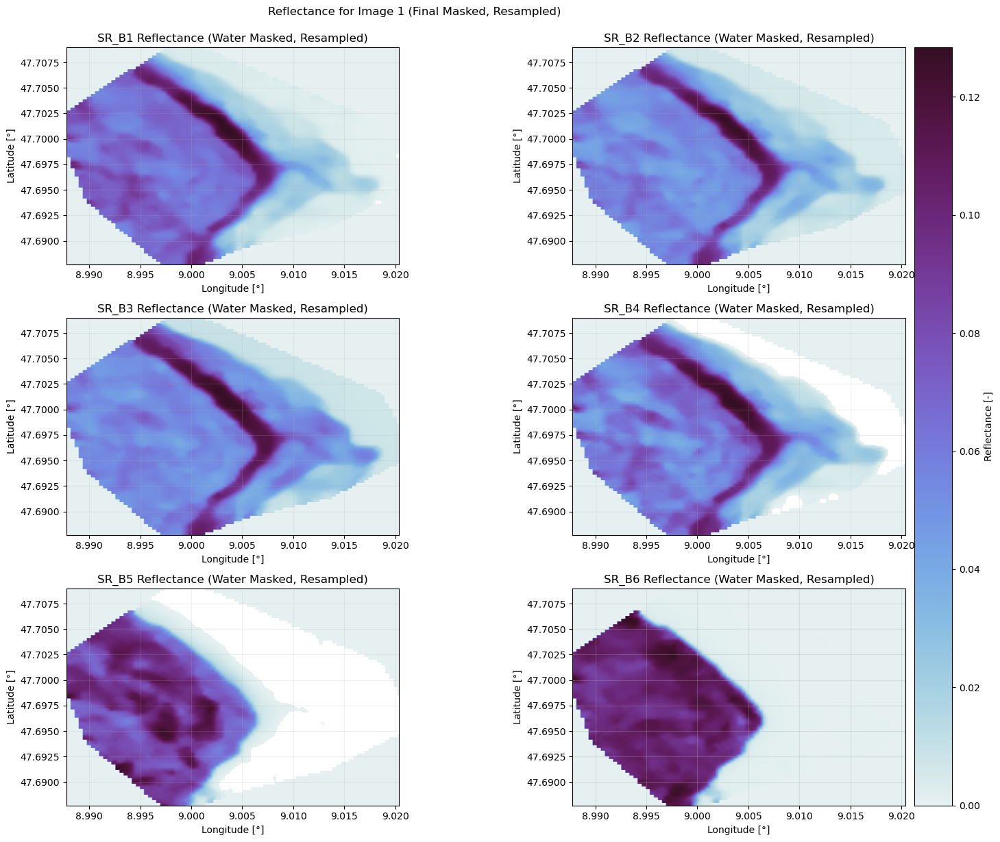

In [52]:
if mission == "Sentinel":
    bands = ['B1','B2','B3', 'B4','B5', 'B6', 'B7', 'B11']
    band_images = []

    for i, image in enumerate(selected_images_list):
        #um von boa auf rrs zu kommen durch pi -> siehe papers https://www.mdpi.com/2072-4292/12/9/1514
        masked_image = image.select(bands).divide(10000*np.pi)
        numerator = masked_image
        denominator = ee.Image.constant(0.52).add(masked_image.multiply(1.7))
        masked_image = numerator.divide(denominator)
        masked_image = masked_image.focal_median(radius=2, units='pixels')
        #filter https://arxiv.org/pdf/1002.1148

        #resampled_image = masked_image.resample('bilinear').reproject(crs=masked_image.select('B3').projection(scale=10))
        resampled_image = masked_image.resample('bilinear').reproject(
        crs='EPSG:32632',  # oder image.select('B3').projection().crs(), falls dynamisch
        scale=10  # ← explizit auf 10 m
        )

        band_images.append(resampled_image)
        
        fig, axes = plt.subplots(4, 2, figsize=(16.5, 12)) 
        for j, band in enumerate(bands):
            band_image_selected = resampled_image.select(band)

            band_array = geemap.ee_to_numpy(band_image_selected, region=region)
            band_array = np.ma.masked_less(band_array, 0)
            np.flipud(np.fliplr(band_array))

            coords = region.bounds().coordinates().getInfo()[0]
            lon_min, lat_min = coords[0]
            lon_max, lat_max = coords[2]


            ax = axes[j // 2, j % 2]
            im = ax.imshow(band_array, cmap=cmocean.cm.dense, extent=[lon_min, lon_max, lat_min, lat_max])
            ax.set_title(f'{band} Reflectance (Water Masked, Resampled)', fontsize=12)
            ax.grid(alpha=0.2)
            ax.set_title(f'{band} Reflectance (Water Masked, Resampled)', fontsize=12)
            ax.set_xlabel('Longitude [°]')
            ax.set_ylabel('Latitude [°]')

        plt.tight_layout()
        plt.suptitle(f"Reflectance for Image {i + 1} (Final Masked, Resampled)", fontsize=12, y=1.02)
        fig.colorbar(im, ax=axes, orientation='vertical', fraction=0.05, pad=0.008)
        plt.grid(alpha=0.3)
        plt.show()
        
elif mission == "Landsat":
    bands = ['SR_B1','SR_B2','SR_B3', 'SR_B4','SR_B5', 'SR_B6']
    band_images = []

    for i, image in enumerate(selected_images_list):

        #masked_image = image.updateMask(final_mask).select(bands).divide(10000*np.pi*0.5349)
        #um von boa auf rrs zu kommen durch pi -> siehe papers https://www.mdpi.com/2072-4292/12/9/1514
        #https://www.researchgate.net/publication/11140186_Deriving_inherent_optical_properties_from_water_color_a_multiband_quasi-analytical_algorithm_for_optically_deep_waters
        masked_image = image.select(bands).multiply(0.0000275).add(-0.2)
        masked_image=masked_image.divide(np.pi)
        numerator = masked_image
        denominator = ee.Image.constant(0.52).add(masked_image.multiply(1.7))
        masked_image = numerator.divide(denominator)
        masked_image = masked_image.focal_median(radius=2, units='pixels')
        #filter https://arxiv.org/pdf/1002.1148

        #resampled_image = masked_image.resample('bilinear').reproject(crs=masked_image.select('B3').projection(scale=10))
        resampled_image = masked_image.resample('bilinear').reproject(
        crs='EPSG:32632',  # oder image.select('B3').projection().crs(), falls dynamisch
        scale=10  # ← explizit auf 10 m
        )

        band_images.append(resampled_image)

        fig, axes = plt.subplots(3, 2, figsize=(16.5, 12)) 
        for j, band in enumerate(bands):
            band_image_selected = resampled_image.select(band)

            band_array = geemap.ee_to_numpy(band_image_selected, region=region)
            band_array = np.ma.masked_less(band_array, 0)
            np.flipud(np.fliplr(band_array))

            coords = region.bounds().coordinates().getInfo()[0]
            lon_min, lat_min = coords[0]
            lon_max, lat_max = coords[2]


            ax = axes[j // 2, j % 2]
            im = ax.imshow(band_array, cmap=cmocean.cm.dense, extent=[lon_min, lon_max, lat_min, lat_max])
            ax.set_title(f'{band} Reflectance (Water Masked, Resampled)', fontsize=12)
            ax.grid(alpha=0.2)
            ax.set_title(f'{band} Reflectance (Water Masked, Resampled)', fontsize=12)
            ax.set_xlabel('Longitude [°]')
            ax.set_ylabel('Latitude [°]')

        plt.tight_layout()
        plt.suptitle(f"Reflectance for Image {i + 1} (Final Masked, Resampled)", fontsize=12, y=1.02)
        fig.colorbar(im, ax=axes, orientation='vertical', fraction=0.05, pad=0.008, label='Reflectance [-]')
        plt.grid(alpha=0.3)
        plt.show()

### Step 5: Sunglint Removal

#### 1. Selecting a Deep-Water Sample Area
- The user selects a **polygon** on the interactive map, which serves as a **reference deep-water region**.
- This polygon is used for performing a **linear regression** to estimate sunglint effects.

#### 2. Performing Linear Regression
- The **SWIR1 band (B11, 1610 nm)** is selected as it is least affected by water reflectance.
- A **linear regression** is performed between SWIR1 and each band (B1–B12) within the sample region.

#### 3. Applying the Sunglint Correction
- If the **regression slope is positive**, sunglint is removed using the formula:

\[
\text{Corrected Band} = \text{Original Band} - \text{Slope} \times (\text{SWIR1} - \text{Min SWIR1})
\]

- If the **slope is negative** or not enough valid pixels are found, the original (MNDWI-masked) band is used.

#### 4. Visualization
- The corrected reflectance values are plotted for all selected images.
- The results are displayed using a **color-mapped plot (`jet` scale)**.

In [53]:
if mission == "Sentinel":
    Map = geemap.Map()

    for i, image in enumerate(selected_images_list):
        Map.addLayer(image, {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 3000}, f'Sentinel-2 Image {i + 1}')

    Map.centerObject(region, 10)
    Map.addLayer(region, {}, "Region")
    Map.addLayerControl()
    display(Map)

elif mission == "Landsat":
    Map = geemap.Map()

    for i, image in enumerate(selected_images_list):
        Map.addLayer(image, {'bands': ['SR_B4', 'SR_B3', 'SR_B2'],'max': 25000}, f'Landsat-8 Image {i + 1}')

    Map.centerObject(region, 10)
    Map.addLayer(region, {}, "Region")
    Map.addLayerControl()
    display(Map)

Map(center=[47.69824822476271, 9.002973419795644], controls=(WidgetControl(options=['position', 'transparent_b…

TraitError: The 'east' trait of a Map instance expected a float, not the NoneType None.

TraitError: The 'east' trait of a Map instance expected a float, not the NoneType None.

In [54]:
sample_polygon = Map.draw_last_feature  

if sample_polygon:
    polygon_geometry = sample_polygon.geometry()
    polygon_coords = polygon_geometry.coordinates().getInfo()
    print("Polygon coordinates: ", polygon_coords)
else:
    print("No polygon was drawn. Please draw a polygon on the map.")
    sample_polygon = None

Polygon coordinates:  [[[9.016151, 47.699261], [9.016151, 47.700358], [9.016837, 47.700358], [9.016837, 47.699261], [9.016151, 47.699261]]]


Performing sunglint removal on image 1
Sample polygon successfully converted to geometry.
Band: SR_B1, Regression slope: -1.1959468882759154
Band SR_B1: Negative slope. Using original MNDWI-masked band.
Band: SR_B2, Regression slope: -0.7708438385611361
Band SR_B2: Negative slope. Using original MNDWI-masked band.
Band: SR_B3, Regression slope: -6.475673624029046
Band SR_B3: Negative slope. Using original MNDWI-masked band.
Band: SR_B4, Regression slope: -0.4127166475858803
Band SR_B4: Negative slope. Using original MNDWI-masked band.
Band: SR_B5, Regression slope: -1.697523479363778
Band SR_B5: Negative slope. Using original MNDWI-masked band.
Band: SR_B6, Regression slope: 0.1688382367078424
Band SR_B6: Sunglint correction applied (slope = 0.1688).


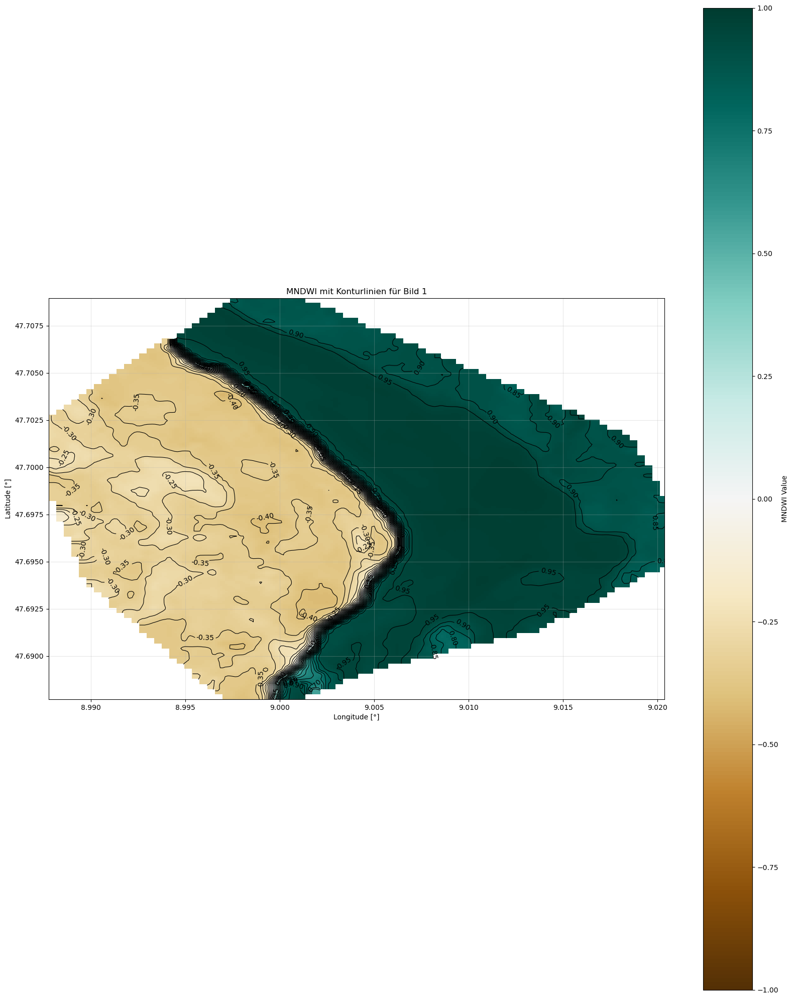

Sunglint removal completed for all images.


In [55]:
if mission == "Sentinel":  
    all_corrected_images = []

    for i, band in enumerate(band_images):
        print(f"Performing sunglint removal on image {i + 1}")
        corrected_bands = sunglint_removal_per_band_sen(band, sample_polygon, region, bands)
        invalid_mask = (
        (corrected_bands["B1"] ==np.nan) |
        (corrected_bands["B3"] ==np.nan) |
        (corrected_bands["B2"] ==np.nan) |
        (corrected_bands["B3"] ==np.nan) |
        (corrected_bands["B4"] ==np.nan) |
        (corrected_bands["B5"] ==np.nan) |
        (corrected_bands["B6"] ==np.nan) |
        (corrected_bands["B7"] ==np.nan) |
        (corrected_bands["B11"] ==np.nan)|
        (corrected_bands["B1"] ==0) |
        (corrected_bands["B3"] ==0) |
        (corrected_bands["B2"] ==0) |
        (corrected_bands["B3"] ==0) |
        (corrected_bands["B4"] ==0) |
        (corrected_bands["B5"] ==0) |
        (corrected_bands["B6"] ==0) |
        (corrected_bands["B7"] ==0) |
        (corrected_bands["B11"] ==0) 
        )

        mndwi_np = (corrected_bands["B3"] - corrected_bands["B11"]) / (corrected_bands["B3"] + corrected_bands["B11"])
       
        mndwi_np = np.squeeze(mndwi_np)
        fig, ax = plt.subplots(figsize=(16.5, 20))
        im = ax.imshow(
                mndwi_np, cmap='BrBG', vmin=-1, vmax=1,
                extent=[lon_min, lon_max, lat_min, lat_max]
            )
        levels = np.arange(-1.0, 1.0, 0.05)
        contours = ax.contour(
                mndwi_np, levels=levels, colors='black',
                linewidths=0.8, extent=[lon_min, lon_max, lat_max, lat_min],
                linestyles='solid'
            )
        ax.clabel(contours, fmt='%1.2f', fontsize=10)
        ax.set_title(f"MNDWI mit Konturlinien für Bild {i + 1}", fontsize=12)
        ax.set_xlabel("Longitude [°]")
        ax.set_ylabel("Latitude [°]")
        plt.colorbar(im, ax=ax, label="MNDWI Value")
        plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()
       
        all_corrected_images.append(corrected_bands)
       
elif mission == "Landsat":  
        all_corrected_images = []

        for i, band in enumerate(band_images):
            print(f"Performing sunglint removal on image {i + 1}")
            corrected_bands = sunglint_removal_per_band_land(band, sample_polygon, region, bands)
            invalid_mask = (
            (corrected_bands["SR_B1"] ==np.nan ) |
            (corrected_bands["SR_B2"] ==np.nan) |
            (corrected_bands["SR_B3"] ==np.nan) |
            (corrected_bands["SR_B4"] ==np.nan) |
            #(corrected_bands["SR_B5"] ==np.nan) |
            (corrected_bands["SR_B6"] ==np.nan) |
            (corrected_bands["SR_B1"] <=0) |
            (corrected_bands["SR_B2"] <=0) |
            (corrected_bands["SR_B3"] <=0) |
            (corrected_bands["SR_B4"] <=0) |
            #(corrected_bands["SR_B5"] <=0) |
            (corrected_bands["SR_B6"] <=0) 
            )

            mndwi_np = (corrected_bands["SR_B3"] - corrected_bands["SR_B6"]) / (corrected_bands["SR_B3"] + corrected_bands["SR_B6"])

            mndwi_np = np.squeeze(mndwi_np)
            fig, ax = plt.subplots(figsize=(16.5, 20))
            im = ax.imshow(
                mndwi_np, cmap='BrBG', vmin=-1, vmax=1,
                extent=[lon_min, lon_max, lat_min, lat_max]
            )
            levels = np.arange(-1.0, 1.0, 0.05)
            contours = ax.contour(
                mndwi_np, levels=levels, colors='black',
                linewidths=0.8, extent=[lon_min, lon_max, lat_max, lat_min],
                linestyles='solid'
            )
            ax.clabel(contours, fmt='%1.2f', fontsize=10)
            ax.set_title(f"MNDWI mit Konturlinien für Bild {i + 1}", fontsize=12)
            ax.set_xlabel("Longitude [°]")
            ax.set_ylabel("Latitude [°]")
            plt.colorbar(im, ax=ax, label="MNDWI Value")
            plt.grid(alpha=0.3)
            plt.tight_layout()
            plt.show()

            all_corrected_images.append(corrected_bands)
print("Sunglint removal completed for all images.")

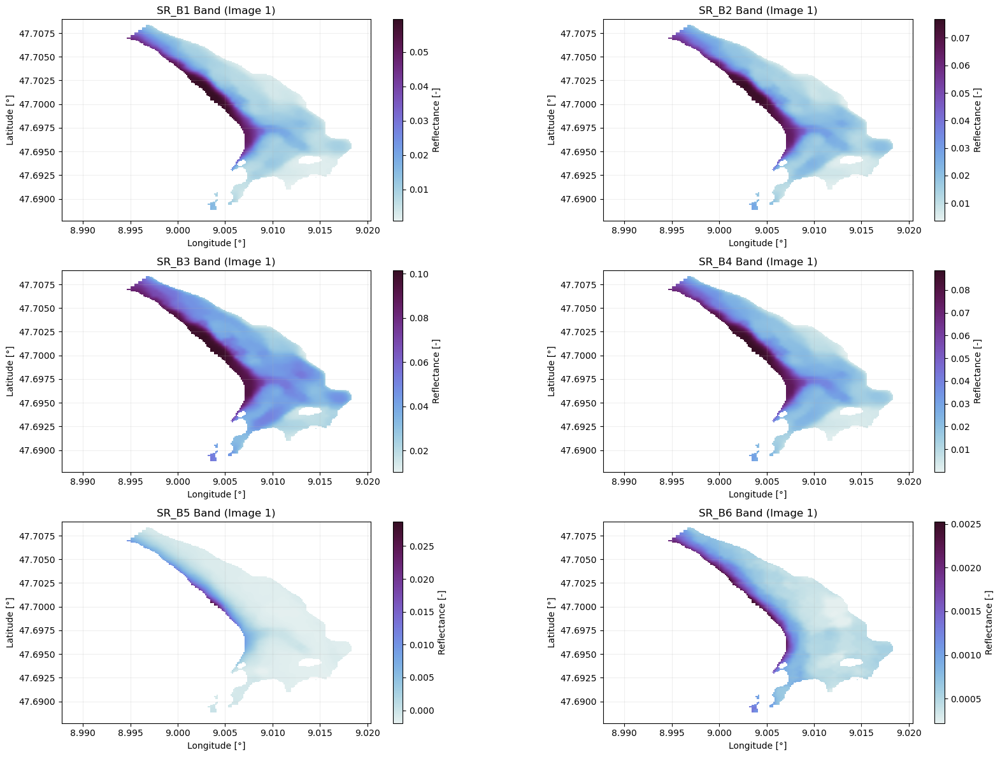

In [56]:
if mission == "Sentinel":  
    all_corrected_images = []

    for i, band in enumerate(band_images):

        mndwi_threshold_sen_sw=0.8
        mndwi_mask = mndwi_np > mndwi_threshold_sen_sw
        for key in corrected_bands:
            band_array = corrected_bands[key]
            band_array[invalid_mask] = np.nan
            band_array[~mndwi_mask] = np.nan
            corrected_bands[key] = band_array
       
    all_corrected_images.append(corrected_bands)
        
    fig, axs = plt.subplots(4, 2, figsize=(18, 12))
    for idx, band in enumerate(bands):
            ax = axs[idx // 2, idx % 2]
            im = ax.imshow(corrected_bands[band], cmap=cmocean.cm.dense, #vmin=0,
                           extent=[lon_min, lon_max, lat_min, lat_max])
            ax.set_xlabel('Longitude [°]')
            ax.set_ylabel('Latitude [°]')
            ax.set_title(f'{band} Band (Image {i + 1})')
            ax.grid(alpha=0.2)
            plt.colorbar(im, ax=ax, orientation='vertical', fraction=0.046, pad=0.04, label='Reflectance [-]')

    plt.tight_layout()
    plt.show()

    print("Sunglint removal completed for all images.")

elif mission == "Landsat":  
    all_corrected_images = []
        
    for i, band in enumerate(band_images):
        
        mndwi_threshold_land=0.95
        mndwi_mask = mndwi_np > mndwi_threshold_land
        
        for key in corrected_bands:
                band_array = corrected_bands[key]
                band_array[invalid_mask] = np.nan
                band_array[~mndwi_mask] = np.nan
                corrected_bands[key] = band_array

    all_corrected_images.append(corrected_bands)

    fig, axs = plt.subplots(3, 2, figsize=(18, 12))
    for idx, band in enumerate(bands):
                ax = axs[idx // 2, idx % 2]
                im = ax.imshow(corrected_bands[band], cmap=cmocean.cm.dense, #vmin=0,
                               extent=[lon_min, lon_max, lat_min, lat_max])
                ax.set_xlabel('Longitude [°]')
                ax.set_ylabel('Latitude [°]')
                ax.set_title(f'{band} Band (Image {i + 1})')
                ax.grid(alpha=0.2)
                plt.colorbar(im, ax=ax, orientation='vertical', fraction=0.046, pad=0.04, label='Reflectance [-]')

    plt.tight_layout()
    plt.show()     

### 5. Loading Metadata and Empirical Parameters

#### 1. Extracting Metadata
For each selected Sentinel-2 image, key metadata is extracted, including:
  - **Acquisition Time (`DateTime`)** of the image.
  - **Mean Solar Zenith Angle (`θs`)**: Represents the sun's position above the horizon.
  - **Mean Viewing Angles per Band (`θv`)**: Indicates the inclination of the sensor recordings for bands B3, B4, B7, and B11.

- **Conversion of Angles to Radians:**  
  - All angles are directly converted to **radians** so they can be used in later calculations without further conversion.
  - Additionally, the **subsurface solar zenith angle (`θs subsurface`)** and **subsurface viewing angle (`θv subsurface`)** are computed using the **water refractive index (nW = 1.33).**

- **Why are these angles important?**  
  - The **solar and viewing angles** influence water surface reflectance.  
  - **Subsurface angles** are critical for models estimating **bathymetry, suspended matter, and chlorophyll** concentrations.

---

#### 2. Loading Empirical Parameters
- Wavelength-independent and wavelength-dependent parameters are loaded from a separate file (`parameters.py`).
- The parameters include:
  - **Band Wavelengths (`band_wavelengths_sen`)**: Defined wavelengths for Sentinel-2 bands B3, B4, B7, and B11.
  - **Empirical Coefficients (`empirical_coefficients_sen`)**:  
    - **Absorption coefficient (`aw`)**  
    - **Backscattering coefficient (`bbw`)**  
    - **Reflectance values for sand, algae, detritus, and other materials (`Rb_sand, Rb_ga, Rb_ba, Rb_ra`)**  
    - **Additional parameters (`a*_P, a*_X, a*_Y, b*b_X`)**, which are used in specific absorption and backscattering models.

- **Why are these parameters important?**  
  - They are essential for **reflectance calculations, bathymetry models, and water quality assessments**.
  - The values are derived from scientific studies and optimized for the **specific wavelengths of Sentinel-2**.

---

#### Summary
- **All metadata is structured and includes subsurface angles.**
- **Empirical coefficients are modularly loaded and can be used flexibly.**
- **Now, all necessary data is ready for numerical computations!**
 **Next Step:** Computing **`a` and `bb` (Step 9)** using the loaded parameters.


In [57]:
ars1 = parameters.ars1
ars2 = parameters.ars2
prs1 = parameters.prs1
prs2 = parameters.prs2
prs3 = parameters.prs3
prs4 = parameters.prs4
prs5 = parameters.prs5
prs6 = parameters.prs6
prs7 = parameters.prs7
ko = parameters.ko
k1u = parameters.k1w
k2u = parameters.k2w
k1b = parameters.k1b
k2b = parameters.k2b

if mission == "Sentinel":  
    band_wavelengths = parameters.band_wavelengths_sen
    empirical_coefficients = parameters.empirical_coefficients_sen

    aw_B1 = empirical_coefficients['B1']['aw']
    bbw_B1 = empirical_coefficients['B1']['bbw']
    Rb_sand_B1 = empirical_coefficients['B1']['Rb_sand']
    Rb_LC_B1 = empirical_coefficients['B1']['Rb_LC']
    Rb_art_B1 = empirical_coefficients['B1']['Rb_art']
    Rb_ga_B1 = empirical_coefficients['B1']['Rb_ga']
    Rb_ba_B1 = empirical_coefficients['B1']['Rb_ba']
    Rb_ra_B1 = empirical_coefficients['B1']['Rb_ra']
    a_P_B1 = empirical_coefficients['B1']['a*_P']
    bb_X_B1 = empirical_coefficients['B1']['b*b_X']


    aw_B2 = empirical_coefficients['B2']['aw']
    bbw_B2 = empirical_coefficients['B2']['bbw']
    Rb_sand_B2 = empirical_coefficients['B2']['Rb_sand']
    Rb_LC_B2 = empirical_coefficients['B2']['Rb_LC']
    Rb_art_B2 = empirical_coefficients['B2']['Rb_art']
    Rb_ga_B2 = empirical_coefficients['B2']['Rb_ga']
    Rb_ba_B2 = empirical_coefficients['B2']['Rb_ba']
    Rb_ra_B2 = empirical_coefficients['B2']['Rb_ra']
    a_P_B2 = empirical_coefficients['B2']['a*_P']
    bb_X_B2 = empirical_coefficients['B2']['b*b_X']

    aw_B3 = empirical_coefficients['B3']['aw']
    bbw_B3 = empirical_coefficients['B3']['bbw']
    Rb_sand_B3 = empirical_coefficients['B3']['Rb_sand']
    Rb_LC_B3 = empirical_coefficients['B3']['Rb_LC']
    Rb_art_B3 = empirical_coefficients['B3']['Rb_art']
    Rb_ga_B3 = empirical_coefficients['B3']['Rb_ga']
    Rb_ba_B3 = empirical_coefficients['B3']['Rb_ba']
    Rb_ra_B3 = empirical_coefficients['B3']['Rb_ra']
    a_P_B3 = empirical_coefficients['B3']['a*_P']
    bb_X_B3 = empirical_coefficients['B3']['b*b_X']

    aw_B4 = empirical_coefficients['B4']['aw']
    bbw_B4 = empirical_coefficients['B4']['bbw']
    Rb_sand_B4 = empirical_coefficients['B4']['Rb_sand']
    Rb_LC_B4 = empirical_coefficients['B4']['Rb_LC']
    Rb_art_B4 = empirical_coefficients['B4']['Rb_art']
    Rb_ga_B4 = empirical_coefficients['B4']['Rb_ga']
    Rb_ba_B4 = empirical_coefficients['B4']['Rb_ba']
    Rb_ra_B4 = empirical_coefficients['B4']['Rb_ra']
    a_P_B4 = empirical_coefficients['B4']['a*_P']
    bb_X_B4 = empirical_coefficients['B4']['b*b_X']

    aw_B5 = empirical_coefficients['B5']['aw']
    bbw_B5 = empirical_coefficients['B5']['bbw']
    Rb_sand_B5 = empirical_coefficients['B5']['Rb_sand']
    Rb_LC_B5 = empirical_coefficients['B5']['Rb_LC']
    Rb_art_B5 = empirical_coefficients['B5']['Rb_art']
    Rb_ga_B5 = empirical_coefficients['B5']['Rb_ga']
    Rb_ba_B5 = empirical_coefficients['B5']['Rb_ba']
    Rb_ra_B5 = empirical_coefficients['B5']['Rb_ra']
    a_P_B5 = empirical_coefficients['B5']['a*_P']
    bb_X_B5 = empirical_coefficients['B5']['b*b_X']

    aw_B6 = empirical_coefficients['B6']['aw']
    bbw_B6 = empirical_coefficients['B6']['bbw']
    Rb_sand_B6 = empirical_coefficients['B6']['Rb_sand']
    Rb_LC_B6 = empirical_coefficients['B6']['Rb_LC']
    Rb_art_B6 = empirical_coefficients['B6']['Rb_art']
    Rb_ga_B6 = empirical_coefficients['B6']['Rb_ga']
    Rb_ba_B6 = empirical_coefficients['B6']['Rb_ba']
    Rb_ra_B6 = empirical_coefficients['B6']['Rb_ra']
    a_P_B6 = empirical_coefficients['B6']['a*_P']
    bb_X_B6 = empirical_coefficients['B6']['b*b_X']

    aw_B7 = empirical_coefficients['B7']['aw']
    bbw_B7 = empirical_coefficients['B7']['bbw']
    Rb_sand_B7 = empirical_coefficients['B7']['Rb_sand']
    Rb_LC_B7 = empirical_coefficients['B7']['Rb_LC']
    Rb_art_B7 = empirical_coefficients['B7']['Rb_art']
    Rb_ga_B7 = empirical_coefficients['B7']['Rb_ga']
    Rb_ba_B7 = empirical_coefficients['B7']['Rb_ba']
    Rb_ra_B7 = empirical_coefficients['B7']['Rb_ra']
    a_P_B7 = empirical_coefficients['B7']['a*_P']
    bb_X_B7 = empirical_coefficients['B7']['b*b_X']

    aw_B11 = empirical_coefficients['B11']['aw']
    bbw_B11 = empirical_coefficients['B11']['bbw']
    Rb_sand_B11 = empirical_coefficients['B11']['Rb_sand']
    Rb_LC_B11 = empirical_coefficients['B11']['Rb_LC']
    Rb_art_B11 = empirical_coefficients['B11']['Rb_art']
    Rb_ga_B11 = empirical_coefficients['B11']['Rb_ga']
    Rb_ba_B11 = empirical_coefficients['B11']['Rb_ba']
    Rb_ra_B11 = empirical_coefficients['B11']['Rb_ra']
    a_P_B11 = empirical_coefficients['B7']['a*_P']
    bb_X_B11 = empirical_coefficients['B7']['b*b_X']

    metadata_dict = {f"Image_{i+1}": extract_and_convert_metadata(image) for i, image in enumerate(selected_images_list)}

    for image_key, metadata in metadata_dict.items():
        print(f"Metadata for {image_key}:")
        for key, value in metadata.items():
            print(f"  {key}: {value}")
        print("-" * 50)

elif mission == "Landsat":
    band_wavelengths = parameters.band_wavelengths_land
    empirical_coefficients = parameters.empirical_coefficients_land

    aw_B1 = empirical_coefficients['SR_B1']['aw']
    bbw_B1 = empirical_coefficients['SR_B1']['bbw']
    Rb_sand_B1 = empirical_coefficients['SR_B1']['Rb_sand']
    Rb_LC_B1 = empirical_coefficients['SR_B1']['Rb_LC']
    Rb_art_B1 = empirical_coefficients['SR_B1']['Rb_art']
    Rb_ga_B1 = empirical_coefficients['SR_B1']['Rb_ga']
    Rb_ba_B1 = empirical_coefficients['SR_B1']['Rb_ba']
    Rb_ra_B1 = empirical_coefficients['SR_B1']['Rb_ra']
    a_P_B1 = empirical_coefficients['SR_B1']['a*_P']
    bb_X_B1 = empirical_coefficients['SR_B1']['b*b_X']


    aw_B2 = empirical_coefficients['SR_B2']['aw']
    bbw_B2 = empirical_coefficients['SR_B2']['bbw']
    Rb_sand_B2 = empirical_coefficients['SR_B2']['Rb_sand']
    Rb_LC_B2 = empirical_coefficients['SR_B2']['Rb_LC']
    Rb_art_B2 = empirical_coefficients['SR_B2']['Rb_art']
    Rb_ga_B2 = empirical_coefficients['SR_B2']['Rb_ga']
    Rb_ba_B2 = empirical_coefficients['SR_B2']['Rb_ba']
    Rb_ra_B2 = empirical_coefficients['SR_B2']['Rb_ra']
    a_P_B2 = empirical_coefficients['SR_B2']['a*_P']
    bb_X_B2 = empirical_coefficients['SR_B2']['b*b_X']

    aw_B3 = empirical_coefficients['SR_B3']['aw']
    bbw_B3 = empirical_coefficients['SR_B3']['bbw']
    Rb_sand_B3 = empirical_coefficients['SR_B3']['Rb_sand']
    Rb_LC_B3 = empirical_coefficients['SR_B3']['Rb_LC']
    Rb_art_B3 = empirical_coefficients['SR_B3']['Rb_art']
    Rb_ga_B3 = empirical_coefficients['SR_B3']['Rb_ga']
    Rb_ba_B3 = empirical_coefficients['SR_B3']['Rb_ba']
    Rb_ra_B3 = empirical_coefficients['SR_B3']['Rb_ra']
    a_P_B3 = empirical_coefficients['SR_B3']['a*_P']
    bb_X_B3 = empirical_coefficients['SR_B3']['b*b_X']

    aw_B4 = empirical_coefficients['SR_B4']['aw']
    bbw_B4 = empirical_coefficients['SR_B4']['bbw']
    Rb_sand_B4 = empirical_coefficients['SR_B4']['Rb_sand']
    Rb_LC_B4 = empirical_coefficients['SR_B4']['Rb_LC']
    Rb_art_B4 = empirical_coefficients['SR_B4']['Rb_art']
    Rb_ga_B4 = empirical_coefficients['SR_B4']['Rb_ga']
    Rb_ba_B4 = empirical_coefficients['SR_B4']['Rb_ba']
    Rb_ra_B4 = empirical_coefficients['SR_B4']['Rb_ra']
    a_P_B4 = empirical_coefficients['SR_B4']['a*_P']
    bb_X_B4 = empirical_coefficients['SR_B4']['b*b_X']

    aw_B5 = empirical_coefficients['SR_B5']['aw']
    bbw_B5 = empirical_coefficients['SR_B5']['bbw']
    Rb_sand_B5 = empirical_coefficients['SR_B5']['Rb_sand']
    Rb_LC_B5 = empirical_coefficients['SR_B5']['Rb_LC']
    Rb_art_B5 = empirical_coefficients['SR_B5']['Rb_art']
    Rb_ga_B5 = empirical_coefficients['SR_B5']['Rb_ga']
    Rb_ba_B5 = empirical_coefficients['SR_B5']['Rb_ba']
    Rb_ra_B5 = empirical_coefficients['SR_B5']['Rb_ra']
    a_P_B5 = empirical_coefficients['SR_B5']['a*_P']
    bb_X_B5 = empirical_coefficients['SR_B5']['b*b_X']

    aw_B6 = empirical_coefficients['SR_B6']['aw']
    bbw_B6 = empirical_coefficients['SR_B6']['bbw']
    Rb_sand_B6 = empirical_coefficients['SR_B6']['Rb_sand']
    Rb_LC_B6 = empirical_coefficients['SR_B6']['Rb_LC']
    Rb_art_B6 = empirical_coefficients['SR_B6']['Rb_art']
    Rb_ga_B6 = empirical_coefficients['SR_B6']['Rb_ga']
    Rb_ba_B6 = empirical_coefficients['SR_B6']['Rb_ba']
    Rb_ra_B6 = empirical_coefficients['SR_B6']['Rb_ra']
    a_P_B6 = empirical_coefficients['SR_B6']['a*_P']
    bb_X_B6 = empirical_coefficients['SR_B6']['b*b_X']

    
    metadata_dict = {} 
    for i, image in enumerate(selected_images_list):
        print(f" Verarbeite ausgewähltes Bild {i + 1}...")
        metadata = extract_metadata_solar_only(image)
        key = f"Image_{i + 1}"
        metadata_dict[key] = metadata

    for image_key, metadata in metadata_dict.items():
        print(f"\n Metadata for {image_key}:")
        for key, value in metadata.items():
            print(f"  {key}: {value}")
        print("-" * 50)

 Verarbeite ausgewähltes Bild 1...

 Metadata for Image_1:
  Timestamp: 2014-03-29 10:10:33
  Solar Angle (deg): 47.00361134
  Subsurface Solar Angle (deg): 33.36168399999357
  Solar Angle (rad): 0.8203677782107438
  Subsurface Solar Angle (rad): 0.5822712298097997
  Mean Viewing Angle SR_B1 (θv) (deg): 0.0
  Subsurface Viewing Angle SR_B1 (θv) (deg): 0.0
  Mean Viewing Angle SR_B1 (θv) (rad): 0.0
  Subsurface Viewing Angle SR_B1 (θv) (rad): 0.0
  Mean Viewing Angle SR_B2 (θv) (deg): 0.0
  Subsurface Viewing Angle SR_B2 (θv) (deg): 0.0
  Mean Viewing Angle SR_B2 (θv) (rad): 0.0
  Subsurface Viewing Angle SR_B2 (θv) (rad): 0.0
  Mean Viewing Angle SR_B3 (θv) (deg): 0.0
  Subsurface Viewing Angle SR_B3 (θv) (deg): 0.0
  Mean Viewing Angle SR_B3 (θv) (rad): 0.0
  Subsurface Viewing Angle SR_B3 (θv) (rad): 0.0
  Mean Viewing Angle SR_B4 (θv) (deg): 0.0
  Subsurface Viewing Angle SR_B4 (θv) (deg): 0.0
  Mean Viewing Angle SR_B4 (θv) (rad): 0.0
  Subsurface Viewing Angle SR_B4 (θv) (rad): 0.

### **6. Computing Water Column Properties and Bathymetry**

After extracting metadata, loading empirical parameters, and applying necessary corrections, we now move on to computing key **water column properties** and **estimating bathymetry**.

---

### **1. Computing Water Column Properties (`w`)**
For each selected Sentinel-2 image and band, we calculate the **single-scattering albedo (`w`)** using:

\[
w = \frac{b_b}{a + b_b}
\]

where:
- \( a \) is the **absorption coefficient** (`aw`) for the given band.
- \( b_b \) is the **backscattering coefficient** (`bbw`) for the given band.

#### **Why is `w` important?**
- It characterizes how much of the light is scattered versus absorbed.
- It is a key parameter in estimating **water depth** and **bottom reflectance**.

---

### **2. Computing `Rrs_infinity` (Reflectance at Infinite Depth)**
The **reflectance at infinite depth (`Rrs_infinity`)** represents the **subsurface reflectance of an optically deep water body**. This is computed using an empirical polynomial model:

\[
Rrs_{\infty} = prs1 \cdot (1 + prs2 \cdot w + prs3 \cdot w^2 + prs4 \cdot w^3) \cdot \left( 1 + prs5 \cdot \frac{1}{\cos\theta_s} \right) \cdot \left( 1 + prs7 \cdot \frac{1}{\cos\theta_v} \right) \cdot w
\]

where:
- `prs1` to `prs7` are **empirical coefficients**.
- \( \theta_s \) is the **subsurface solar zenith angle** (in radians).
- \( \theta_v \) is the **subsurface viewing angle** (in radians).
- \( w \) is the **single-scattering albedo**.

#### **Why is `Rrs_infinity` important?**
- It helps in distinguishing between **water column reflectance** and **bottom reflectance**.
- It allows for more accurate retrieval of **bathymetry and water quality parameters**.

---

### **3. Computing Diffuse Attenuation Coefficient (`Kd`)**
The **diffuse attenuation coefficient (`Kd`)** describes how quickly light is absorbed and scattered as it penetrates the water. It is given by:

\[
K_d = k_0 \cdot \frac{a_W + b_W}{\cos\theta_s}
\]

where:
- `k0` is an **empirical scaling coefficient**.
- \( a_W \) and \( b_W \) are the **absorption and backscattering coefficients** for each band.
- \( \theta_s \) is the **subsurface solar zenith angle** (in radians).

#### **Why is `Kd` important?**
- It defines **how much light penetrates** to different depths.
- It plays a key role in **depth retrieval models**.

---

### **4. Computing Water Depth (`h`)**
The final step involves computing **water depth (`h`)** using a semi-analytical inversion model. The equation follows **Albert et al.**:

\[
h = \frac{1}{K_d \cdot \left( 1 + \frac{1}{\cos\theta_v} \right)} \cdot \ln \left( \frac{ars1 \cdot R_{rs,measured} - \frac{ars2 \cdot R_{rs,\infty}}{\pi}}{R_B - R_{rs,\infty}} \right)
\]

where:
- `ars1` and `ars2` are **empirical constants**.
- \( R_{rs,measured} \) is the **measured subsurface reflectance**.
- \( R_{rs,\infty} \) is the **reflectance at infinite depth**.
- \( R_B \) is the **bottom reflectance**.
- \( K_d \) is the **diffuse attenuation coefficient**.
- \( \theta_v \) is the **subsurface viewing angle** (in radians).

#### **Why is depth estimation important?**
- **Bathymetry** is essential for **coastal and environmental monitoring**.
- It allows the analysis of **underwater terrain** and **hydrodynamic processes**.

---

### **5. Creating a Depth Mosaic**
After computing depth for different bands (e.g., **B3 and B4**), a **depth mosaic** is created. The mosaic prioritizes:
- **Band B3 (560 nm)** for **deeper water**.
- **Band B4 (665 nm)** for **shallow water**, where **B3 values are unreliable (<5 m depth).**

\[
\text{Mosaic Depth} =
\begin{cases}
  \text{Depth}_B4, & \text{if Depth}_B3 < 5m \\
  \text{Depth}_B3, & \text{otherwise}
\end{cases}
\]

#### **Why create a mosaic?**
- **B3 is more reliable for deeper waters** because of **lower absorption**.
- **B4 is better in shallow waters**, as it penetrates less but provides **higher contrast with the bottom**.

---

### **Final Output: Depth Mosaic**
- The final **mosaicked depth map** integrates the **most reliable depth estimates** from different bands.
- The **depth values are capped at 0–30m** to eliminate outliers.
- The **result is visualized** to assess accuracy.

---

### ** Summary of Step 6:**
- `w` (**single-scattering albedo**) is computed using **absorption and backscattering coefficients**.  
- `Rrs_infinity` (**reflectance at infinite depth**) is determined using an **empirical model**.  
- `Kd` (**diffuse attenuation coefficient**) is calculated using **`ko`** and **optical properties**.  
- `h` (**water depth**) is retrieved using a **semi-analytical inversion model**.  
- A **depth mosaic** is created using **B3 for deep areas** and **B4 for shallow waters**.  


In [58]:
if mission=="Sentinel":
    results_w = []

    for i, band_image in enumerate(band_images):
        print(f"Processing Image {i + 1}")

        for band in bands:
            a = empirical_coefficients[band]['aw']
            bb = empirical_coefficients[band]['bbw']

            if not np.isnan(a) and not np.isnan(bb) and (a + bb) != 0:
                w = calc_w(a, bb)
                results_w.append({'Image': i + 1, 'Band': band, 'w': w})
            else:
                print(f"Skipping Band {band} for Image {i + 1} due to invalid coefficients.")

    results_w_df = pd.DataFrame(results_w)


    rrs_infinity_results = []

    for image_idx, image_key in enumerate(metadata_dict.keys()):
        print(f"Processing {image_key}...")
        metadata = metadata_dict[image_key]

        for band in bands:
            w_value = next((r['w'] for r in results_w if r['Image'] == image_idx + 1 and r['Band'] == band), None)
            if w_value is None:
                print(f"Skipping band {band} for {image_key} due to missing w value.")
                continue

            theta_v_key = f"Subsurface Viewing Angle {band} (θv) (rad)"
            theta_s_key = "Subsurface Solar Zenith Angle (θs) (rad)"

            if theta_v_key not in metadata or theta_s_key not in metadata:
                print(f"Skipping band {band} for {image_key} due to missing angles.")
                continue

            theta_v_rad = metadata[theta_v_key]  
            theta_s_rad = metadata[theta_s_key]  

            rrs_infinity = calculate_Rrs_infinity(prs1, prs2,prs3,prs4,prs5,prs6,prs7,theta_v_rad, theta_s_rad, w_value)

            rrs_infinity_results.append({
                "Image": image_idx + 1,
                "Band": band,
                "Rrs_infinity": rrs_infinity
            })
            print(f"Rrs_infinity for Image {image_idx + 1}, Band {band}: {rrs_infinity}")

    rrs_infinity_df = pd.DataFrame(rrs_infinity_results)

    kd_results = []

    for image_idx, image_key in enumerate(metadata_dict.keys()):
        print(f"Processing {image_key}...")
        metadata = metadata_dict[image_key]

        for band in bands:
            aW = empirical_coefficients[band]['aw']
            bW = empirical_coefficients[band]['bbw']

            if aW is None or bW is None:
                print(f"Skipping band {band} for {image_key} due to missing aw or bbw.")
                continue

            theta_s_key = "Subsurface Solar Zenith Angle (θs) (rad)"
            theta_s_rad = metadata[theta_s_key] 

            kd_value = calculate_Kd(ko, aW, bW, theta_s_rad)

            kd_results.append({
                "Image": image_idx + 1,
                "Band": band,
                "Kd": kd_value
            })
            print(f"Kd for Image {image_idx + 1}, Band {band}: {kd_value}")

    kd_df = pd.DataFrame(kd_results)

elif mission == "Landsat":

    bands = ["SR_B1", "SR_B2", "SR_B3", "SR_B4", "SR_B5","SR_B6"]
    empirical_coefficients = parameters.empirical_coefficients_land
   
    results_w = []
    for i in range(len(selected_images_list)):
        for band in bands:
            a = empirical_coefficients[band]['aw']
            bb = empirical_coefficients[band]['bbw']
            if not np.isnan(a) and not np.isnan(bb) and (a + bb) != 0:
                w = calc_w(a, bb)
                results_w.append({'Image': i + 1, 'Band': band, 'w': w})
    results_w_df = pd.DataFrame(results_w)
    print("\n w-Werte (single scattering albedo):")
    print(results_w_df)

    rrs_infinity_results = []
    for image_idx, image_key in enumerate(metadata_dict.keys()):
        metadata = metadata_dict[image_key]
        theta_s_rad = metadata["Subsurface Solar Angle (rad)"]
        for band in bands:
            w_value = next((r['w'] for r in results_w if r['Image'] == image_idx + 1 and r['Band'] == band), None)
            theta_v_rad = metadata[f"Subsurface Viewing Angle {band} (θv) (rad)"]
            rrs_infinity = calculate_Rrs_infinity(prs1, prs2,prs3,prs4,prs5,prs6,prs7,theta_v_rad, theta_s_rad, w_value)
            rrs_infinity_results.append({
                "Image": image_idx + 1,
                "Band": band,
                "Rrs_infinity": rrs_infinity  # ← hier war vorher ein falscher Variablenname!
            })
    rrs_infinity_df = pd.DataFrame(rrs_infinity_results)
    print("\n Rrs_infinity:")
    print(rrs_infinity_df)

    kd_results = []
    for image_idx, image_key in enumerate(metadata_dict.keys()):
        metadata = metadata_dict[image_key]
        theta_s_rad = metadata["Subsurface Solar Angle (rad)"]
        for band in bands:
            aW = empirical_coefficients[band]['aw']
            bW = empirical_coefficients[band]['bbw']
            kd_val = calculate_Kd(ko, aW, bW, theta_s_rad)
            kd_results.append({"Image": image_idx + 1, "Band": band, "Kd": kd_val})
    kds_df = pd.DataFrame(kd_results)
    print("\n Kd:")
    print(kds_df)


 w-Werte (single scattering albedo):
   Image   Band             w
0      1  SR_B1  1.405622e-01
1      1  SR_B2  5.974026e-02
2      1  SR_B3  1.035857e-02
3      1  SR_B4  6.979991e-04
4      1  SR_B5  2.258854e-05
5      1  SR_B6  1.375535e-11

 Rrs_infinity:
   Image   Band  Rrs_infinity
0      1  SR_B1  1.730989e-02
1      1  SR_B2  6.074863e-03
2      1  SR_B3  8.813365e-04
3      1  SR_B4  5.687935e-05
4      1  SR_B5  1.834946e-06
5      1  SR_B6  1.117277e-12

 Kd:
   Image   Band          Kd
0      1  SR_B1    0.015720
1      1  SR_B2    0.024306
2      1  SR_B3    0.079232
3      1  SR_B4    0.542695
4      1  SR_B5    5.813453
5      1  SR_B6  917.946774


# If Data: Insert here for depth


 Depthref gefunden. Starte Zuschnitt...


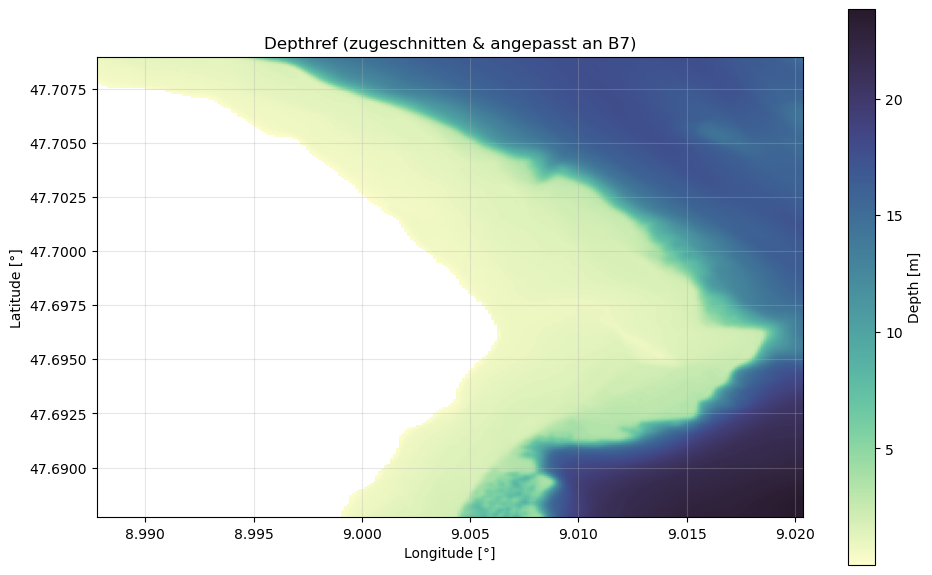


 Depth1 gefunden. Starte Zuschnitt...


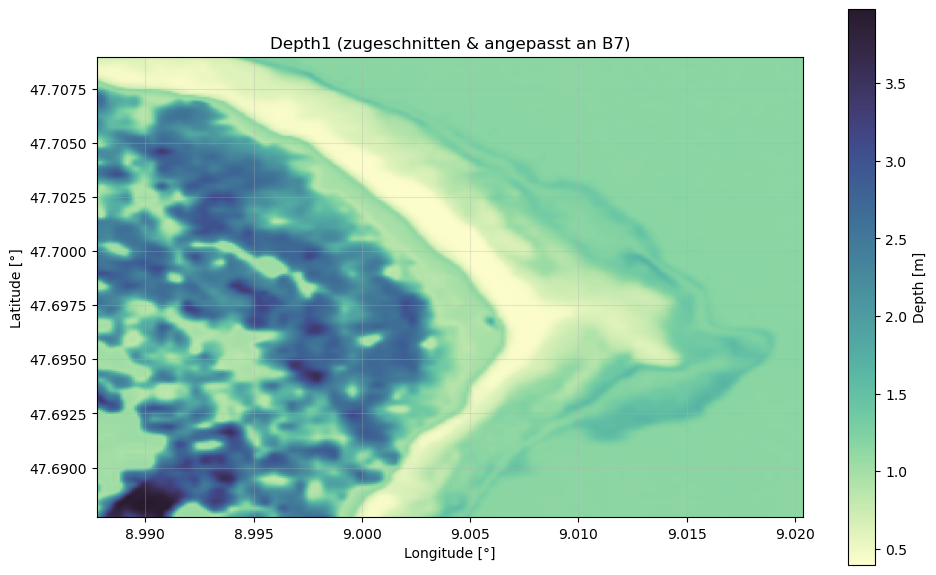


 Depth2 gefunden. Starte Zuschnitt...


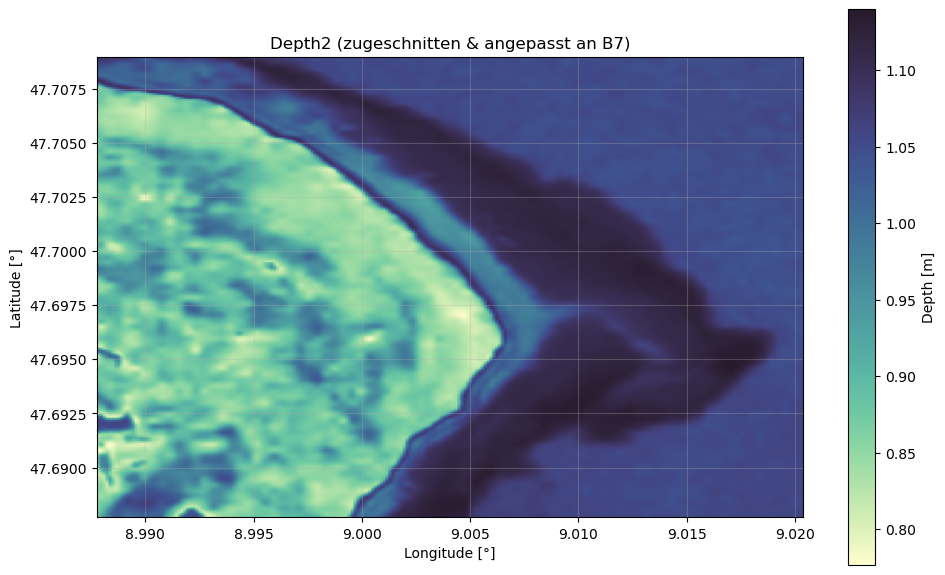


 Depth3 gefunden. Starte Zuschnitt...


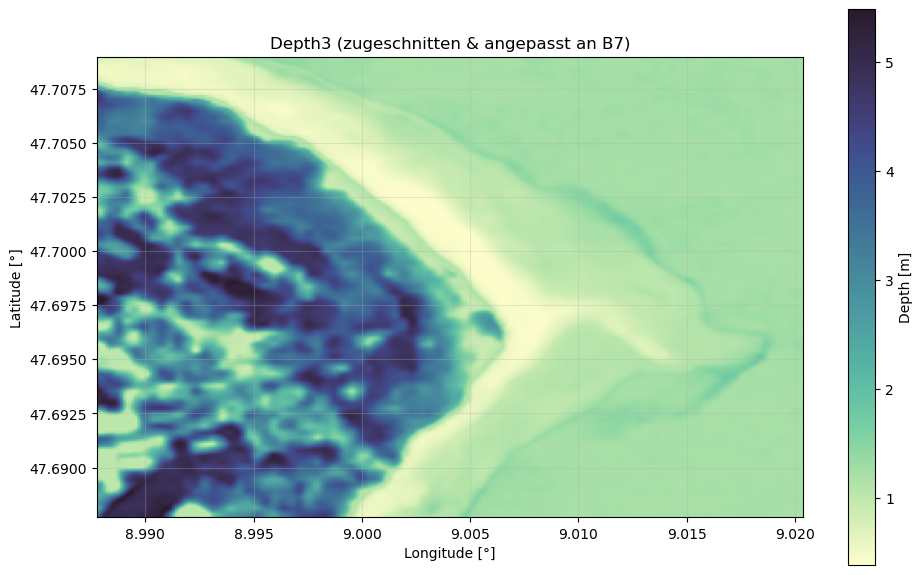


 Depth4 gefunden. Starte Zuschnitt...


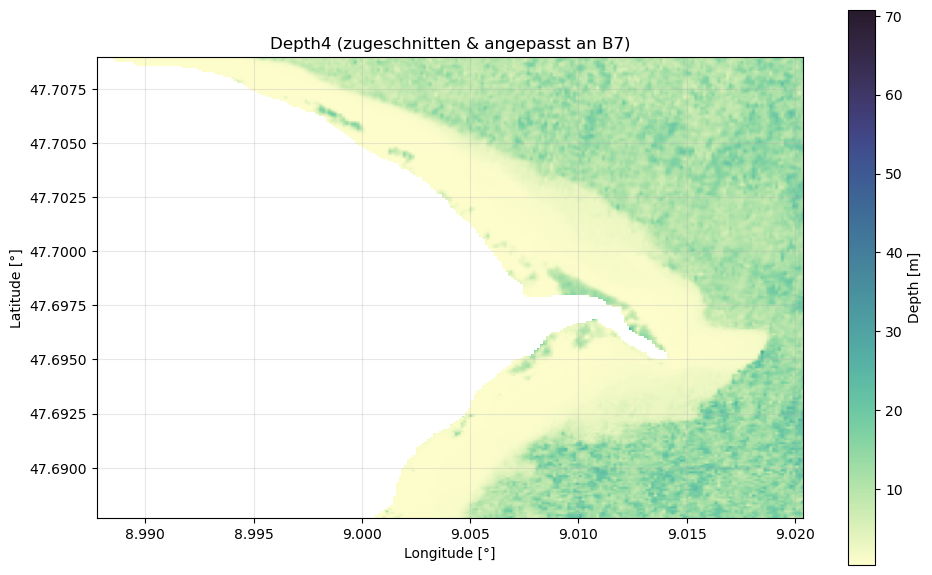


 Depth5 gefunden. Starte Zuschnitt...


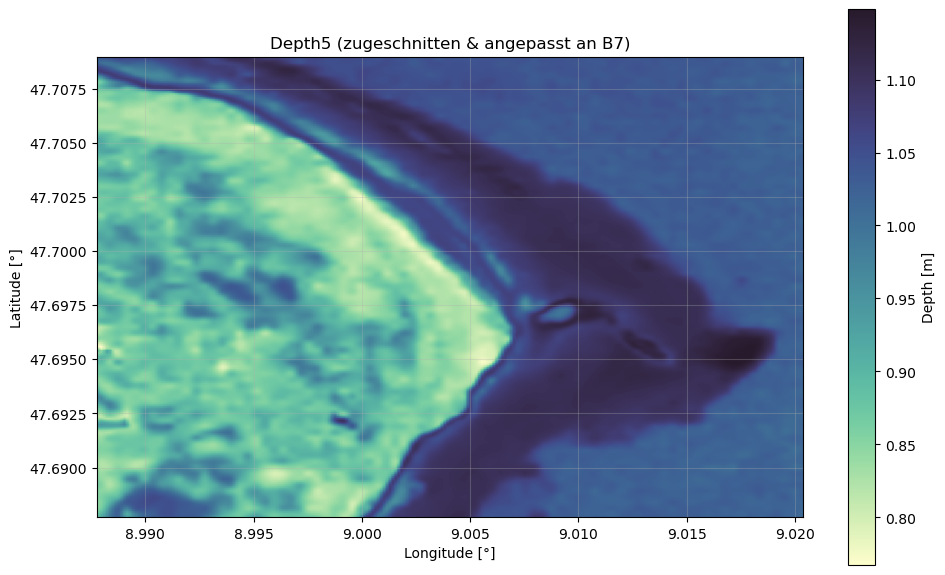


 Depth6 gefunden. Starte Zuschnitt...


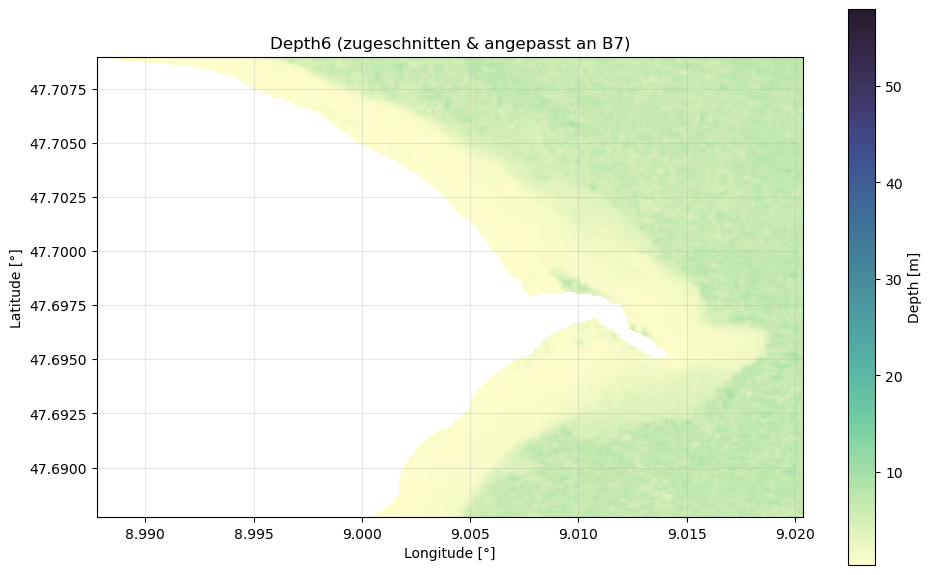


 Depth7 gefunden. Starte Zuschnitt...


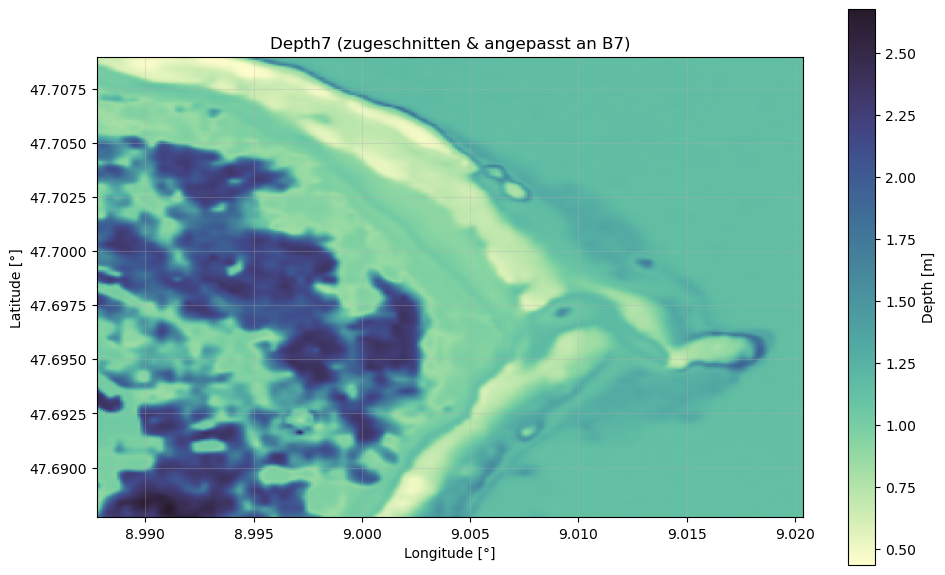


 Depth1_unc gefunden. Starte Zuschnitt...


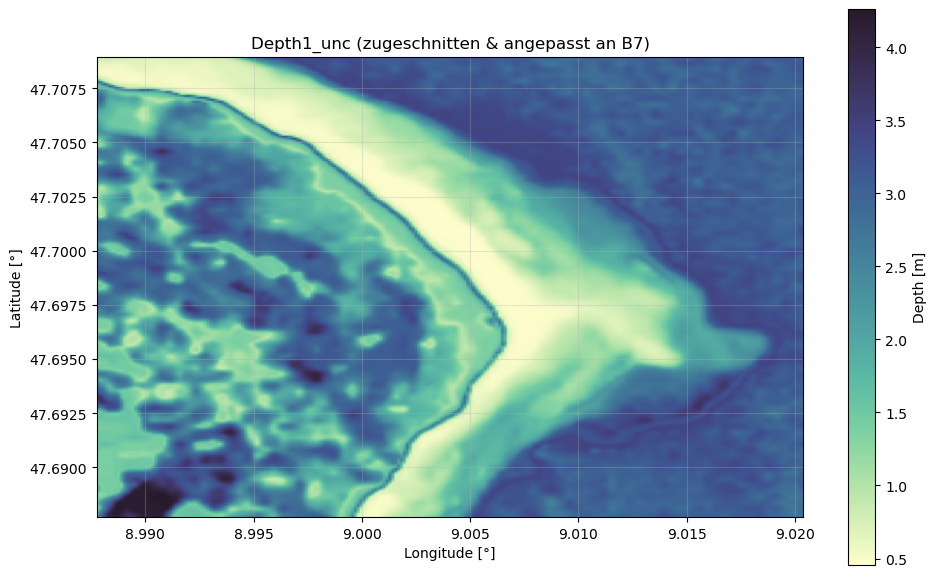


 Depth2_unc gefunden. Starte Zuschnitt...


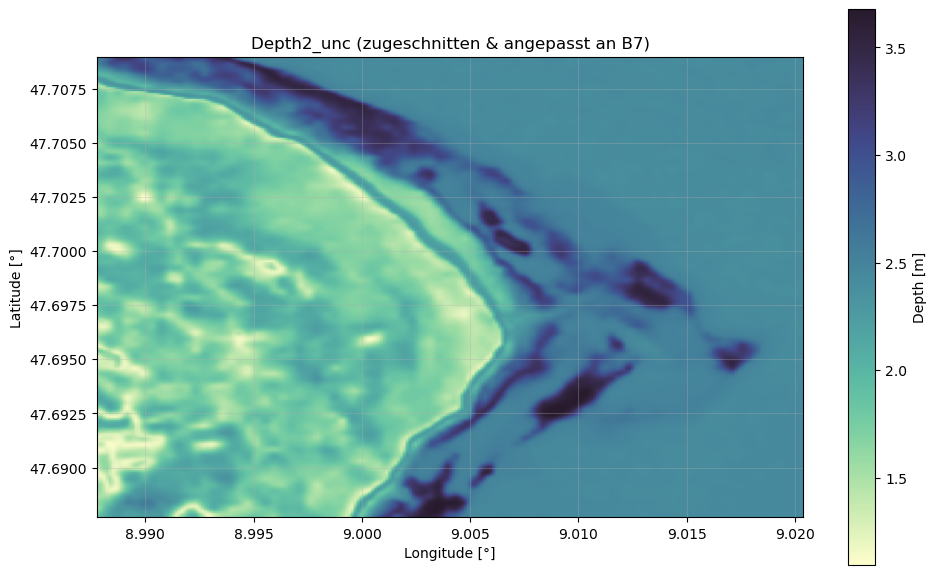


 Depth3_unc gefunden. Starte Zuschnitt...


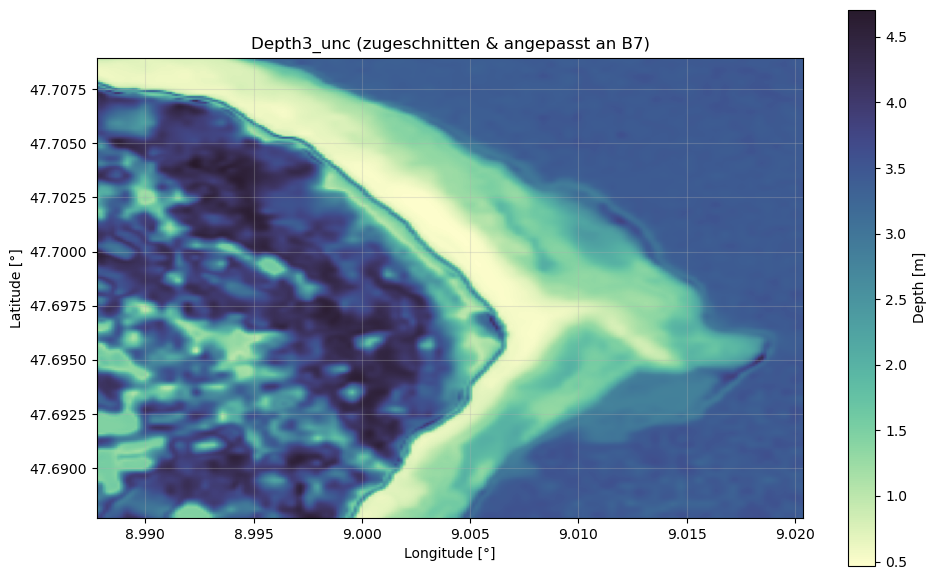


 Depth4_unc gefunden. Starte Zuschnitt...


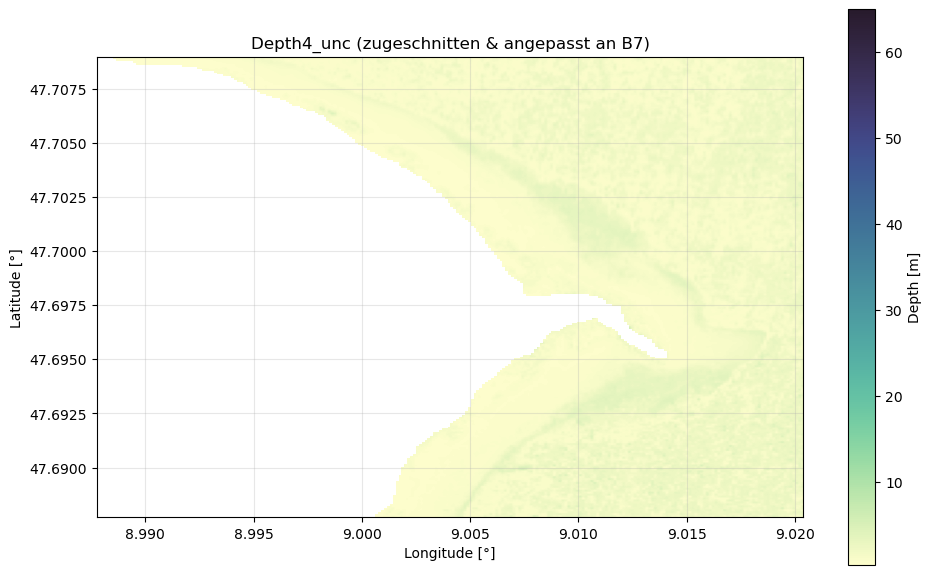


 Depth5_unc gefunden. Starte Zuschnitt...


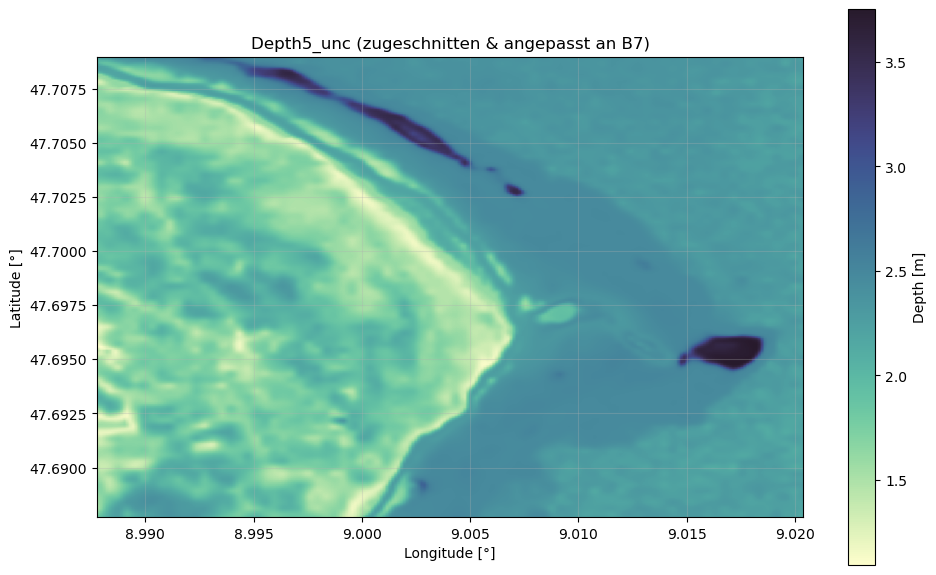


 Depth6_unc gefunden. Starte Zuschnitt...


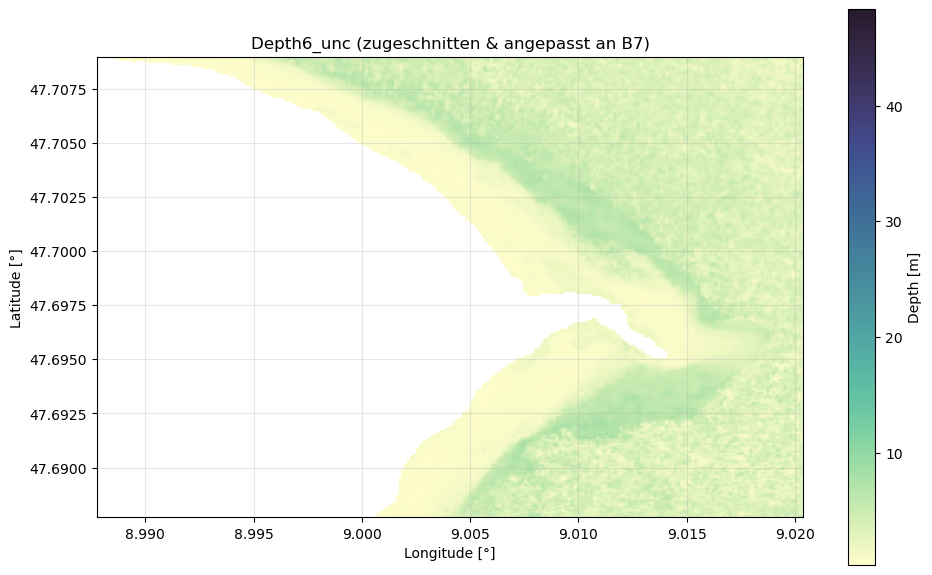


 Depth7_unc gefunden. Starte Zuschnitt...


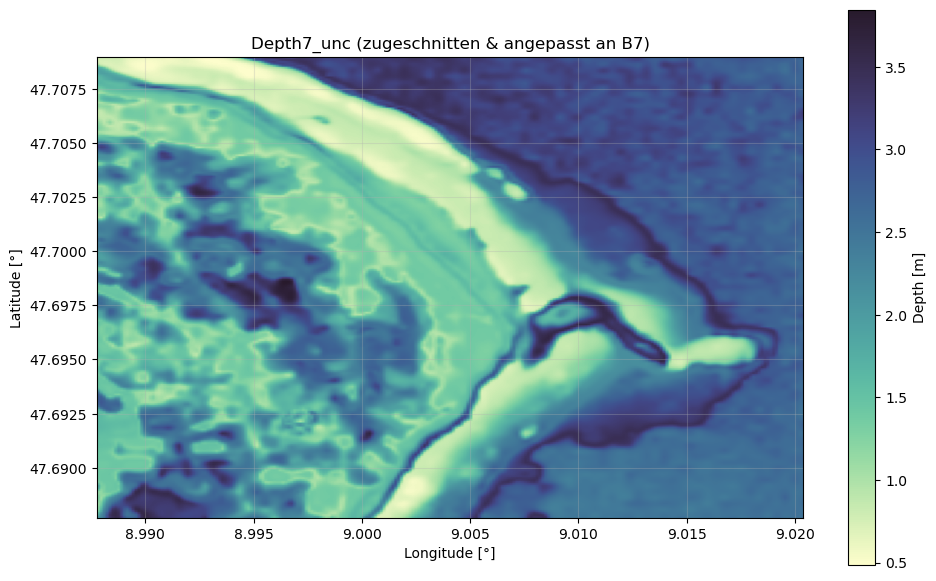

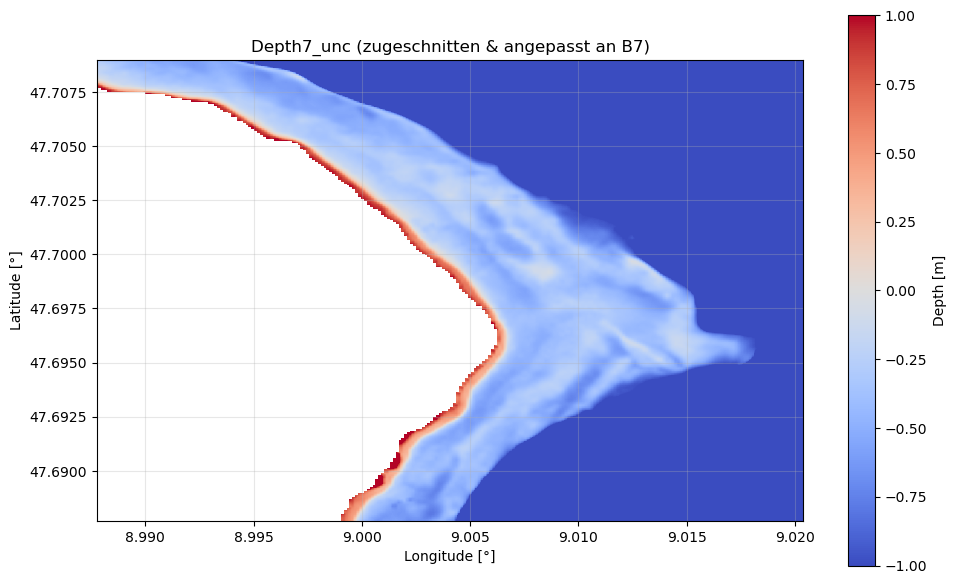

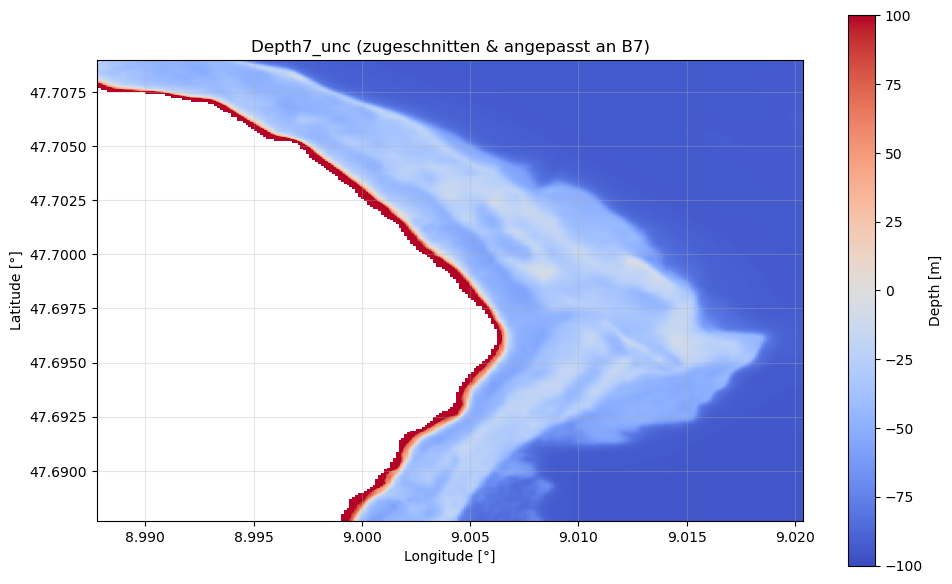

In [59]:
def match_reference_tiff_to_band_depth(tiff_path, extent_b7, shape_b7, b7_crs="EPSG:4326", tiff_crs="EPSG:32632", label=""):
    from pyproj import Transformer
    import rasterio
    from rasterio.windows import from_bounds
    from rasterio.warp import Resampling
  
    if len(shape_b7) == 3:
        height, width = shape_b7[0:2]
    elif len(shape_b7) == 2:
        height, width = shape_b7
    else:
        raise ValueError(" Ungültiges Format für shape_b7")

    transformer = Transformer.from_crs(b7_crs, tiff_crs, always_xy=True)
    x_min, y_min = transformer.transform(extent_b7[0], extent_b7[2])
    x_max, y_max = transformer.transform(extent_b7[1], extent_b7[3])

    with rasterio.open(tiff_path) as src:
        try:
            window = from_bounds(x_min, y_min, x_max, y_max, transform=src.transform)
            raw_data = src.read(
                1,
                window=window,
                out_shape=(height, width),
                resampling=Resampling.bilinear
            )

            fill_value = 0
            if src.nodata is not None:
                raw_data = np.where(raw_data == src.nodata, fill_value, raw_data)

            src_data = np.nan_to_num(raw_data, nan=fill_value)
            src_data[src_data == 0] = np.nan

        except Exception as e:
            print(f" Fehler beim Lesen & Interpolieren ({label}): {e}")
            return None

    plt.figure(figsize=(10, 6))
    plt.imshow(src_data, cmap=cmocean.cm.deep, extent=extent_b7, origin='upper')
    plt.title(f"{label} (zugeschnitten & angepasst an B7)")
    plt.xlabel("Longitude [°]")
    plt.ylabel("Latitude [°]")
    plt.colorbar(label=f"Depth [m]")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    return src_data
def plot_comparison(name_x, data_x, name_y, data_y, max_depth=None):
    from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
    import matplotlib.pyplot as plt
    valid_mask = ~np.isnan(data_x) & ~np.isnan(data_y)
    if max_depth is not None:
        valid_mask &= data_y <= max_depth

    x = data_x[valid_mask].flatten()
    y = data_y[valid_mask].flatten()

    if len(x) == 0:
        print(f" Keine gültigen Daten für {name_x} vs. {name_y} bis {max_depth} m.")
        return
    r2 = r2_score(y, x)
    rmse = mean_squared_error(y, x, squared=False)
    mae = mean_absolute_error(y, x)
    bias = np.mean(x - y)
    
    coeffs = np.polyfit(x, y, 1)
    poly_eqn = np.poly1d(coeffs)
    x_line = np.linspace(min(x.min(), y.min()), max(x.max(), y.max()), 100)
    y_line = poly_eqn(x_line)

    distance = np.abs(x - y)

    fig, ax = plt.subplots(figsize=(6.5, 5)) 
    sc = ax.scatter(x, y, c=distance, cmap='hot', s=10, alpha=0.6)
    ax.plot(x_line, x_line, color='black', linestyle='--', label='1:1 Linie')
    ax.plot(x_line, y_line, color='red', label='Regressionslinie')

    ax.set_xlabel(f"{name_x} depth [m]")
    ax.set_ylabel(f"{name_y} depth [m]")
    ax.grid(alpha=0.3)
    ax.legend(loc="lower right")

    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label("Abstand zur 1:1-Linie [m]")

    stats_text = (
        f"$N$ = {len(x)}\n"
        f"$R^2$ = {r2:.2f}\n"
        f"RMSE = {rmse:.2f} m\n"
        f"MAE = {mae:.2f} m\n"
        f"Bias = {bias:.2f} m"
    )
    ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, fontsize=12,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    plt.tight_layout()
    plt.show()

if mission =="Sentinel":
    R_rs_value = all_corrected_images[0]["B3"]
elif mission =="Landsat":
    R_rs_value = all_corrected_images[0]["SR_B3"]
shape_b7 = R_rs_value.shape
extent_b7 = [
    region.bounds().coordinates().getInfo()[0][0][0],  # lon_min
    region.bounds().coordinates().getInfo()[0][2][0],  # lon_max
    region.bounds().coordinates().getInfo()[0][0][1],  # lat_min
    region.bounds().coordinates().getInfo()[0][2][1],  # lat_max
]

reference_paths = {
    "Depthref": "/Users/annikaklein/Desktop/Masterarbeit /Beispielarea/bathymetry_corrected.tif",
    "Depth1": "/Users/annikaklein/Desktop/Masterarbeit /C2RCC Bilder/download-2/2014_03_29_Lan/tiff/20140329_land_kd90_C2RCC.tif",
    "Depth2": "/Users/annikaklein/Desktop/Masterarbeit /C2RCC Bilder/download-2/2014_03_20_Lan/tiff/20140320_land_kd90_C2RCC.tif",
    "Depth3": "/Users/annikaklein/Desktop/Masterarbeit /C2RCC Bilder/download-2/2014_04_14_Lan/tiff/20140414_land_kd90_C2RCC.tif",
    "Depth4": "/Users/annikaklein/Desktop/Masterarbeit /C2RCC Bilder/download-2/2025_03_18_Sen/tiff/20250318_sen_kd90_C2RCC.tif",
    "Depth5": "/Users/annikaklein/Desktop/Masterarbeit /C2RCC Bilder/download-2/2025_03_18_Lan/tiff/20250318_land_kd90_C2RCC.tif",
    "Depth6": "/Users/annikaklein/Desktop/Masterarbeit /C2RCC Bilder/download-2/2025_03_19_Sen/tiff/20250319_sen_kdmax90_C2RCC.tif",
    "Depth7": "/Users/annikaklein/Desktop/Masterarbeit /C2RCC Bilder/download-2/2025_03_19_Lan/tiff/20250319_land_kdmax_C2RCC.tif",

    "Depth1_unc": "/Users/annikaklein/Desktop/Masterarbeit /C2RCC Bilder/download-2/2014_03_29_Lan/tiff/20140329_land_kd90_unc_C2RCC.tif",
    "Depth2_unc": "/Users/annikaklein/Desktop/Masterarbeit /C2RCC Bilder/download-2/2014_03_20_Lan/tiff/20140320_land_kd90_unc_C2RCC.tif",
    "Depth3_unc": "/Users/annikaklein/Desktop/Masterarbeit /C2RCC Bilder/download-2/2014_04_14_Lan/tiff/20140414_land_kd90_unc_C2RCC.tif",
    "Depth4_unc": "/Users/annikaklein/Desktop/Masterarbeit /C2RCC Bilder/download-2/2025_03_18_Sen/tiff/20250318_sen_kd90_unc_C2RCC.tif",
    "Depth5_unc": "/Users/annikaklein/Desktop/Masterarbeit /C2RCC Bilder/download-2/2025_03_18_Lan/tiff/20250318_land_kd90_unc_C2RCC.tif",
    "Depth6_unc": "/Users/annikaklein/Desktop/Masterarbeit /C2RCC Bilder/download-2/2025_03_19_Sen/tiff/20250319_sen_kdmax90_unc_C2RCC.tif",
    "Depth7_unc": "/Users/annikaklein/Desktop/Masterarbeit /C2RCC Bilder/download-2/2025_03_19_Lan/tiff/20250319_land_kd90_unc_C2RCC.tif"


}

reference_data = {}

for label, path in reference_paths.items():
    if os.path.exists(path):
        print(f"\n {label} gefunden. Starte Zuschnitt...")
        aligned_data = match_reference_tiff_to_band_depth(path, extent_b7, shape_b7, label=label)
        reference_data[label] = aligned_data
    else:
        print(f"\n {label} nicht gefunden: {path}")
        reference_data[label] = None
        
depth_aligned1 = reference_data["Depthref"]
depth_aligned2 = reference_data["Depth1"]
#depth_aligned2 = reference_data["Depth2"]
#depth_aligned2 = reference_data["Depth3"]
#depth_aligned2 = reference_data["Depth4"]
#depth_aligned2 = reference_data["Depth5"]
#depth_aligned2 = reference_data["Depth6"]
#depth_aligned2 = reference_data["Depth7"]


diff_references=depth_aligned2-depth_aligned1
rel_diff_references = 100 * (depth_aligned2 - depth_aligned1) / depth_aligned1
max_abs_ref=np.nanmax(np.abs(diff_references))
max_abs_ref_rel=np.nanmax(np.abs(rel_diff_references))

plt.figure(figsize=(10, 6))
plt.imshow(diff_references, cmap="coolwarm", extent=extent_b7, origin='upper', vmin=-1, vmax=1)
plt.title(f"{label} (zugeschnitten & angepasst an B7)")
plt.xlabel("Longitude [°]")
plt.ylabel("Latitude [°]")
plt.colorbar(label=f"Depth [m]")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
plt.imshow(rel_diff_references, cmap="coolwarm", extent=extent_b7, origin='upper', vmin=-100, vmax=100)
plt.title(f"{label} (zugeschnitten & angepasst an B7)")
plt.xlabel("Longitude [°]")
plt.ylabel("Latitude [°]")
plt.colorbar(label=f"Depth [m]")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

### If no Data: -> Estimate depth

Processing Image_1 for depth calculation...
Depth calculated for Image 1, Band SR_B1.


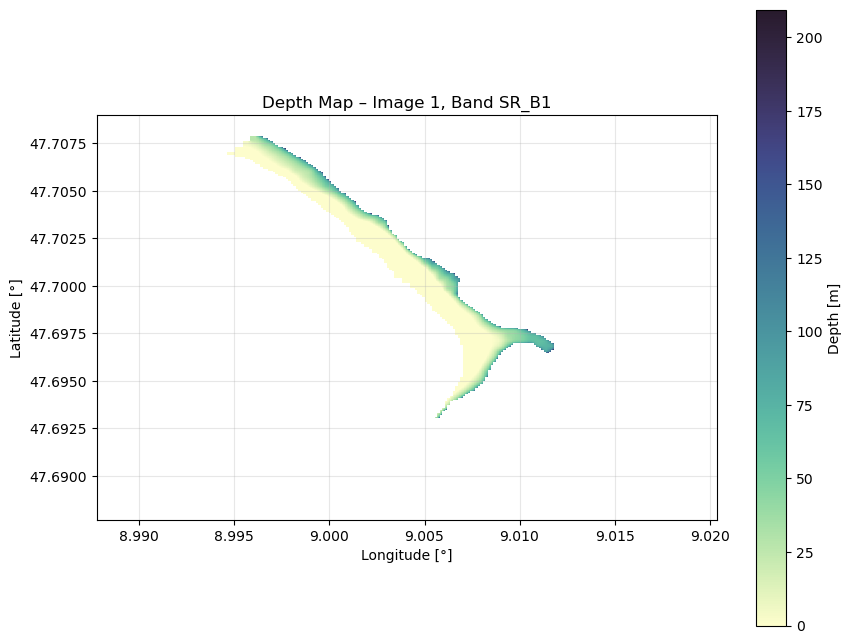

Depth calculated for Image 1, Band SR_B2.


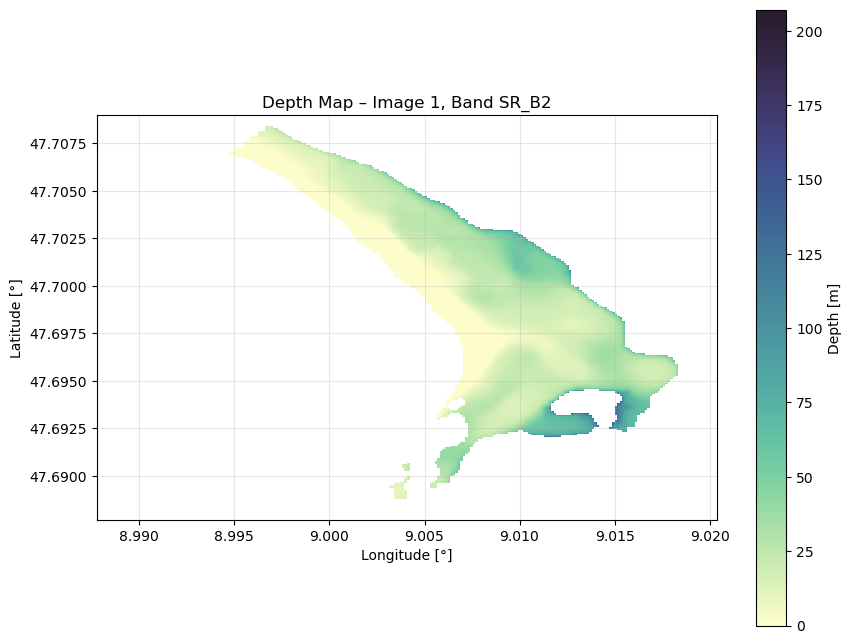

Depth calculated for Image 1, Band SR_B3.


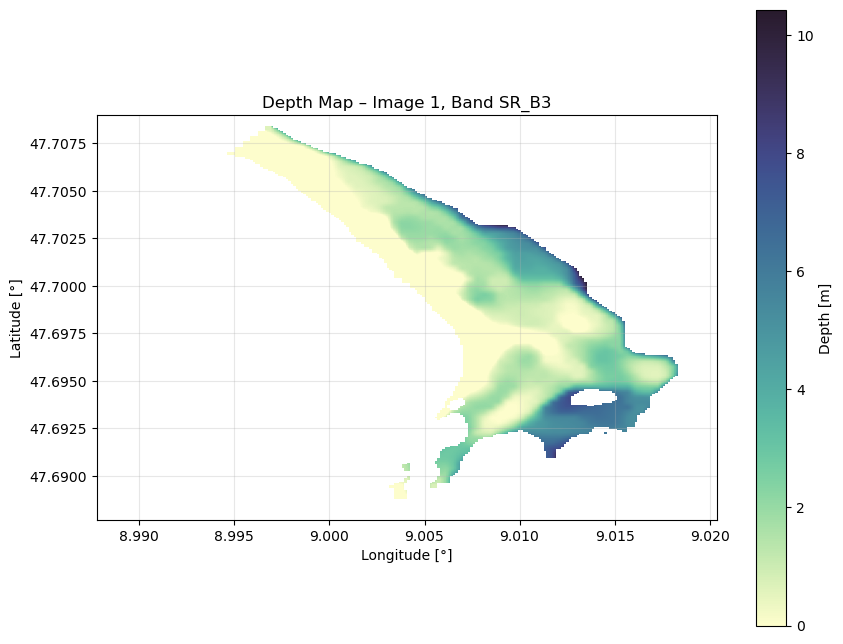

Depth calculated for Image 1, Band SR_B4.


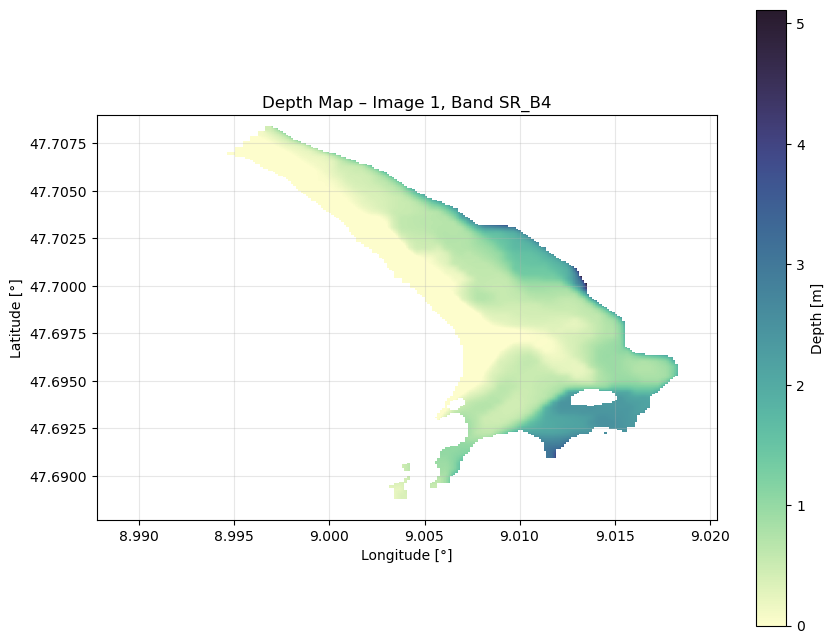

Depth calculated for Image 1, Band SR_B5.


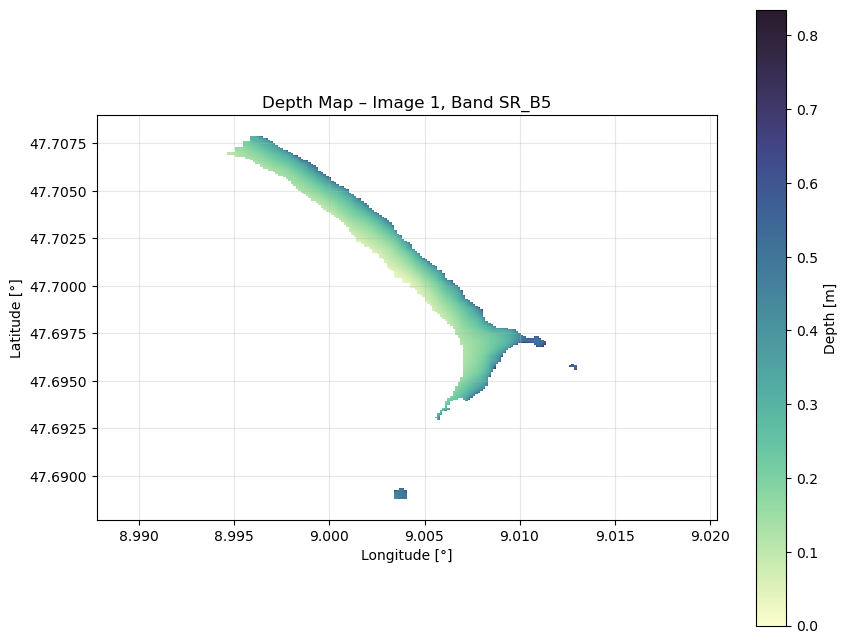

Depth calculated for Image 1, Band SR_B6.


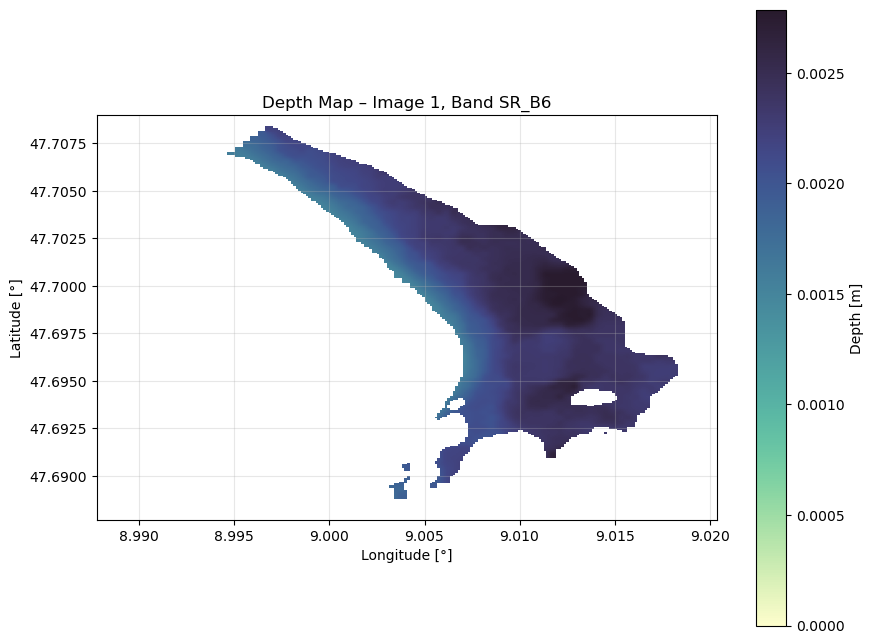

In [60]:
output_folder = "depth_tiffs"
os.makedirs(output_folder, exist_ok=True)
depth_results=[]

for image_idx, image_key in enumerate(metadata_dict.keys()):
    print(f"Processing {image_key} for depth calculation...")
    metadata = metadata_dict[image_key]

    for band in bands:
        try:
            R_B = empirical_coefficients[band]['Rb_LC']
            ars1 = parameters.ars1
            ars2 = parameters.ars2
        except KeyError:
            print(f"Missing parameters for Band {band}. Skipping...")
            continue

        w_value = next((r['w'] for r in results_w if r['Image'] == image_idx + 1 and r['Band'] == band), None)
        Kd = next((r['Kd'] for r in kd_results if r['Image'] == image_idx + 1 and r['Band'] == band), None)
        r_rs_inf = next((r['Rrs_infinity'] for r in rrs_infinity_results if r['Image'] == image_idx + 1 and r['Band'] == band), None)

        if w_value is None or Kd is None or r_rs_inf is None:
            print(f"Skipping band {band} for {image_key} due to missing precomputed values.")
            continue

        Ov = metadata[f"Subsurface Viewing Angle {band} (θv) (rad)"]

        if band not in all_corrected_images[image_idx]:
            print(f" Band {band} fehlt in den korrigierten Bildern für Image {image_idx + 1}, überspringe...")
            continue

        r_rs_measured_array = all_corrected_images[image_idx][band]
        depth_array = np.full(r_rs_measured_array.shape, np.nan)
        valid_mask = r_rs_measured_array > 0

        depth_array[valid_mask] = calculate_depth_Albert(
            ars1, ars2,
            r_rs_measured_array[valid_mask],
            r_rs_inf,
            R_B,
            Kd,
            Ov
        )

        depth_results.append({
            "Image": image_idx + 1,
            "Band": band,
            "Depth": depth_array
        })

        print(f"Depth calculated for Image {image_idx + 1}, Band {band}.")

        bounds = region.bounds().coordinates().getInfo()[0]
        xmin, ymin = bounds[0][0], bounds[0][1]
        xmax, ymax = bounds[2][0], bounds[2][1]

        transform = from_bounds(xmin, ymin, xmax, ymax, depth_array.shape[1], depth_array.shape[0])
        crs = "EPSG:4326"  # ggf. anpassen

        #out_path = os.path.join(output_folder, f"depth_image{image_idx + 1}_{band}.tif")

        #with rasterio.open(
        #    out_path,
        #    "w",
        #    driver="GTiff",
         #   height=depth_array.shape[0],
        #    width=depth_array.shape[1],
        #    count=1,
        #    dtype="float32",
         #   crs=crs,
        #    transform=transform,
        #    nodata=np.nan
      #  ) as dst:
        #    dst.write(depth_array.astype("float32"))

        #print(f"   ➝ GeoTIFF gespeichert: {out_path}")

        # Optional: Visualisierung
        fig, ax = plt.subplots(figsize=(10, 8))
        im = ax.imshow(depth_array, cmap=cmocean.cm.deep, extent=[xmin, xmax, ymin, ymax], vmin=0)
        ax.set_title(f"Depth Map – Image {image_idx + 1}, Band {band}")
        cbar = plt.colorbar(im, ax=ax)
        cbar.set_label("Depth [m]")
        ax.set_xlabel("Longitude [°]")
        ax.set_ylabel("Latitude [°]")
        plt.grid(alpha=0.3)
        plt.show()


Creating Mosaik for Image 1...


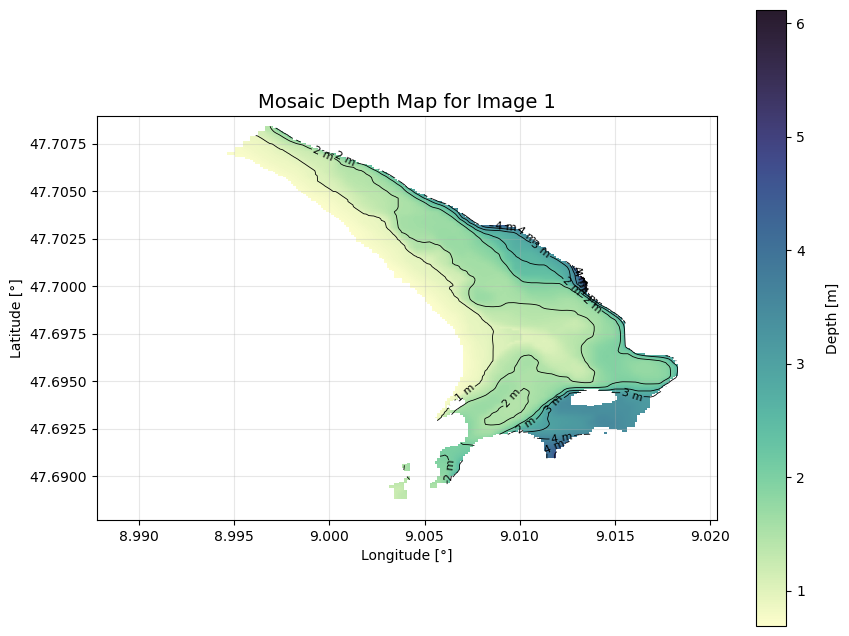

 Mosaik-Tiefe als TIFF gespeichert: mosaic_depth_image_1.tif

 Band-Mosaik abgeschlossen.


In [61]:
depth_mosaic_results = []

num_bands = len(bands)  
num_images = len(depth_results) // num_bands  
contour_levels = np.arange(0, 10, 0.5)

if mission=="Sentinel":
    for image_idx in range(num_images):  
        print(f"Creating Mosaik for Image {image_idx + 1}...")
        try:
            depth_b1 = np.squeeze(np.nan_to_num(depth_results[image_idx * num_bands + 0]["Depth"], nan=-1))
            depth_b2 = np.squeeze(np.nan_to_num(depth_results[image_idx * num_bands + 1]["Depth"], nan=-1))
            depth_b3 = np.squeeze(np.nan_to_num(depth_results[image_idx * num_bands + 2]["Depth"], nan=-1))
            depth_b4 = np.squeeze(np.nan_to_num(depth_results[image_idx * num_bands + 3]["Depth"], nan=-1))
            depth_b5 = np.squeeze(np.nan_to_num(depth_results[image_idx * num_bands + 4]["Depth"], nan=-1))
            depth_b6 = np.squeeze(np.nan_to_num(depth_results[image_idx * num_bands + 5]["Depth"], nan=-1))
            depth_b7 = np.squeeze(np.nan_to_num(depth_results[image_idx * num_bands + 6]["Depth"], nan=-1))
            depth_b11 = np.squeeze(np.nan_to_num(depth_results[image_idx * num_bands +7]["Depth"], nan=-1))
        except IndexError:
            print(f"No valid depth data for image {image_idx + 1}, skipping...")
            continue

        reference_shape = depth_b3.shape  
        mosaic_depth = np.full(reference_shape, np.nan, dtype=np.float32)

        mosaic_depth = depth_b4.copy()
        mosaic_depth=mosaic_depth*2.25

        invalid_b4 = (np.isnan(depth_b4)) | (depth_b4 < 0)

        valid_b6 = (~np.isnan(depth_b6)) & (depth_b6 >= 0)

        condition1 = invalid_b4 & valid_b6

        condition2 = (depth_b6 > depth_b4) & valid_b6 & (~invalid_b4)
        
        depth_b6=depth_b6*2.75
        depth_b7=depth_b7*3.25
        mosaic_depth = np.where(condition1 | condition2, depth_b6, mosaic_depth)

        still_invalid = (np.isnan(mosaic_depth)) | (mosaic_depth < 0)
        valid_b7 = (~np.isnan(depth_b7)) & (depth_b7 >= 0)
        mosaic_depth = np.where(still_invalid & valid_b7, depth_b7, mosaic_depth)
    
        mosaic_depth[mosaic_depth < 0] = np.nan
        #mosaic_depth=mosaic_depth*2.5

        mosaic_depth = median_filter(mosaic_depth, size=2) 

        mosaic_depth[np.isnan(depth_b4)] = np.nan

        depth_mosaic_results.append({
            "Image": image_idx + 1,
            "Mosaic_Depth": mosaic_depth
        })

        fig, ax = plt.subplots(figsize=(10, 8))
        im = ax.imshow(
            mosaic_depth,
            cmap=cmocean.cm.deep,
            extent=[
                region.bounds().coordinates().getInfo()[0][0][0], 
                region.bounds().coordinates().getInfo()[0][2][0], 
                region.bounds().coordinates().getInfo()[0][0][1], 
                region.bounds().coordinates().getInfo()[0][2][1]
            ]
        )
        
        lon_min, lon_max = region.bounds().coordinates().getInfo()[0][0][0], region.bounds().coordinates().getInfo()[0][2][0]
        lat_min, lat_max = region.bounds().coordinates().getInfo()[0][0][1], region.bounds().coordinates().getInfo()[0][2][1]
        nrows, ncols = mosaic_depth.shape
        lon_grid = np.linspace(lon_min, lon_max, ncols)
        lat_grid = np.linspace(lat_max, lat_min, nrows) 
        Lon, Lat = np.meshgrid(lon_grid, lat_grid)

        contours = ax.contour(Lon, Lat, mosaic_depth, levels=contour_levels, colors='black', linewidths=0.6)
        ax.clabel(contours, inline=True, fontsize=8, fmt='%0.1f m')
        
        ax.set_title(f"Mosaic Depth Map for Image {image_idx + 1}", fontsize=14)
        ax.set_xlabel("Longitude [°]")
        ax.set_ylabel("Latitude [°]")
        plt.grid(alpha=0.3)
        cbar = plt.colorbar(im, ax=ax)
        cbar.set_label("Depth (m)", rotation=270, labelpad=15)

        plt.show()

        xmin, xmax = region.bounds().coordinates().getInfo()[0][0][0], region.bounds().coordinates().getInfo()[0][2][0]
        ymin, ymax = region.bounds().coordinates().getInfo()[0][0][1], region.bounds().coordinates().getInfo()[0][2][1]

        transform = from_bounds(xmin, ymin, xmax, ymax, mosaic_depth.shape[1], mosaic_depth.shape[0])
        crs = "EPSG:4326" 
        out_tif_path = f"mosaic_depth_image_{image_idx + 1}.tif"

        with rasterio.open(
            out_tif_path,
            "w",
            driver="GTiff",
            height=mosaic_depth.shape[0],
            width=mosaic_depth.shape[1],
            count=1,
            dtype=mosaic_depth.dtype,
            crs=crs,
            transform=transform,
            nodata=np.nan
            ) as dst:
            dst.write(mosaic_depth, 1)

        print(f" Mosaik-Tiefe als TIFF gespeichert: {out_tif_path}")
    print("\n Band-Mosaik abgeschlossen.")

if mission=="Landsat":
    for image_idx in range(num_images):  
        print(f"Creating Mosaik for Image {image_idx + 1}...")
        try:
            depth_b1 = np.squeeze(np.nan_to_num(depth_results[image_idx * num_bands + 0]["Depth"], nan=-1))
            depth_b2 = np.squeeze(np.nan_to_num(depth_results[image_idx * num_bands + 1]["Depth"], nan=-1))
            depth_b3 = np.squeeze(np.nan_to_num(depth_results[image_idx * num_bands + 2]["Depth"], nan=-1))
            depth_b4 = np.squeeze(np.nan_to_num(depth_results[image_idx * num_bands + 3]["Depth"], nan=-1))
            depth_b5 = np.squeeze(np.nan_to_num(depth_results[image_idx * num_bands + 4]["Depth"], nan=-1))
            depth_b6 = np.squeeze(np.nan_to_num(depth_results[image_idx * num_bands + 5]["Depth"], nan=-1))
        except IndexError:
            print(f"No valid depth data for image {image_idx + 1}, skipping...")
            continue

        reference_shape = depth_b3.shape  
        mosaic_depth = np.full(reference_shape, np.nan, dtype=np.float32)

        mosaic_depth = depth_b4.copy()
        mosaic_depth[mosaic_depth < 0] = np.nan
        mosaic_depth= mosaic_depth+1
        #mosaic_depth=mosaic_depth*2.25
        #depth_b5=depth_b5*2.25
        depth_b6=depth_b6*475

        invalid_b4 = (np.isnan(depth_b4)) | (depth_b4 < 0)
        #invalid_b5 = (np.isnan(depth_b5)) | (depth_b5 < 0)
        #valid_b5 = (~np.isnan(depth_b5)) & (depth_b5 >= 0)
        valid_b6 = (~np.isnan(depth_b6)) & (depth_b6 >= 0)
        #mosaic_depth = np.where(invalid_b4 & valid_b5, depth_b5, mosaic_depth)
        mosaic_depth = np.where(invalid_b4 & valid_b6, depth_b6, mosaic_depth)
        
        #valid_b5 = (~np.isnan(depth_b5)) & (depth_b5 >= 0)

        #condition1 = invalid_b4 & valid_b5

        #condition2 = (depth_b4 > depth_b5) & valid_b5 & (~invalid_b4)
        
        #depth_b5=depth_b5*2.75
       # depth_b6=depth_b6*3.25
        #mosaic_depth = np.where(condition1 | condition2, depth_b5, mosaic_depth)

        #still_invalid = (np.isnan(mosaic_depth)) | (mosaic_depth < 0)
        #valid_b6 = (~np.isnan(depth_b6)) & (depth_b6 >= 0)
        #mosaic_depth = np.where(still_invalid & valid_b6, depth_b6, mosaic_depth)
        mosaic_depth[mosaic_depth < 0] = np.nan

        depth_mosaic_results.append({
            "Image": image_idx + 1,
            "Mosaic_Depth": mosaic_depth
        })

        fig, ax = plt.subplots(figsize=(10, 8))
        im = ax.imshow(
            mosaic_depth,
            cmap=cmocean.cm.deep,
            extent=[
                region.bounds().coordinates().getInfo()[0][0][0], 
                region.bounds().coordinates().getInfo()[0][2][0], 
                region.bounds().coordinates().getInfo()[0][0][1], 
                region.bounds().coordinates().getInfo()[0][2][1]
            ]
        )
        
        lon_min, lon_max = region.bounds().coordinates().getInfo()[0][0][0], region.bounds().coordinates().getInfo()[0][2][0]
        lat_min, lat_max = region.bounds().coordinates().getInfo()[0][0][1], region.bounds().coordinates().getInfo()[0][2][1]
        nrows, ncols = mosaic_depth.shape
        lon_grid = np.linspace(lon_min, lon_max, ncols)
        lat_grid = np.linspace(lat_max, lat_min, nrows) 
        Lon, Lat = np.meshgrid(lon_grid, lat_grid)

        contours = ax.contour(Lon, Lat, mosaic_depth, levels=contour_levels, colors='black', linewidths=0.6)
        ax.clabel(contours, inline=True, fontsize=8, fmt='%1.0f m')
        
        ax.set_title(f"Mosaic Depth Map for Image {image_idx + 1}", fontsize=14)
        ax.set_xlabel("Longitude [°]")
        ax.set_ylabel("Latitude [°]")
        plt.grid(alpha=0.3)
        cbar = plt.colorbar(im, ax=ax)
        cbar.set_label("Depth [m]", rotation=90, labelpad=15)

        plt.show()

        xmin, xmax = region.bounds().coordinates().getInfo()[0][0][0], region.bounds().coordinates().getInfo()[0][2][0]
        ymin, ymax = region.bounds().coordinates().getInfo()[0][0][1], region.bounds().coordinates().getInfo()[0][2][1]

        transform = from_bounds(xmin, ymin, xmax, ymax, mosaic_depth.shape[1], mosaic_depth.shape[0])
        crs = "EPSG:4326"  
        out_tif_path = f"mosaic_depth_image_{image_idx + 1}.tif"

        with rasterio.open(
            out_tif_path,
            "w",
            driver="GTiff",
            height=mosaic_depth.shape[0],
            width=mosaic_depth.shape[1],
            count=1,
            dtype=mosaic_depth.dtype,
            crs=crs,
            transform=transform,
            nodata=np.nan
            ) as dst:
            dst.write(mosaic_depth, 1)

        print(f" Mosaik-Tiefe als TIFF gespeichert: {out_tif_path}")
    print("\n Band-Mosaik abgeschlossen.")

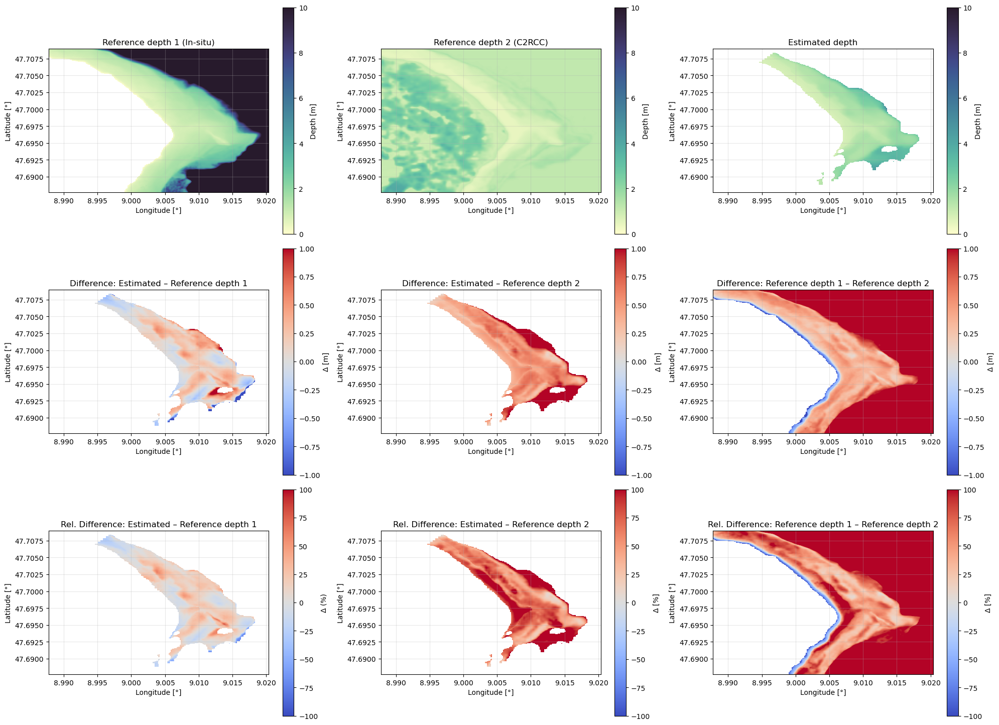

In [151]:
for image_idx in range(num_images):
    mosaic = depth_mosaic_results[image_idx]["Mosaic_Depth"]
    ref1=depth_aligned1
    ref2=depth_aligned2
    
    if mosaic is None or ref1 is None or ref2 is None:
        print(f" Fehlende Daten für Bild {image_idx}, überspringe...")
        continue

    diff1 = np.full_like(mosaic, np.nan)
    diff1 = mosaic - ref1

    diff2 = np.full_like(mosaic, np.nan)
    diff2 = mosaic - ref2

    diff_ref12 = np.full_like(mosaic, np.nan)
    diff_ref12 = ref1 - ref2

    rel_diff1 = np.full_like(mosaic, np.nan)
    rel_diff1 = 100 * diff1 / ref1

    rel_diff2 = np.full_like(mosaic, np.nan)
    rel_diff2 = 100 * diff2 / ref2

    rel_diff_ref12 = np.full_like(mosaic, np.nan)
    rel_diff_ref12 = 100 * diff_ref12 / ref2
 
    fig, axs = plt.subplots(3, 3, figsize=(20, 15))

    vmax = 10  
    max_abs1 = np.nanmax(np.abs(diff1))
    max_abs2 = np.nanmax(np.abs(diff2))
    max_abs_ref = np.nanmax(np.abs(diff_ref12))

    im0 = axs[0, 0].imshow(ref1, cmap=cmocean.cm.deep, vmin=0, vmax=vmax,extent=extent_b7)
    axs[0, 0].set_title("Reference depth 1 (In-situ)")
    plt.colorbar(im0, ax=axs[0, 0], label="Depth [m]")

    im1 = axs[0, 1].imshow(ref2, cmap=cmocean.cm.deep, vmin=0, vmax=vmax,extent=extent_b7)
    axs[0, 1].set_title("Reference depth 2 (C2RCC)")
    plt.colorbar(im1, ax=axs[0, 1], label="Depth [m]")

    im2 = axs[0, 2].imshow(mosaic, cmap=cmocean.cm.deep, vmin=0, vmax=vmax,extent=extent_b7)
    axs[0, 2].set_title("Estimated depth")
    plt.colorbar(im2, ax=axs[0, 2], label="Depth [m]")

    im3 = axs[1, 0].imshow(diff1, cmap="coolwarm", vmin=-1, vmax=+1,extent=extent_b7)
    axs[1, 0].set_title("Difference: Estimated – Reference depth 1")
    plt.colorbar(im3, ax=axs[1, 0], label="Δ [m]")

    im4 = axs[1, 1].imshow(diff2, cmap="coolwarm", vmin=-1, vmax=1,extent=extent_b7)
    axs[1, 1].set_title("Difference: Estimated – Reference depth 2")
    plt.colorbar(im4, ax=axs[1, 1], label="Δ [m]")

    im5 = axs[1, 2].imshow(diff_ref12, cmap="coolwarm", vmin=-1, vmax=1,extent=extent_b7)
    axs[1, 2].set_title("Difference: Reference depth 1 – Reference depth 2")
    plt.colorbar(im5, ax=axs[1, 2], label="Δ [m]")

    im6 = axs[2, 0].imshow(rel_diff1, cmap="coolwarm", vmin=-100, vmax=100, extent=extent_b7)
    axs[2, 0].set_title("Rel. Difference: Estimated – Reference depth 1")
    plt.colorbar(im6, ax=axs[2, 0], label="Δ (%)")

    im7 = axs[2, 1].imshow(rel_diff2, cmap="coolwarm", vmin=-100, vmax=100, extent=extent_b7)
    axs[2, 1].set_title("Rel. Difference: Estimated – Reference depth 2")
    plt.colorbar(im7, ax=axs[2, 1], label="Δ [%]")

    im8 = axs[2, 2].imshow(rel_diff_ref12, cmap="coolwarm", vmin=-100, vmax=100, extent=extent_b7)
    axs[2, 2].set_title("Rel. Difference: Reference depth 1 – Reference depth 2")
    plt.colorbar(im8, ax=axs[2, 2], label="Δ [%]")

    for ax in axs.flat:
        ax.set_xlabel("Longitude [°]")
        ax.set_ylabel("Latitude [°]")
        ax.grid(alpha=0.3)

   # plt.suptitle(f"Tiefenvergleich für Bild {image_idx}", fontsize=16)

    plt.tight_layout(rect=[0, 0, 1, 0.97])

    plt.savefig('vergleich_depth.pdf', format="pdf", dpi=300)
    plt.show()


In [149]:
def plot_comparison(name_x, data_x, name_y, data_y, max_depth=None):
    from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
    import matplotlib.pyplot as plt
    valid_mask = ~np.isnan(data_x) & ~np.isnan(data_y)
    if max_depth is not None:
        valid_mask &= data_y <= max_depth

    x = data_x[valid_mask].flatten()
    y = data_y[valid_mask].flatten()

    if len(x) == 0:
        print(f"⚠️ Keine gültigen Daten für {name_x} vs. {name_y} bis {max_depth} m.")
        return
    r2 = r2_score(y, x)
    rmse = mean_squared_error(y, x, squared=False)
    mae = mean_absolute_error(y, x)
    bias = np.mean(x - y)
    
    coeffs = np.polyfit(x, y, 1)
    poly_eqn = np.poly1d(coeffs)
    x_line = np.linspace(min(x.min(), y.min()), max(x.max(), y.max()), 100)
    y_line = poly_eqn(x_line)

    distance = np.abs(x - y)

    fig, ax = plt.subplots(figsize=(6.5, 5)) 
    sc = ax.scatter(x, y, c=distance, cmap='viridis', s=10, alpha=0.6)
    ax.plot(x_line, x_line, color='black', linestyle='--', label='1:1')
    ax.plot(x_line, y_line, color='red', label='Regression')

    ax.set_xlabel(f"{name_x} depth [m]")
    ax.set_ylabel(f"{name_y} depth [m]")
    ax.grid(alpha=0.3)
    ax.legend(loc="lower right")

    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label('Offset from 1:1 line [m]')

    stats_text = (
        f"$N$ = {len(x)}\n"
        f"$R^2$ = {r2:.2f}\n"
        f"RMSE = {rmse:.2f} m\n"
        f"MAE = {mae:.2f} m\n"
        f"Bias = {bias:.2f} m"
    )
    ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, fontsize=12,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    plt.tight_layout()
    filename = f"{name_x}_vs_{name_y}.pdf".replace(" ", "_")
    plt.savefig(filename, format="pdf", dpi=300)
    plt.show()

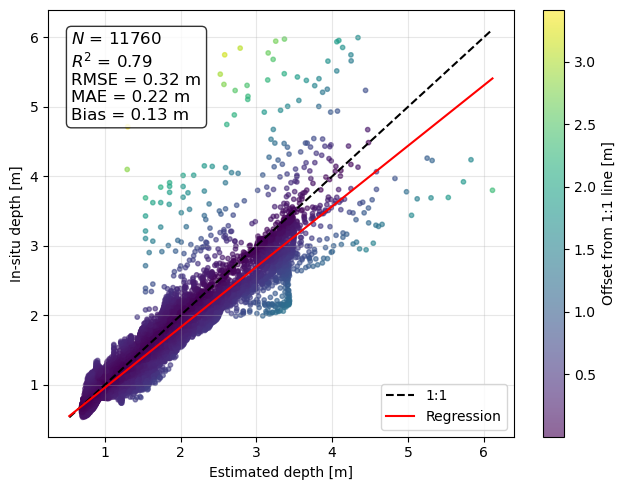

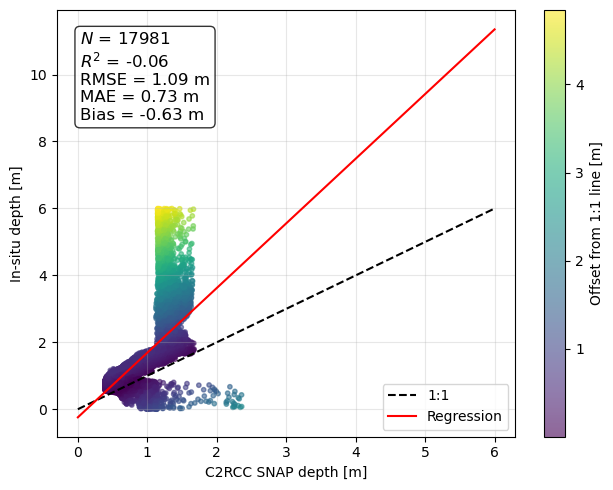

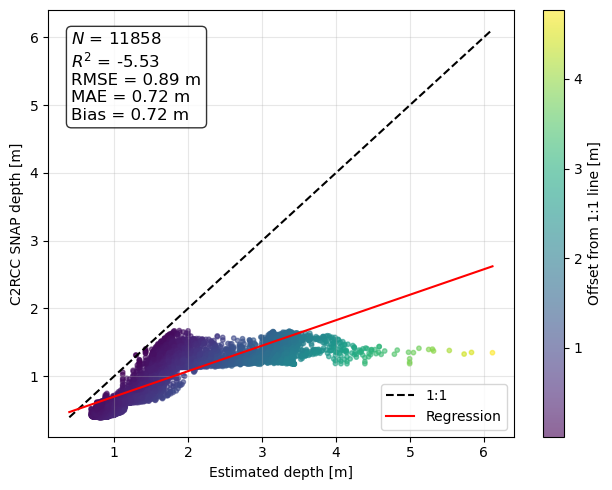


📊 Statistik-Tabelle: Estimated vs. In-situ
Tiefenbereich [m]    N  RMSE [m]  MAE [m]  Bias [m]            R²
          0.0–0.5    0       NaN      NaN       NaN           NaN
          0.5–1.0 2593  0.148394 0.103602  0.070517     -0.992354
          1.0–1.5 4329  0.247710 0.214586  0.158194     -2.048345
          1.5–2.0 2448  0.225804 0.182233  0.088970     -1.895924
          2.0–2.5 1151  0.448226 0.354810  0.241512     -9.441136
          2.5–3.0  711  0.499864 0.431692  0.340725    -11.757157
          3.0–3.5  342  0.453108 0.295020  0.101807     -9.473869
          3.5–4.0   95  0.920004 0.661922 -0.175358    -41.270086
          4.0–4.5   47  1.002956 0.807846 -0.611494    -40.738049
          4.5–5.0   12  1.673671 1.453957 -1.453957   -109.973215
          5.0–5.5   18  1.971328 1.888375 -1.888375   -185.463668
          5.5–6.0   14  2.211193 2.130511 -2.130511   -246.178320
          6.0–6.5   13  2.729460 2.691027 -2.691027   -320.935384
          6.5–7.0    3  3.638636

In [144]:
comparisons = [
    ("Estimated", mosaic, "In-situ", depth_aligned1),
    ("C2RCC SNAP", depth_aligned2, "In-situ", depth_aligned1),
    ("Estimated", mosaic, "C2RCC SNAP", depth_aligned2),
]

for name_x, data_x, name_y, data_y in comparisons:
    plot_comparison(name_x, data_x, name_y, data_y,6)

bin_tables = {}
for name_x, data_x, name_y, data_y in comparisons:
    df = evaluate_bins(name_x, data_x, name_y, data_y)
    bin_tables[f"{name_x}_vs_{name_y}"] = df

### **7. Computing Suspended Sediment Concentration (`C_X`)**

After computing `R_u`, the next step is to determine the **suspended sediment concentration (`C_X`)**. This parameter provides crucial insights into water quality and sediment transport in aquatic environments.

---

#### **1. Computing `f_arrow`**
The parameter **`f_arrow`** is an important factor in determining `R_u`. It is computed using:

\[
f_{\rightarrow} = \frac{Rrs_{\infty}}{w}
\]

where:
- \( Rrs_{\infty} \) is the **reflectance at infinite depth**.
- \( w \) is the **single-scattering albedo**, which accounts for the proportion of backscattered light.

##### **Why is `f_arrow` important?**
- It helps to correct for **subsurface scattering effects**.
- It allows a better estimation of **water column reflectance (`R_u`)**.

---

#### **2. Computing `R_u` (Upward Reflectance)**
The **upward-directed water column reflectance (`R_u`)** is calculated using the following equation:

\[
R_u = \frac{R_{rs} - \text{ars}_2 \cdot \left(\frac{R_B}{\pi}\right) \cdot e^{-K_d \cdot (1 + 1 / \cos\theta_v) \cdot z_B}}{f_u \cdot (1 - \text{ars}_1 \cdot e^{-K_d \cdot (1 + 1 / \cos\theta_v) \cdot z_B})}
\]

where:
- \( R_{rs} \) is the **measured water-leaving reflectance**.
- \( R_B \) is the **bottom reflectance**.
- \( K_d \) is the **diffuse attenuation coefficient**.
- \( \theta_v \) is the **subsurface viewing angle**.
- \( z_B \) is the **water depth**.
- \( f_u \) is the previously computed **`f_arrow`**.
- **ars1** and **ars2** are **empirical coefficients**.

##### **Why is `R_u` important?**
- It isolates **water column reflectance** from **bottom reflectance**.
- It is a crucial step for **deriving water properties** such as **suspended sediment concentration**.

---

#### **3. Computing Suspended Sediment Concentration (`C_X`)**
The **suspended sediment concentration (`C_X`)** is determined based on `R_u` using:

\[
C_X = \frac{R_u \cdot (a_w + b_{bw}) - b_{bw}}{b_{bX} \cdot (1 - R_u)}
\]

where:
- \( a_w \) is the **absorption coefficient of water**.
- \( b_{bw} \) is the **backscattering coefficient of water**.
- \( b_{bX} \) is the **backscattering coefficient of suspended particles**.
- \( R_u \) is the **upward water column reflectance**.

##### **Why is `C_X` important?**
- It provides **quantitative estimates** of suspended particulate matter in the water.
- It is useful for **monitoring sediment transport** in **coastal and inland water bodies**.

---

## If data yes


✅ Cx1 gefunden. Starte Zuschnitt...


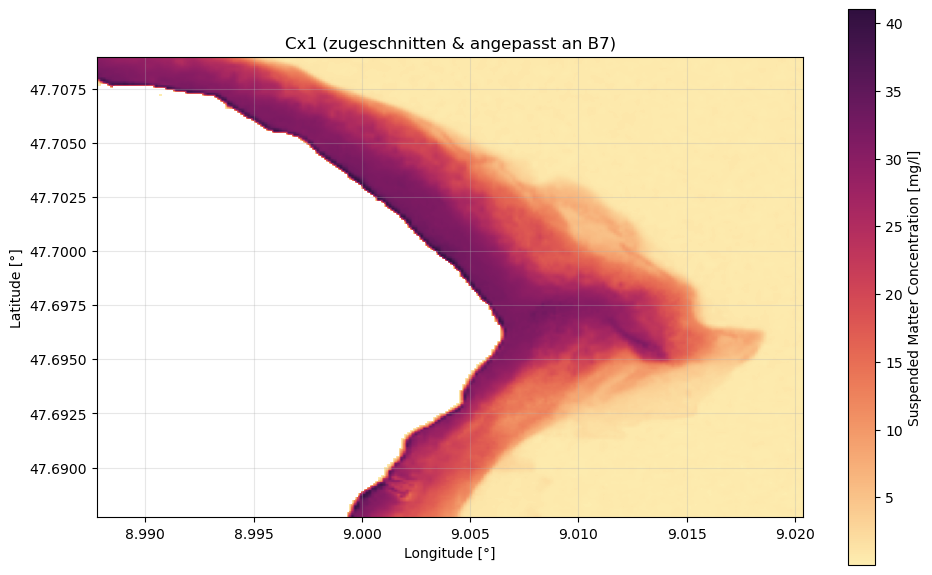


✅ Cx2 gefunden. Starte Zuschnitt...


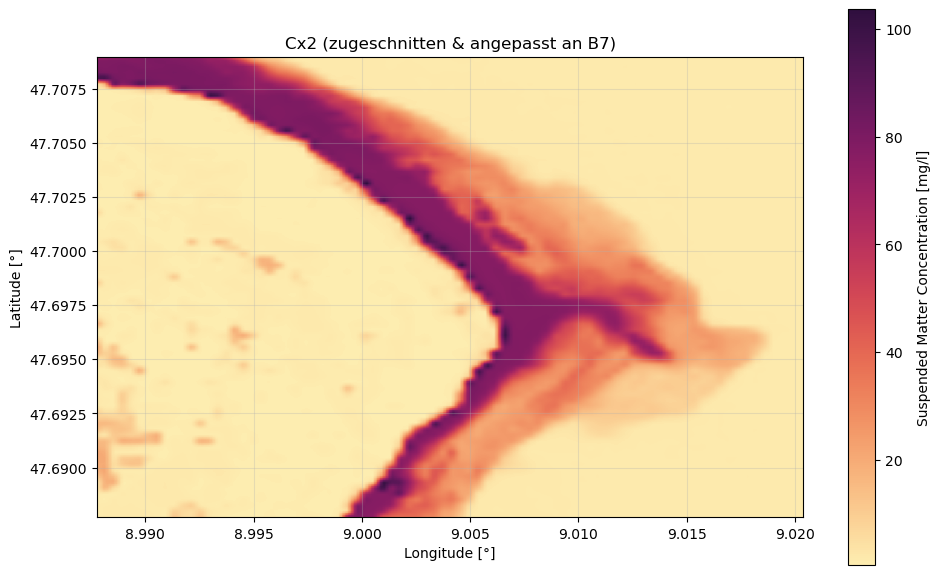


✅ Cx3 gefunden. Starte Zuschnitt...


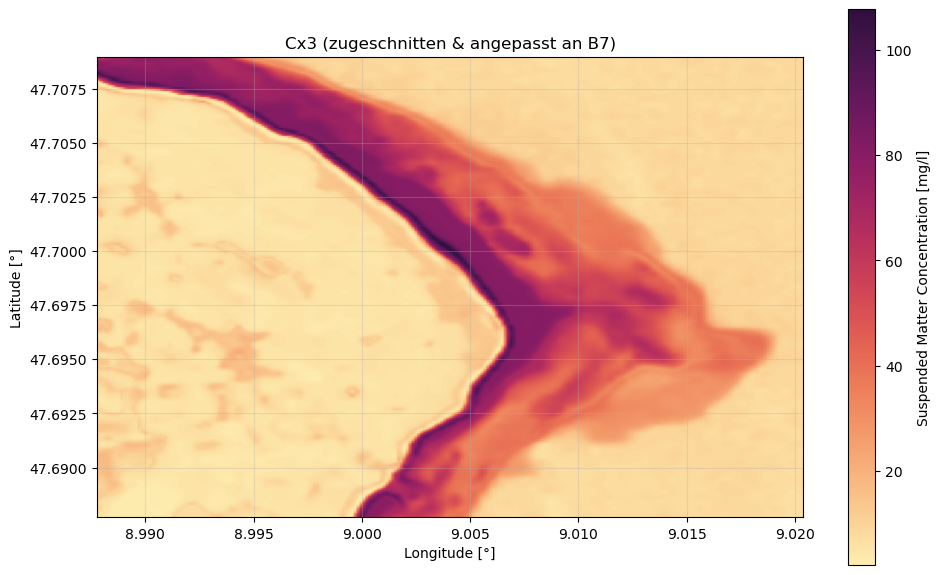


❌ Cx4 nicht gefunden: 


In [71]:
image_idx=0
def match_reference_tiff_to_band_cx(tiff_path, extent_b7, shape_b7, b7_crs="EPSG:4326", tiff_crs="EPSG:32632", label=""):
    from pyproj import Transformer
    import rasterio
    from rasterio.windows import from_bounds
    from rasterio.warp import Resampling
    import matplotlib.pyplot as plt
    
    if len(shape_b7) == 3:
        height, width = shape_b7[0:2]
    elif len(shape_b7) == 2:
        height, width = shape_b7
    else:
        raise ValueError("❌ Ungültiges Format für shape_b7")

    transformer = Transformer.from_crs(b7_crs, tiff_crs, always_xy=True)
    x_min, y_min = transformer.transform(extent_b7[0], extent_b7[2])
    x_max, y_max = transformer.transform(extent_b7[1], extent_b7[3])

    with rasterio.open(tiff_path) as src:
        try:
            window = from_bounds(x_min, y_min, x_max, y_max, transform=src.transform)
            raw_data = src.read(
                1,
                window=window,
                out_shape=(height, width),
                resampling=Resampling.bilinear
            )

            fill_value = 0
            if src.nodata is not None:
                raw_data = np.where(raw_data == src.nodata, fill_value, raw_data)

            src_data = np.nan_to_num(raw_data, nan=fill_value)
            src_data[src_data == 0] = np.nan

        except Exception as e:
            print(f"❌ Fehler beim Lesen & Interpolieren ({label}): {e}")
            return None

    plt.figure(figsize=(10, 6))
    plt.imshow(src_data, cmap=cmocean.cm.matter, extent=extent_b7, origin='upper')
    plt.title(f"{label} (zugeschnitten & angepasst an B7)")
    plt.xlabel("Longitude [°]")
    plt.ylabel("Latitude [°]")
    plt.colorbar(label=f"Suspended Matter Concentration [mg/l]")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    return src_data

if mission == "Sentinel":
    R_rs_value = all_corrected_images[image_idx]["B7"]
elif mission == "Landsat":
    R_rs_value = all_corrected_images[image_idx]["SR_B3"]
shape_b7 = R_rs_value.shape
extent_b7 = [
    region.bounds().coordinates().getInfo()[0][0][0],  # lon_min
    region.bounds().coordinates().getInfo()[0][2][0],  # lon_max
    region.bounds().coordinates().getInfo()[0][0][1],  # lat_min
    region.bounds().coordinates().getInfo()[0][2][1],  # lat_max
]

reference_paths = {
    "Cx1": "/Users/annikaklein/Desktop/Masterarbeit /Beispielarea/20200414_s2resampled_C2RCC_conc_tsm.tif",
    "Cx2": "/Users/annikaklein/Downloads/download/20140329_tsm.tif",
    "Cx3": "/Users/annikaklein/Desktop/Masterarbeit /C2RCC Bilder/download-2/2014_03_29_Lan/tiff/20140329_land_tsm_C2RCC.tif",
    "Cx4": "",
}

reference_data = {}

for label, path in reference_paths.items():
    if os.path.exists(path):
        print(f"\n✅ {label} gefunden. Starte Zuschnitt...")
        aligned_data = match_reference_tiff_to_band_cx(path, extent_b7, shape_b7, label=label)
        reference_data[label] = aligned_data
    else:
        print(f"\n❌ {label} nicht gefunden: {path}")
        reference_data[label] = None
        
#cx_aligned1 = reference_data["Cx1"]
cx_aligned1 = reference_data["Cx3"]
#cx_aligned3 = reference_data["Cx3"]
#cx_aligned4 = reference_data["Cx4"]

\Berechne für Bild 1...
0.08123348530343014
  ➝ R_u für Bild 1 berechnet.
  ➝ C_X für Bild 1 berechnet.


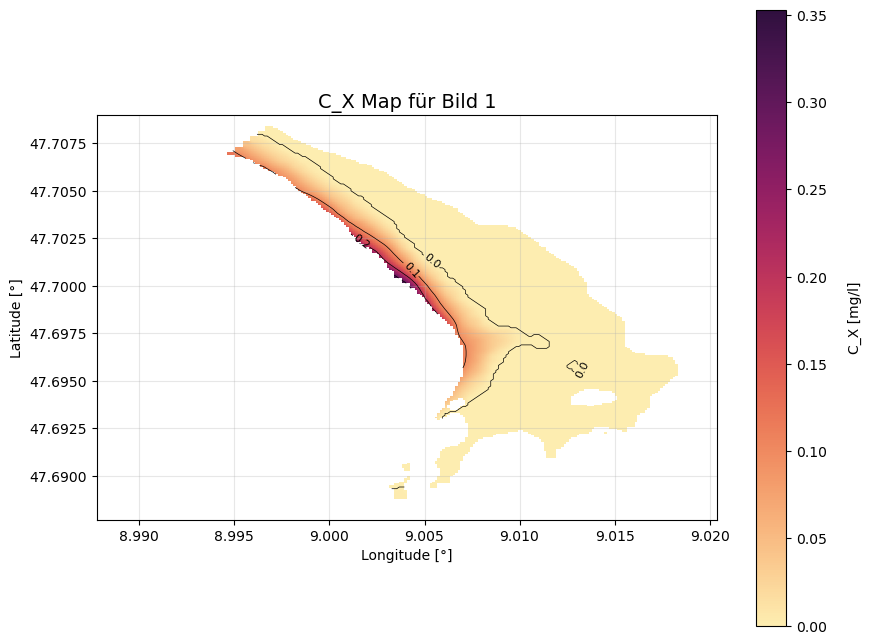

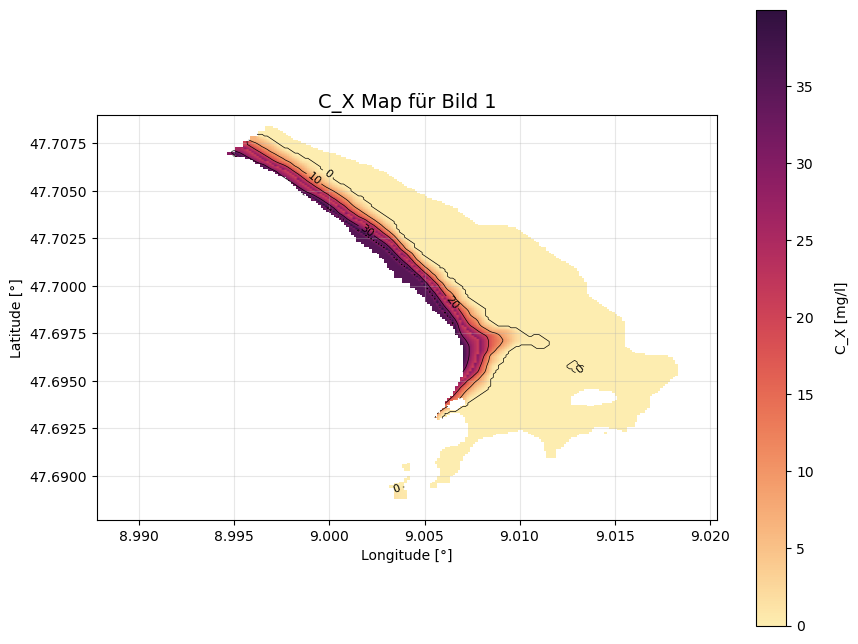


 Berechnung abgeschlossen.


In [72]:
num_bands = len(bands)  
num_images = len(depth_results) // num_bands  

Cx_results = []
if mission== "Sentinel":
    for image_idx in range(num_images):
        print(f"\Berechne für Bild {image_idx + 1}...")

        f_u_value = calculate_f_arrow(image_idx + 1, results_w, rrs_infinity_results)
        if f_u_value is None:
            print(f"  ➝ Kein f_arrow für Bild {image_idx + 1} gefunden, überspringe...")
            continue
        print(f_u_value)

        try:
            R_rs_value = all_corrected_images[image_idx]["B7"]
            R_rs_value = np.squeeze(R_rs_value)  
        except (IndexError, KeyError):
            print(f"  ➝ Kein R_rs für Bild {image_idx + 1} gefunden, überspringe...")
            continue

        R_B = empirical_coefficients["B7"]["Rb_LC"]

        K_d_value = kd_df[(kd_df["Image"] == image_idx + 1) & (kd_df["Band"] == "B7")]["Kd"].values
        if len(K_d_value) == 0:
            print(f"  ➝ Kein K_d-Wert für Bild {image_idx + 1} gefunden, überspringe...")
            continue
        K_d_value = K_d_value[0]

        theta_v_key = f"Subsurface Viewing Angle B7 (θv) (rad)"
        if theta_v_key not in metadata_dict[f"Image_{image_idx + 1}"]:
            print(f"  ➝ Kein θ_v-Wert für Bild {image_idx + 1} gefunden, überspringe...")
            continue
        theta_v = metadata_dict[f"Image_{image_idx + 1}"][theta_v_key]
        z_B=depth_aligned2
        #z_B=depth_aligned1
        #z_B = next((d["Mosaic_Depth"] for d in depth_mosaic_results if d["Image"] == image_idx + 1), None)
        #if z_B is None:
           # print(f"  ➝ Keine gültige Mosaik-Tiefe für Bild {image_idx + 1} gefunden, überspringe...")
           # continue

        try:
            R_u = calculate_R_u(R_rs_value, R_B, K_d_value, theta_v, z_B, f_u_value, ars1, ars2)
            print(f"  ➝ R_u für Bild {image_idx + 1} berechnet.")
        except Exception as e:
            print(f" Fehler bei der Berechnung von R_u für Bild {image_idx + 1}: {e}")
            continue
       # R_u[R_u>Ru_max]=np.nan
        #R_u=R_u/Ru_max
        R_u[R_u>0.99]=0
        R_u[R_u<0]=0
       # R_u=R_u*2

        try:
            aw = empirical_coefficients["B7"]["aw"]
            bbw = empirical_coefficients["B7"]["bbw"]
            bb_x = empirical_coefficients["B7"]["b*b_X"]

            C_X = calculate_Cx(R_u, aw, bbw, bb_x)

            print(f"  ➝ C_X für Bild {image_idx + 1} berechnet.")
            C_X=C_X/1.5
            C_X[C_X <= 0] = 0 
            C_X[C_X >=50 ] = 50
            Cx_results.append({"Bildnummer": image_idx + 1, "C_X": C_X})


            fig, ax = plt.subplots(figsize=(10, 8))
            im = ax.imshow(
                R_u, 
                cmap=cmocean.cm.matter,
                extent=[
                    region.bounds().coordinates().getInfo()[0][0][0], 
                    region.bounds().coordinates().getInfo()[0][2][0], 
                    region.bounds().coordinates().getInfo()[0][0][1], 
                    region.bounds().coordinates().getInfo()[0][2][1]
                ]
            )
        
            lon_min, lon_max = region.bounds().coordinates().getInfo()[0][0][0], region.bounds().coordinates().getInfo()[0][2][0]
            lat_min, lat_max = region.bounds().coordinates().getInfo()[0][0][1], region.bounds().coordinates().getInfo()[0][2][1]
            nrows, ncols = R_u.shape
            lon_grid = np.linspace(lon_min, lon_max, ncols)
            lat_grid = np.linspace(lat_max, lat_min, nrows)  
            Lon, Lat = np.meshgrid(lon_grid, lat_grid)

    
            contour_levels_ru = np.arange(0, 1.1, 0.1)
            contours = ax.contour(Lon, Lat, R_u, levels=contour_levels_ru, colors='black', linewidths=0.5)
            ax.clabel(contours, inline=True, fontsize=8, fmt='%1.1f')


            ax.set_title(f"C_X Map für Bild {image_idx + 1}", fontsize=14)
            ax.set_xlabel("Longitude [°]")
            ax.set_ylabel("Latitude [°]")
            plt.grid(alpha=0.3)

            cbar = plt.colorbar(im, ax=ax)
            cbar.set_label("C_X [mg/l]", rotation=90, labelpad=15)

            plt.show()

            fig, ax = plt.subplots(figsize=(10, 8))
            im = ax.imshow(
                C_X, 
                cmap=cmocean.cm.matter,
                extent=[
                    region.bounds().coordinates().getInfo()[0][0][0], 
                    region.bounds().coordinates().getInfo()[0][2][0], 
                    region.bounds().coordinates().getInfo()[0][0][1], 
                    region.bounds().coordinates().getInfo()[0][2][1]
                ])
       
            nrows, ncols = C_X.shape
            lon_grid = np.linspace(lon_min, lon_max, ncols)
            lat_grid = np.linspace(lat_max, lat_min, nrows)
            Lon, Lat = np.meshgrid(lon_grid, lat_grid)

            contour_levels_cx = np.arange(0, 60, 10)
            contours = ax.contour(Lon, Lat, C_X, levels=contour_levels_cx, colors='black', linewidths=0.5)
            ax.clabel(contours, inline=True, fontsize=8, fmt='%1.0f')


            ax.set_title(f"C_X Map für Bild {image_idx + 1}", fontsize=14)
            ax.set_xlabel("Longitude [°]")
            ax.set_ylabel("Latitude [°]")
            plt.grid(alpha=0.3)

            cbar = plt.colorbar(im, ax=ax)
            cbar.set_label("C_X [mg/l]", rotation=90, labelpad=15)

            plt.show()

        except Exception as e:
            print(f" Fehler bei der Berechnung von C_X für Bild {image_idx + 1}: {e}")
            continue

    print("\n Berechnung abgeschlossen.")
    
if mission== "Landsat":
        for image_idx in range(num_images):
            print(f"\Berechne für Bild {image_idx + 1}...")

            f_u_value = calculate_f_arrow_land(image_idx + 1, results_w, rrs_infinity_results)
            if f_u_value is None:
                print(f"  ➝ Kein f_arrow für Bild {image_idx + 1} gefunden, überspringe...")
                continue
            print(f_u_value)

            try:
                R_rs_value = all_corrected_images[image_idx]["SR_B5"]
                R_rs_value = np.squeeze(R_rs_value)  
            except (IndexError, KeyError):
                print(f"  ➝ Kein R_rs für Bild {image_idx + 1} gefunden, überspringe...")
                continue

            R_B = empirical_coefficients["SR_B5"]["Rb_LC"]

            K_d_value = kds_df[(kds_df["Image"] == image_idx + 1) & (kds_df["Band"] == "SR_B5")]["Kd"].values
            if len(K_d_value) == 0:
                print(f"  ➝ Kein K_d-Wert für Bild {image_idx + 1} gefunden, überspringe...")
                continue
            K_d_value = K_d_value[0]

            theta_v = metadata[f"Subsurface Viewing Angle {band} (θv) (rad)"]
            #z_B=depth_aligned2
            #z_B=depth_aligned1
            z_B = next((d["Mosaic_Depth"] for d in depth_mosaic_results if d["Image"] == image_idx + 1), None)
            if z_B is None:
                print(f"  ➝ Keine gültige Mosaik-Tiefe für Bild {image_idx + 1} gefunden, überspringe...")
                continue

            try:
                R_u = calculate_R_u(R_rs_value, R_B, K_d_value, theta_v, z_B, f_u_value, ars1, ars2)
                print(f"  ➝ R_u für Bild {image_idx + 1} berechnet.")
            except Exception as e:
                print(f" Fehler bei der Berechnung von R_u für Bild {image_idx + 1}: {e}")
                continue
         # weil f zu klenin ist in falchen wasser passt es am rand nicht und muss neu skaliert werden, deswege
        # füge ich die perzentiele ien um es neu zu skalieren

            #Ru_max=np.nanpercentile(R_u, 99.5) 
            #R_u[R_u>Ru_max]=np.nan
           # R_u=R_u/Ru_max
            R_u[R_u>0.99]=0
            R_u[R_u<0]=0

            try:
                aw = empirical_coefficients["SR_B5"]["aw"]
                bbw = empirical_coefficients["SR_B5"]["bbw"]
                bb_x = empirical_coefficients["SR_B5"]["b*b_X"]

                C_X = calculate_Cx(R_u, aw, bbw, bb_x)

                print(f"  ➝ C_X für Bild {image_idx + 1} berechnet.")
                C_X[C_X <= 0] = 0 
                C_X[C_X >=50 ] = 50
                
                C_X = np.where(C_X < 20 , C_X*1.5, C_X)
                C_X = np.where(C_X > 40,C_X*0.7, C_X)
                
                Cx_results.append({"Bildnummer": image_idx + 1, "C_X": C_X})


                fig, ax = plt.subplots(figsize=(10, 8))
                im = ax.imshow(
                    R_u, 
                    cmap=cmocean.cm.matter,
                    extent=[
                        region.bounds().coordinates().getInfo()[0][0][0], 
                        region.bounds().coordinates().getInfo()[0][2][0], 
                        region.bounds().coordinates().getInfo()[0][0][1], 
                        region.bounds().coordinates().getInfo()[0][2][1]
                    ])
          
                lon_min, lon_max = region.bounds().coordinates().getInfo()[0][0][0], region.bounds().coordinates().getInfo()[0][2][0]
                lat_min, lat_max = region.bounds().coordinates().getInfo()[0][0][1], region.bounds().coordinates().getInfo()[0][2][1]
                nrows, ncols = R_u.shape
                lon_grid = np.linspace(lon_min, lon_max, ncols)
                lat_grid = np.linspace(lat_max, lat_min, nrows) 
                Lon, Lat = np.meshgrid(lon_grid, lat_grid)

                contour_levels_ru = np.arange(0, 1.1, 0.1)
                contours = ax.contour(Lon, Lat, R_u, levels=contour_levels_ru, colors='black', linewidths=0.5)
                ax.clabel(contours, inline=True, fontsize=8, fmt='%1.1f')


                ax.set_title(f"C_X Map für Bild {image_idx + 1}", fontsize=14)
                ax.set_xlabel("Longitude [°]")
                ax.set_ylabel("Latitude [°]")
                plt.grid(alpha=0.3)

                cbar = plt.colorbar(im, ax=ax)
                cbar.set_label("C_X [mg/l]", rotation=90, labelpad=15)

                plt.show()

                fig, ax = plt.subplots(figsize=(10, 8))
                im = ax.imshow(
                    C_X, 
                    cmap=cmocean.cm.matter,
                    extent=[
                        region.bounds().coordinates().getInfo()[0][0][0], 
                        region.bounds().coordinates().getInfo()[0][2][0], 
                        region.bounds().coordinates().getInfo()[0][0][1], 
                        region.bounds().coordinates().getInfo()[0][2][1]
                    ])
                
                # Koordinaten-Raster wiederverwenden
                nrows, ncols = C_X.shape
                lon_grid = np.linspace(lon_min, lon_max, ncols)
                lat_grid = np.linspace(lat_max, lat_min, nrows)
                Lon, Lat = np.meshgrid(lon_grid, lat_grid)

                # C_X Konturen einfügen
                contour_levels_cx = np.arange(0, 60, 10)
                contours = ax.contour(Lon, Lat, C_X, levels=contour_levels_cx, colors='black', linewidths=0.5)
                ax.clabel(contours, inline=True, fontsize=8, fmt='%1.0f')


                ax.set_title(f"C_X Map für Bild {image_idx + 1}", fontsize=14)
                ax.set_xlabel("Longitude [°]")
                ax.set_ylabel("Latitude [°]")
                plt.grid(alpha=0.3)

                cbar = plt.colorbar(im, ax=ax)
                cbar.set_label("C_X [mg/l]", rotation=90, labelpad=15)

                plt.show()

            except Exception as e:
                print(f" Fehler bei der Berechnung von C_X für Bild {image_idx + 1}: {e}")
                continue

        print("\n Berechnung abgeschlossen.")

## To compare Estimated Depth vs Results

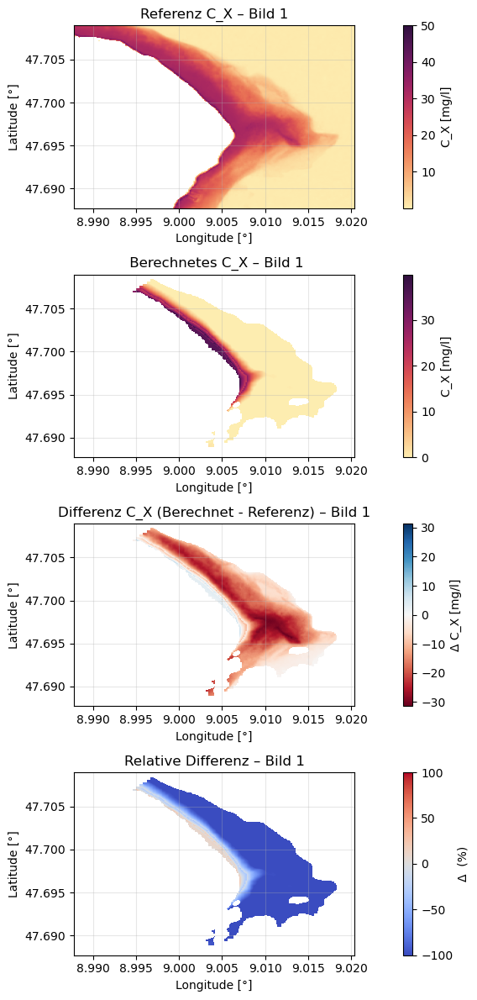

In [73]:
cx_results_dict = {d["Bildnummer"]: d["C_X"] for d in Cx_results}

ref_cx_dict = {
    1: reference_data.get("Cx1")
}

for image_idx in cx_results_dict:
    calculated = cx_results_dict[image_idx]
    reference = ref_cx_dict.get(image_idx)

    if reference is None or calculated is None:
        print(f"Keine Referenzdaten für Bild {image_idx} vorhanden, überspringe...")
        continue

    diff = np.full_like(calculated, np.nan)
    valid_mask = ~np.isnan(calculated) & ~np.isnan(reference)
    diff[valid_mask] = calculated[valid_mask] - reference[valid_mask]
    max_abs = np.nanmax(np.abs(diff))
    rel_diff = np.full_like(calculated, np.nan)
    rel_diff[valid_mask] = 100 * (calculated[valid_mask] - reference[valid_mask]) / reference[valid_mask]

    fig, axs = plt.subplots(4, 1, figsize=(12, 12))

    im0 = axs[0].imshow(reference, cmap=cmocean.cm.matter, extent=extent_b7, vmax=50)
    axs[0].set_title(f"Referenz C_X – Bild {image_idx}")
    plt.colorbar(im0, ax=axs[0], label="C_X [mg/l]")

    im1 = axs[1].imshow(calculated, cmap=cmocean.cm.matter, extent=extent_b7)
    axs[1].set_title(f" Berechnetes C_X – Bild {image_idx}")
    plt.colorbar(im1, ax=axs[1], label="C_X [mg/l]")

    im2 = axs[2].imshow(diff, cmap="RdBu", vmin=-max_abs, vmax=max_abs, extent=extent_b7)
    axs[2].set_title(f"Differenz C_X (Berechnet - Referenz) – Bild {image_idx}")
    plt.colorbar(im2, ax=axs[2], label="Δ C_X [mg/l]")
    
    im3 = axs[3].imshow(rel_diff, cmap="coolwarm",extent=extent_b7,vmin=-100,vmax=100)
    axs[3].set_title(f"Relative Differenz – Bild {image_idx}")
    plt.colorbar(im3, ax=axs[3], label="Δ  (%)")

    for ax in axs:
        ax.set_xlabel("Longitude [°]")
        ax.set_ylabel("Latitude [°]")
        ax.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

In [152]:
def plot_comparison(name_x, data_x, name_y, data_y, max_depth=None):
    from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
    import matplotlib.pyplot as plt
    valid_mask = ~np.isnan(data_x) & ~np.isnan(data_y)
    if max_depth is not None:
        valid_mask &= data_y <= max_depth

    x = data_x[valid_mask].flatten()
    y = data_y[valid_mask].flatten()

    if len(x) == 0:
        print(f"⚠️ Keine gültigen Daten für {name_x} vs. {name_y} bis {max_depth} m.")
        return
    r2 = r2_score(y, x)
    rmse = mean_squared_error(y, x, squared=False)
    mae = mean_absolute_error(y, x)
    bias = np.mean(x - y)
    
    coeffs = np.polyfit(x, y, 1)
    poly_eqn = np.poly1d(coeffs)
    x_line = np.linspace(min(x.min(), y.min()), max(x.max(), y.max()), 100)
    y_line = poly_eqn(x_line)

    distance = np.abs(x - y)

    fig, ax = plt.subplots(figsize=(6.5, 5)) 
    sc = ax.scatter(x, y, c=distance, cmap='viridis', s=10, alpha=0.6)
    ax.plot(x_line, x_line, color='black', linestyle='--', label='1:1')
    ax.plot(x_line, y_line, color='red', label='Regression')

    ax.set_xlabel(f"{name_x} suspended matter concentration [mg/l]")
    ax.set_ylabel(f"{name_y} suspended matter concentration [mg/l]")
    ax.grid(alpha=0.3)
    ax.legend(loc="lower right")

    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label('Offset from 1:1 line [mg/l]')

    stats_text = (
        f"$N$ = {len(x)}\n"
        f"$R^2$ = {r2:.2f}\n"
        f"RMSE = {rmse:.2f} mg/l\n"
        f"MAE = {mae:.2f} mg/l\n"
        f"Bias = {bias:.2f} mg/l"
    )
    ax.text(0.1, 0.3, stats_text, transform=ax.transAxes, fontsize=12,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    plt.tight_layout()
    filename = f"{name_x}_vs_{name_y}.pdf".replace(" ", "_")
    plt.savefig(filename, format="pdf", dpi=300)
    plt.show()

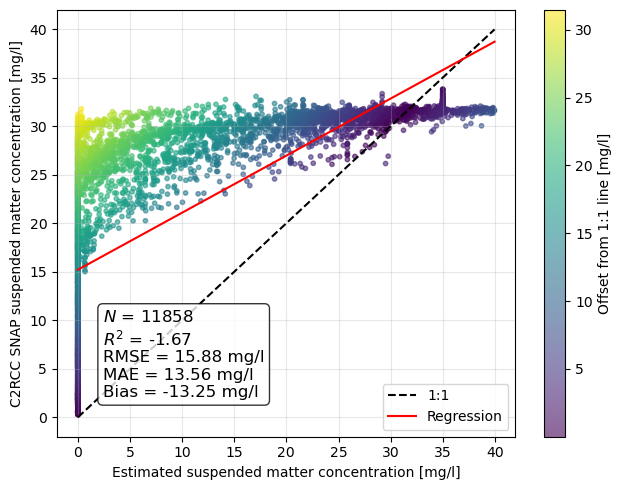


📊 Statistik-Tabelle: Estimated vs. C2RCC SNAP
Tiefenbereich [m]   N  RMSE [m]   MAE [m]   Bias [m]            R²
          0.0–0.5  22  0.434571  0.429694  -0.429694    -43.806850
          0.5–1.0  96  0.667367  0.655805  -0.655805    -28.113491
          1.0–1.5  90  1.300918  1.294003  -1.294003    -93.307373
          1.5–2.0 227  1.778082  1.772559  -1.772559   -160.221528
          2.0–2.5 269  2.263334  2.258578  -2.258578   -237.163554
          2.5–3.0 179  2.753510  2.749418  -2.749418   -335.702292
          3.0–3.5 154  3.237131  3.234048  -3.234048   -524.319874
          3.5–4.0 127  3.743576  3.740700  -3.740700   -650.156037
          4.0–4.5 119  4.247626  4.244818  -4.244818   -755.526953
          4.5–5.0 109  4.784395  4.782295  -4.782295  -1138.375292
          5.0–5.5 179  5.273522  5.271753  -5.271753  -1490.222843
          5.5–6.0 225  5.743390  5.741655  -5.741655  -1654.271736
          6.0–6.5 238  6.272182  6.270465  -6.270465  -1826.233786
          6.5–7

In [153]:
comparisons = [
     ("Estimated",calculated , "C2RCC SNAP", reference)
]

for name_x, data_x, name_y, data_y in comparisons:
    plot_comparison(name_x, data_x, name_y, data_y)

bin_tables = {}
for name_x, data_x, name_y, data_y in comparisons:
    df = evaluate_bins(name_x, data_x, name_y, data_y)
    bin_tables[f"{name_x}_vs_{name_y}"] = df

### **8. Optimizing the Absorption Coefficient (`a`)**

bei a aw+ap+ay, bei bb=bbw+bbx

In this step, we refine the absorption coefficient **`a`** for each pixel. This parameter plays a central role in underwater light attenuation and thus influences bathymetry and water quality retrieval.

---

#### **1. Objective of the Optimization**

The goal is to iteratively adjust **`a`** such that the simulated water-leaving reflectance **`R_rs_simulated`** closely matches the measured reflectance **`R_rs_measured`**. 

The optimization minimizes the error:

\[
\text{Error} = |R_{rs, measured} - R_{rs, simulated}|
\]

The iterative process continues until:
- The mean error falls below a defined **threshold**.
- Or a maximum number of iterations is reached.

---

#### **2. Key Components in the Iteration**

- **Single-scattering albedo (`wB`):**
  
\[
w_B = \frac{b_b}{a + b_b}
\]

Where:
- \( b_b = b_{bw} + b*b_X \cdot C_X \)
- \( a \) = current absorption coefficient.

---

- **Diffuse Attenuation Coefficient (`K_d`):**

\[
K_d = k_0 \cdot \frac{a + b_b}{\cos\theta_s}
\]

Defines how light diminishes with depth.

---

- **Reflectance at Infinite Depth (`Rrs_∞`):**

\[
Rrs_{\infty} = ars1 \times (1 + ars2 \times wB + ars2 \times wB^2) \times \left(1 + ars2 \times \frac{1}{\cos\theta_s}\right) \times \left(1 + ars2 \times \frac{1}{\cos\theta_v}\right) \times wB
\]

---

- **Simulated Reflectance (`R_rs_simulated`):**

\[
R_{rs, simulated} = Rrs_{\infty} \times (1 - ars1 \times e^{-(Ku_W + wB) \times z_B}) + ars2 \times \frac{R_B}{\pi} \times e^{-(Ku_B + wB) \times z_B}
\]

Where:
- \( Ku_W \), \( Ku_B \) are the upwelling attenuation coefficients:

\[
Ku_W = (a + b_b) \times (1 + wB)^{k1u} \times \left(1 + k2u \times \frac{1}{\cos\theta_s}\right) / \cos\theta_v
\]
\[
Ku_B = (a + b_b) \times (1 + wB)^{k1b} \times \left(1 + k2b \times \frac{1}{\cos\theta_s}\right) / \cos\theta_v
\]

---

#### **3. Iteration Strategy**

1. **Initialization:**
   - Start with an initial guess **`a_0`** for all valid pixels.
   
2. **Compute `R_rs_simulated`** using current `a`.

3. **Calculate error** between `R_rs_measured` and `R_rs_simulated`.

4. **Update `a` iteratively:**

\[
a_{new} = \max(0.99 \times a + 0.01 \times R_{rs, measured}, a_w)
\]

(Ensuring `a` doesn’t f*all below the absorption of pure water.)

5. **Convergence:**
   - Stop if mean error < **threshold**.
   - Else continue until maximum iterations.

---

#### **4. Output:**
- Optimized **absorption coefficient `a`** per pixel for each band (**B3**, **B4**, **B7**).
- Visualization of spatial distribution of `a` as maps.

---

#### ** Why optimize `a`?**

- Provides a more accurate characterization of light absorption in the water column.
- Essential for precise retrieval of bathymetry and water properties.
- Accounts for variability introduced by suspended particles and colored dissolved organic matter.

## If data yes ? 


✅ Cp1 gefunden. Starte Zuschnitt...


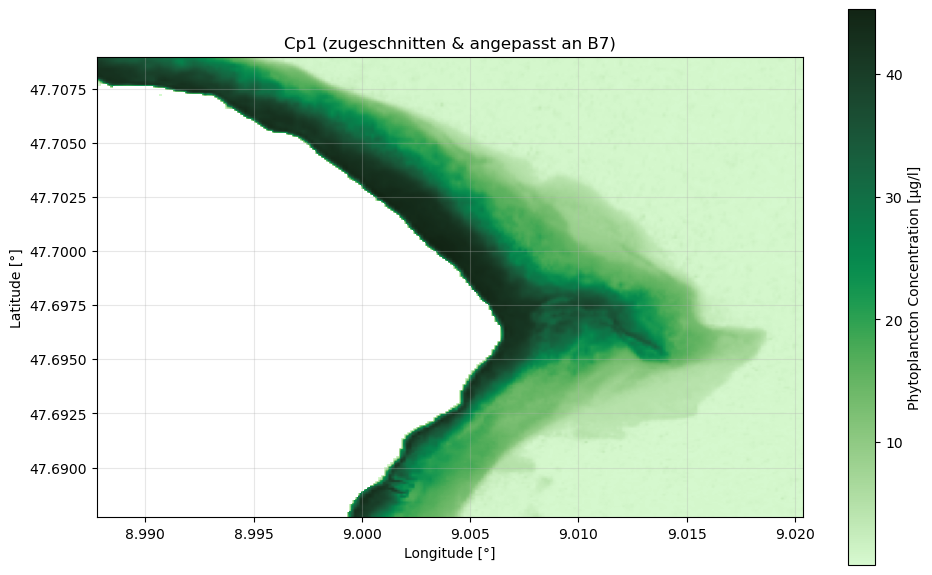


✅ Cp2 gefunden. Starte Zuschnitt...


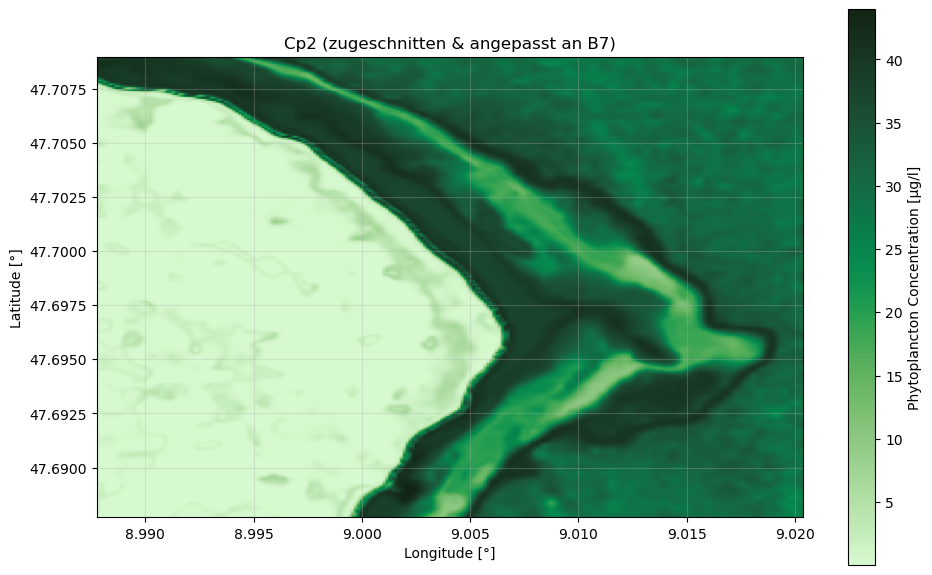


 Cp3 nicht gefunden: 

 Cp4 nicht gefunden: 


In [80]:
image_idx=0
def match_reference_tiff_to_band_cp(tiff_path, extent_b7, shape_b7, b7_crs="EPSG:4326",  tiff_crs="EPSG:32632", label=""):
    from pyproj import Transformer
    import rasterio
    from rasterio.windows import from_bounds
    from rasterio.warp import Resampling
    import matplotlib.pyplot as plt
    if len(shape_b7) == 3:
        height, width = shape_b7[0:2]
    elif len(shape_b7) == 2:
        height, width = shape_b7
    else:
        raise ValueError(" Ungültiges Format für shape_b7")

    transformer = Transformer.from_crs(b7_crs, tiff_crs, always_xy=True)
    x_min, y_min = transformer.transform(extent_b7[0], extent_b7[2])
    x_max, y_max = transformer.transform(extent_b7[1], extent_b7[3])

    with rasterio.open(tiff_path) as src:
        try:
            window = from_bounds(x_min, y_min, x_max, y_max, transform=src.transform)
            raw_data = src.read(
                1,
                window=window,
                out_shape=(height, width),
                resampling=Resampling.bilinear
            )

            fill_value = 0
            if src.nodata is not None:
                raw_data = np.where(raw_data == src.nodata, fill_value, raw_data)

            src_data = np.nan_to_num(raw_data, nan=fill_value)
            src_data[src_data == 0] = np.nan

        except Exception as e:
            print(f" Fehler beim Lesen & Interpolieren ({label}): {e}")
            return None

    # Darstellung
    plt.figure(figsize=(10, 6))
    plt.imshow(src_data, cmap=cmocean.cm.algae, extent=extent_b7, origin='upper')
    plt.title(f"{label} (zugeschnitten & angepasst an B7)")
    plt.xlabel("Longitude [°]")
    plt.ylabel("Latitude [°]")
    plt.colorbar(label=f"Phytoplancton Concentration [µg/l]")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    return src_data
if mission =="Sentinel":
    R_rs_value = all_corrected_images[image_idx]["B3"]
if mission =="Landsat":
    R_rs_value = all_corrected_images[image_idx]["SR_B3"]
shape_b7 = R_rs_value.shape
extent_b7 = [
    region.bounds().coordinates().getInfo()[0][0][0],  # lon_min
    region.bounds().coordinates().getInfo()[0][2][0],  # lon_max
    region.bounds().coordinates().getInfo()[0][0][1],  # lat_min
    region.bounds().coordinates().getInfo()[0][2][1],  # lat_max
]

reference_paths = {
    "Cp1": "/Users/annikaklein/Desktop/Masterarbeit /Beispielarea/20200414_s2resampled_C2RCC_conc_chl.tif",
    "Cp2": "/Users/annikaklein/Desktop/Masterarbeit /C2RCC Bilder/download-2/2014_03_29_Lan/tiff/20140329_land_chl_C2RCC.tif",
    "Cp3": "",
    "Cp4": "",
}

reference_data = {}

for label, path in reference_paths.items():
    if os.path.exists(path):
        print(f"\n✅ {label} gefunden. Starte Zuschnitt...")
        aligned_data = match_reference_tiff_to_band_cp(path, extent_b7, shape_b7, label=label)
        reference_data[label] = aligned_data
    else:
        print(f"\n {label} nicht gefunden: {path}")
        reference_data[label] = None
        
cp_aligned1 = reference_data["Cp2"]
#cp_aligned1 = reference_data["Cp2"]
#cp_aligned3 = reference_data["Cp3"]
#cp_aligned4 = reference_data["Cp4"]


 Ay1 gefunden. Starte Zuschnitt...


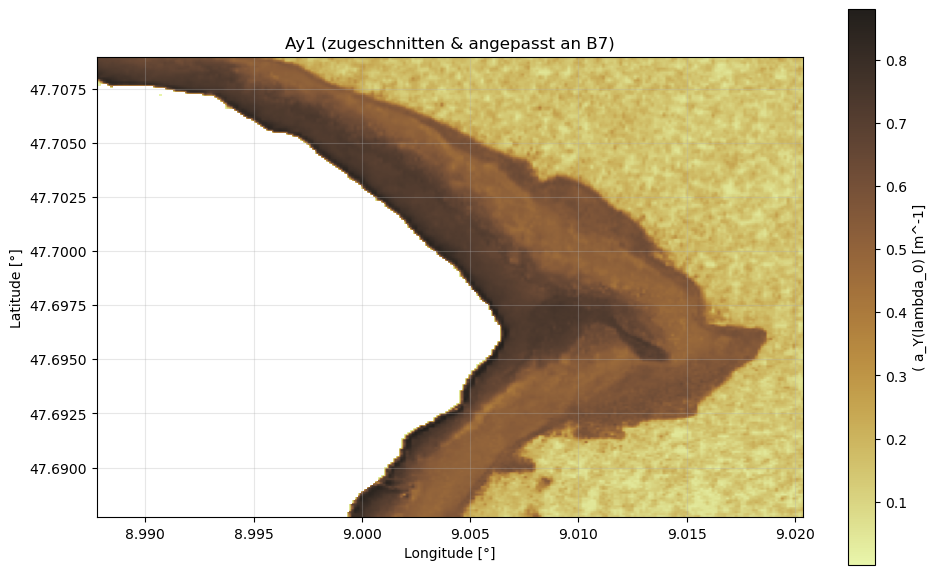


 Ay2 gefunden. Starte Zuschnitt...


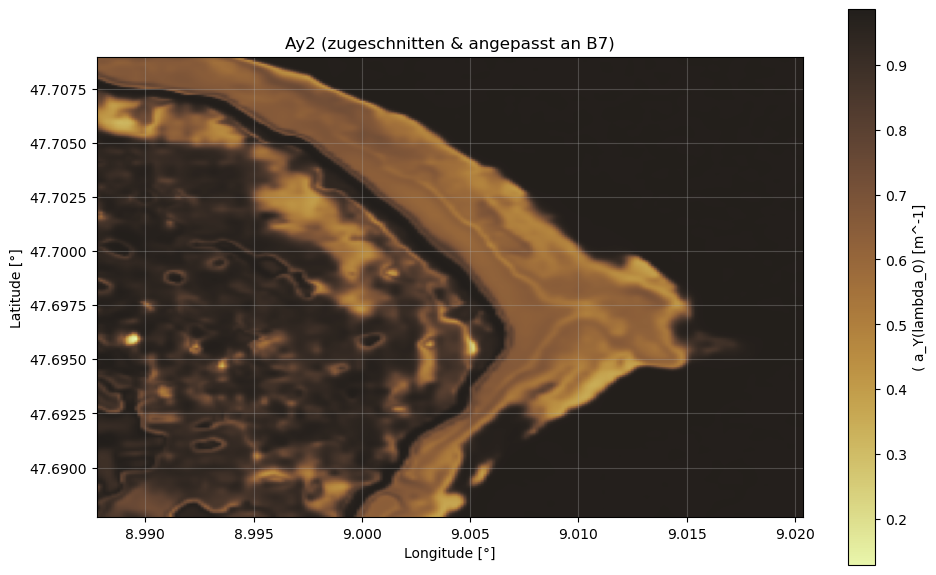


 Ay3 nicht gefunden: 

 Ay4 nicht gefunden: 


In [82]:
image_idx=0
def match_reference_tiff_to_band_ay(tiff_path, extent_b7, shape_b7, b7_crs="EPSG:4326", tiff_crs="EPSG:32632", label=""):
    from pyproj import Transformer
    import rasterio
    from rasterio.windows import from_bounds
    from rasterio.warp import Resampling
    import matplotlib.pyplot as plt
    if len(shape_b7) == 3:
        height, width = shape_b7[0:2]
    elif len(shape_b7) == 2:
        height, width = shape_b7
    else:
        raise ValueError(" Ungültiges Format für shape_b7")

    transformer = Transformer.from_crs(b7_crs, tiff_crs, always_xy=True)
    x_min, y_min = transformer.transform(extent_b7[0], extent_b7[2])
    x_max, y_max = transformer.transform(extent_b7[1], extent_b7[3])

    with rasterio.open(tiff_path) as src:
        try:
            window = from_bounds(x_min, y_min, x_max, y_max, transform=src.transform)
            raw_data = src.read(
                1,
                window=window,
                out_shape=(height, width),
                resampling=Resampling.bilinear
            )

            fill_value = 0
            if src.nodata is not None:
                raw_data = np.where(raw_data == src.nodata, fill_value, raw_data)

            src_data = np.nan_to_num(raw_data, nan=fill_value)
            src_data[src_data == 0] = np.nan

        except Exception as e:
            print(f" Fehler beim Lesen & Interpolieren ({label}): {e}")
            return None

    # Darstellung
    plt.figure(figsize=(10, 6))
    plt.imshow(src_data, cmap=cmocean.cm.turbid, extent=extent_b7, origin='upper')
    plt.title(f"{label} (zugeschnitten & angepasst an B7)")
    plt.xlabel("Longitude [°]")
    plt.ylabel("Latitude [°]")
    plt.colorbar(label=f"( a_Y(lambda_0) [m^-1]")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    return src_data
if mission == "Sentinel":
    R_rs_value = all_corrected_images[image_idx]["B3"]
if mission == "Landsat":
    R_rs_value = all_corrected_images[image_idx]["SR_B3"]
shape_b7 = R_rs_value.shape
extent_b7 = [
    region.bounds().coordinates().getInfo()[0][0][0],  # lon_min
    region.bounds().coordinates().getInfo()[0][2][0],  # lon_max
    region.bounds().coordinates().getInfo()[0][0][1],  # lat_min
    region.bounds().coordinates().getInfo()[0][2][1],  # lat_max
]

reference_paths = {
    "Ay1": "/Users/annikaklein/Desktop/Masterarbeit /Beispielarea/20200414_s2resampled_C2RCC_gelbstoff.tif",
    "Ay2": "/Users/annikaklein/Desktop/Masterarbeit /C2RCC Bilder/download-2/2014_03_29_Lan/tiff/20140329_land_gelb_C2RCC.tif",
    "Ay3": "",
    "Ay4": "",
}

reference_data = {}

for label, path in reference_paths.items():
    if os.path.exists(path):
        print(f"\n {label} gefunden. Starte Zuschnitt...")
        aligned_data = match_reference_tiff_to_band_ay(path, extent_b7, shape_b7, label=label)
        reference_data[label] = aligned_data
    else:
        print(f"\n {label} nicht gefunden: {path}")
        reference_data[label] = None
        
#ay_aligned1 = reference_data["Ay1"]
ay_aligned1 = reference_data["Ay2"]
#ay_aligned3 = reference_data["Ay3"]
#ay_aligned4 = reference_data["Ay4"]

## If none or one Data


🔄 Optimierung von `a` für Bild 1...
  ➝ Optimierung für Band SR_B1...


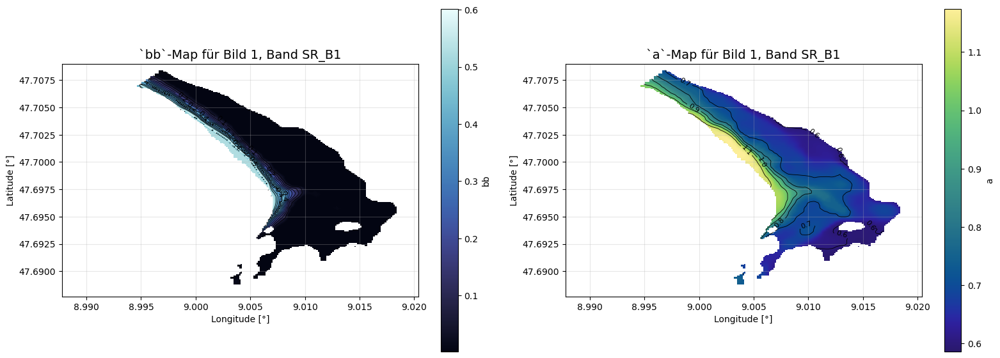

  ➝ Optimierung für Band SR_B2...


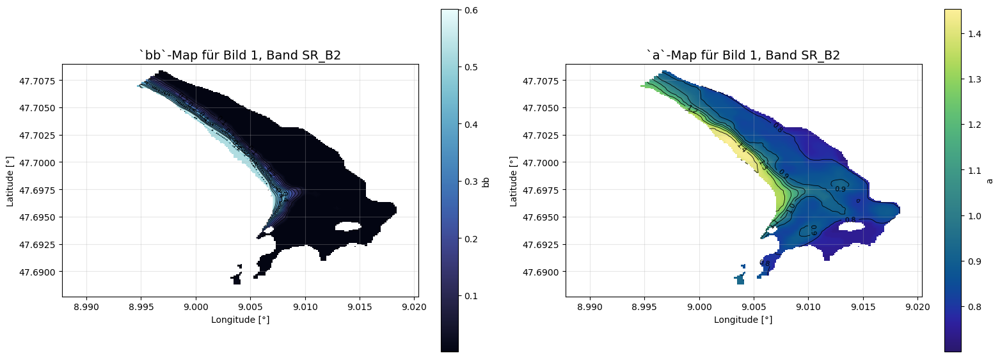

In [83]:
all_a_values = []

if mission =="Sentinel":
        #bands_to_process = ["B1", "B2", "B3", "B4", "B5", "B6", "B7", "B11"]
        bands_to_process = ["B1", "B2"]

        for image_idx in range(num_images):  
            print(f"\n🔄 Optimierung von `a` für Bild {image_idx + 1}...")

            try:
                #C_X =cx_aligned1
                #z_B = depth_aligned2
                C_X = next((d["C_X"] for d in Cx_results if d["Bildnummer"] == image_idx + 1), None)
                z_B = next((d["Mosaic_Depth"] for d in depth_mosaic_results if d["Image"] == image_idx + 1), None)

            except Exception as e:
                print(f" Fehler beim Laden der Daten für Bild {image_idx + 1}: {e}")
                continue

            metadata = metadata_dict[f"Image_{image_idx + 1}"]

            for band in bands_to_process:
                try:
                    print(f"  ➝ Optimierung für Band {band}...")

                    aw = empirical_coefficients[band]["aw"]
                    bbw = empirical_coefficients[band]["bbw"]
                    bb_x = empirical_coefficients[band]["b*b_X"]
                    R_B = float(empirical_coefficients[band]["Rb_LC"])

                    bb = bbw + bb_x * C_X
                    R_rs_measured = np.squeeze(np.array(all_corrected_images[image_idx][band], dtype=np.float32))
                    Rrs_inf_value = float(next((r['Rrs_infinity'] for r in rrs_infinity_results 
                                                if r['Image'] == image_idx + 1 and r['Band'] == band), None))
                    Rrs_inf = np.full(z_B.shape, Rrs_inf_value, dtype=np.float64)

                    theta_v_key = f"Subsurface Viewing Angle {band} (θv) (rad)"
                    theta_s_key = "Subsurface Solar Zenith Angle (θs) (rad)"

                    if theta_v_key not in metadata or theta_s_key not in metadata:
                        print(f" Fehlende Winkelwerte für Band {band} in Bild {image_idx + 1}, überspringe...")
                        continue

                    theta_v_rad = metadata[theta_v_key]
                    theta_s_rad = metadata[theta_s_key]

                    a_values = optimize_a_pixelwise(R_rs_measured, theta_s_rad, theta_v_rad, Rrs_inf, 
                                                    ars1, ars2, ko, k1u, k2u, k1b, k2b, R_B, z_B, bb, aw=aw)

                    if a_values is None or np.all(np.isnan(a_values)):
                        print(f"Keine gültigen `a`-Werte für Bild {image_idx + 1}, Band {band}. Überspringe...")
                        continue

                    all_a_values.append({
                        "Bildnummer": image_idx + 1,
                        "Band": band,
                        "a_values": a_values
                    })

                    fig, axs = plt.subplots(1, 2, figsize=(16, 7))
                    im0 = axs[0].imshow(bb, cmap=cmocean.cm.ice, extent=[
                        region.bounds().coordinates().getInfo()[0][0][0],
                        region.bounds().coordinates().getInfo()[0][2][0],
                        region.bounds().coordinates().getInfo()[0][0][1],
                        region.bounds().coordinates().getInfo()[0][2][1]
                    ])
                    
                    bb_levels = np.arange(0, 0.51, 0.05)
                    contours_bb = axs[0].contour(bb, levels=bb_levels, colors='black', linewidths=0.6, extent=[lon_min, lon_max, lat_max, lat_min])
                    axs[0].clabel(contours_bb, fmt='%0.1f', fontsize=8)
                    axs[0].set_title(f"`bb`-Map für Bild {image_idx + 1}, Band {band}", fontsize=14)
                    axs[0].set_xlabel("Longitude [°]")
                    axs[0].set_ylabel("Latitude [°]")
                    axs[0].grid(alpha=0.3)
                    plt.colorbar(im0, ax=axs[0], shrink=0.8, label="bb")

                    im1 = axs[1].imshow(a_values, cmap=cmocean.cm.haline, extent=[
                        region.bounds().coordinates().getInfo()[0][0][0],
                        region.bounds().coordinates().getInfo()[0][2][0],
                        region.bounds().coordinates().getInfo()[0][0][1],
                        region.bounds().coordinates().getInfo()[0][2][1]
                    ]
                                        )
                    a_levels = np.arange(0, 3.1, 0.1)
                    contours_a = axs[1].contour(a_values, levels=a_levels, colors='black', linewidths=0.6, 
                                                extent=[lon_min, lon_max, lat_max, lat_min])
                    axs[1].clabel(contours_a, fmt='%0.1f', fontsize=8)
                    axs[1].set_title(f"`a`-Map für Bild {image_idx + 1}, Band {band}", fontsize=14)
                    axs[1].set_xlabel("Longitude [°]")
                    axs[1].set_ylabel("Latitude [°]")
                    axs[1].grid(alpha=0.3)
                    plt.colorbar(im1, ax=axs[1], shrink=0.8, label="a")

                    plt.tight_layout()
                    plt.show()

                except Exception as e:
                    print(f" Fehler bei der Optimierung oder Visualisierung für Bild {image_idx + 1}, Band {band}: {e}")
                    continue
                    
elif mission=="Landsat":
        bands_to_process = ["SR_B1", "SR_B2"]
        #bands_to_process = ["SR_B1", "SR_B2", "SR_B3", "SR_B4", "SR_B5"]

        for image_idx in range(num_images):  
            print(f"\n🔄 Optimierung von `a` für Bild {image_idx + 1}...")

            try:
                #C_X =cx_aligned1
                #z_B = depth_aligned2
                C_X = next((d["C_X"] for d in Cx_results if d["Bildnummer"] == image_idx + 1), None)
                z_B = next((d["Mosaic_Depth"] for d in depth_mosaic_results if d["Image"] == image_idx + 1), None)

            except Exception as e:
                print(f" Fehler beim Laden der Daten für Bild {image_idx + 1}: {e}")
                continue

            metadata = metadata_dict[f"Image_{image_idx + 1}"]

            for band in bands_to_process:
                try:
                    print(f"  ➝ Optimierung für Band {band}...")

                    aw = empirical_coefficients[band]["aw"]
                    bbw = empirical_coefficients[band]["bbw"]
                    bb_x = empirical_coefficients[band]["b*b_X"]
                    R_B = float(empirical_coefficients[band]["Rb_LC"])

                    bb = bbw + bb_x * C_X
                    R_rs_measured = np.squeeze(np.array(all_corrected_images[image_idx][band], dtype=np.float32))
                    Rrs_inf_value = float(next((r['Rrs_infinity'] for r in rrs_infinity_results 
                                                if r['Image'] == image_idx + 1 and r['Band'] == band), None))
                    Rrs_inf = np.full(z_B.shape, Rrs_inf_value, dtype=np.float64)

                    theta_s_rad = metadata["Subsurface Solar Angle (rad)"]
                    theta_v_rad = metadata[f"Subsurface Viewing Angle {band} (θv) (rad)"]

                    a_values = optimize_a_pixelwise(R_rs_measured, theta_s_rad, theta_v_rad, Rrs_inf, 
                                                    ars1, ars2, ko, k1u, k2u, k1b, k2b, R_B, z_B, bb, aw=aw)

                    if a_values is None or np.all(np.isnan(a_values)):
                        print(f"Keine gültigen `a`-Werte für Bild {image_idx + 1}, Band {band}. Überspringe...")
                        continue

                    all_a_values.append({
                        "Bildnummer": image_idx + 1,
                        "Band": band,
                        "a_values": a_values
                    })

                    fig, axs = plt.subplots(1, 2, figsize=(16, 7))
                    im0 = axs[0].imshow(bb, cmap=cmocean.cm.ice, extent=[
                        region.bounds().coordinates().getInfo()[0][0][0],
                        region.bounds().coordinates().getInfo()[0][2][0],
                        region.bounds().coordinates().getInfo()[0][0][1],
                        region.bounds().coordinates().getInfo()[0][2][1]
                    ])
                    plt.grid(alpha=0.3)
                    bb_levels = np.arange(0, 0.5, 0.05)
                    contours_bb = axs[0].contour(bb, levels=bb_levels, colors='black', linewidths=0.6, 
                                                 extent=[lon_min, lon_max, lat_max, lat_min])
                    axs[0].clabel(contours_bb, fmt='%0.1f', fontsize=8)
                    axs[0].set_title(f"`bb`-Map für Bild {image_idx + 1}, Band {band}", fontsize=14)
                    axs[0].grid(alpha=0.3)
                    axs[0].set_xlabel("Longitude [°]")
                    axs[0].set_ylabel("Latitude [°]")
                    plt.colorbar(im0, ax=axs[0], shrink=0.8, label="bb")

                    im1 = axs[1].imshow(a_values, cmap=cmocean.cm.haline, extent=[
                        region.bounds().coordinates().getInfo()[0][0][0],
                        region.bounds().coordinates().getInfo()[0][2][0],
                        region.bounds().coordinates().getInfo()[0][0][1],
                        region.bounds().coordinates().getInfo()[0][2][1]
                    ])
                    a_levels = np.arange(0, 3, 0.1)
                    contours_a = axs[1].contour(a_values, levels=a_levels, colors='black', linewidths=0.6,
                                                extent=[lon_min, lon_max, lat_max, lat_min])
                    axs[1].clabel(contours_a, fmt='%0.1f', fontsize=8)
                    axs[1].set_title(f"`a`-Map für Bild {image_idx + 1}, Band {band}", fontsize=14)
                    axs[1].set_xlabel("Longitude [°]")
                    axs[1].set_ylabel("Latitude [°]")
                    axs[1].grid(alpha=0.3)
                    plt.colorbar(im1, ax=axs[1], shrink=0.8, label="a")
                    plt.tight_layout()
                    plt.show()

                except Exception as e:
                    print(f" Fehler bei der Optimierung oder Visualisierung für Bild {image_idx + 1}, Band {band}: {e}")
                    continue

In [ ]:
Absorption and backscattering are direct measures for the reflectance of the water column: the
higher the backscattering, the higher the reflectance, and the higher the absorption, the lower
the reflectance. albert 2004

### **9. Computing Particulate Matter Concentration (`C_P`) and CDOM Absorption (`a_Y(λ₀)`)**

After determining the total absorption coefficient **`a(λ)`**, the next crucial step is to separate the contributions from **particulate matter (`C_P`)** and **colored dissolved organic matter (CDOM), expressed as `a_Y(λ₀)`**.

---

#### **1. Formulation of the Problem**

The total absorption at a given wavelength is described by:

\[
a(\lambda) = a_W(\lambda) + a^*_P(\lambda) \times C_P + a_Y(\lambda_0) \times e^{-s_Y(\lambda - \lambda_0)}
\]

Where:
- \( a(\lambda) \): Total absorption at wavelength \( \lambda \).
- \( a_W(\lambda) \): Absorption of pure water.
- \( a^*_P(\lambda) \): Specific particulate absorption.
- \( C_P \): Particulate concentration (unknown).
- \( a_Y(\lambda_0) \): CDOM absorption at reference wavelength \( \lambda_0 \) (unknown).
- \( s_Y \): Exponential decay rate (typically 0.011 nm⁻¹).
- \( \lambda_0 \): Reference wavelength (typically 440 nm).

---

#### **2. Optimization Strategy**

For each pixel:
1. **Given Inputs:**
   - Measured absorption \( a(\lambda) \) at **Band B3 (560 nm)**.
   - Known coefficients \( a_W \) and \( a^*_P \) from empirical parameters.

2. **Unknowns:**
   - \( C_P \) and \( a_Y(\lambda_0) \).

3. **Optimization:**
   - Apply a **least squares minimization** to fit \( C_P \) and \( a_Y(\lambda_0) \) such that the modeled \( a(\lambda) \) best matches the measured value.

4. **Constraints:**
   - \( C_P \) ∈ [0.1, 100.0] µg/l.
   - \( a_Y(\lambda_0) \) ∈ [0.01, 5.0] m⁻¹.

---

#### **3. Calculation Procedure**

- For each valid pixel:
  1. Use the equation above and the measured **absorption at B3 (560 nm)**.
  2. Iteratively optimize \( C_P \) and \( a_Y(\lambda_0) \) using `scipy.optimize.least_squares`.
  3. Apply pixel-wise optimization, ensuring NaNs are excluded.
  4. Store the results in matrices for visualization.

---

#### **4. Output & Visualization**

- **`C_P` Map:**
  - Shows the spatial distribution of particulate matter concentration.
  - Typically visualized in µg/l.

- **`a_Y(λ₀)` Map:**
  - Displays CDOM absorption at reference wavelength (e.g., 440 nm).
  - Expressed in m⁻¹.

- Both results are dynamically visualized with percentile-based color scaling to highlight spatial variability.

---

#### * Why compute `C_P` and `a_Y(λ₀)`?**

- Separates different water constituents influencing absorption.
- Essential for:
  - **Water quality assessments.**
  - **Eutrophication monitoring.**
  - **CDOM dynamics in coastal and inland waters.**



Berechnung von `C_P` und `a_Y(λ₀)` für Bild 1 mit Band SR_B1...
📌 Band: SR_B1, Bild: 1
   a_measured: min=0.5861, max=1.1739, NaNs=46207
   aw = 0.0107, aP_star = 0.0331, λ = 443
  ➝ Optimierung abgeschlossen für Bild 1, Band SR_B1
   ⬅️ Mittelwert C_P: 13.090
   ⬅️ Mittelwert a_Y(λ₀): 0.305


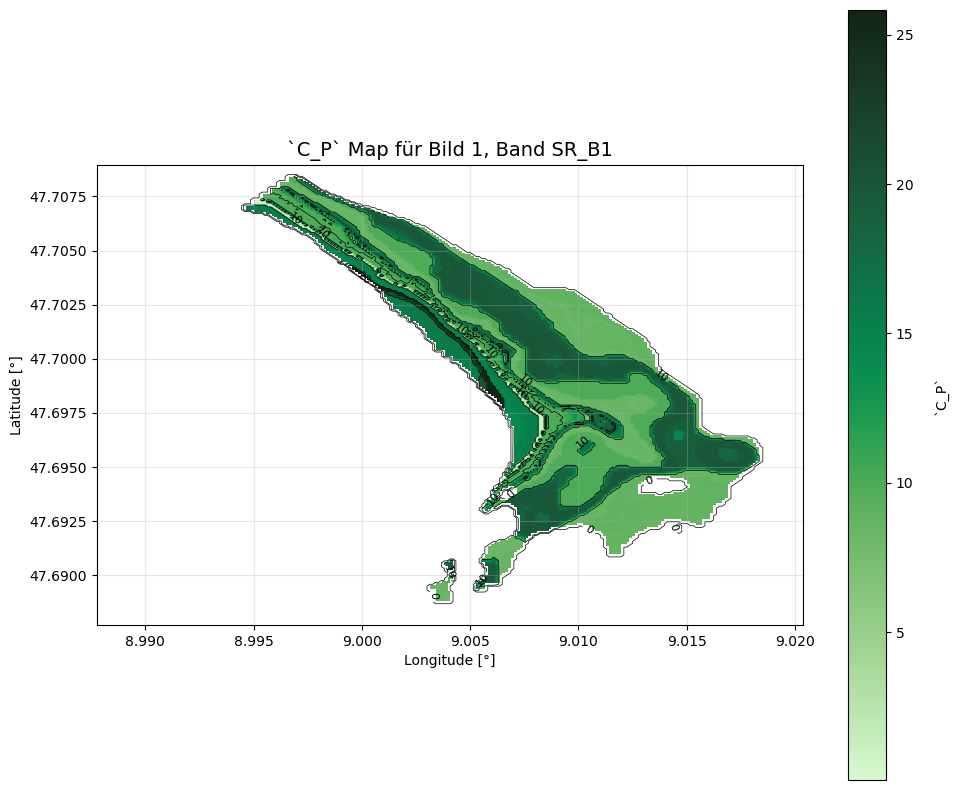

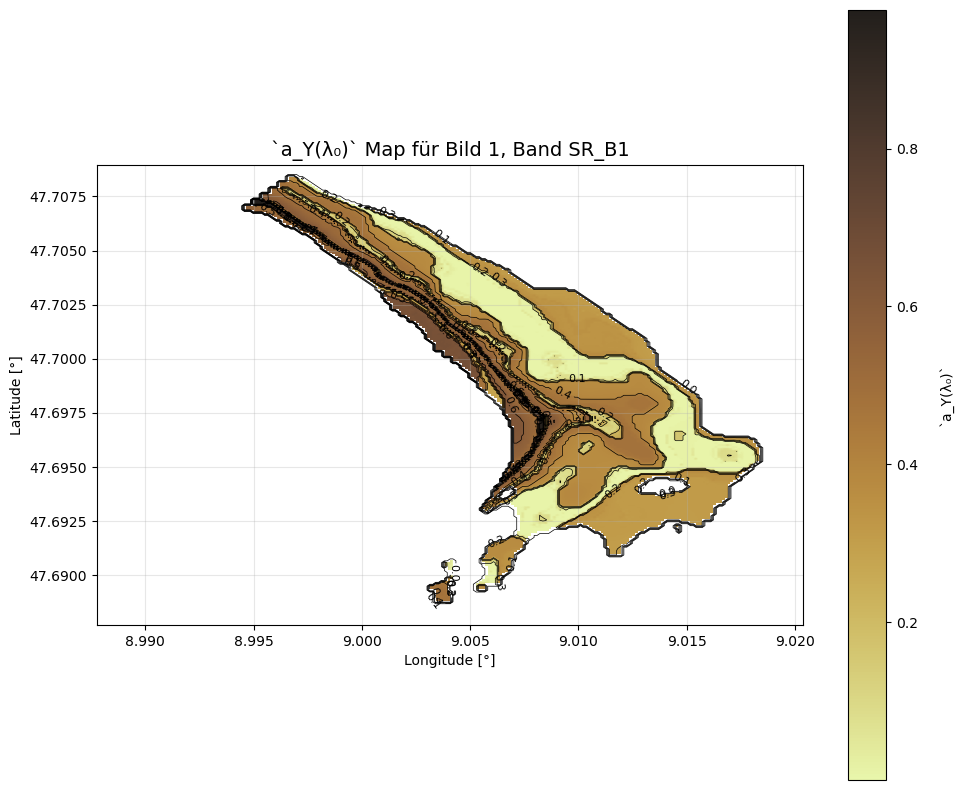


Berechnung von `C_P` und `a_Y(λ₀)` für Bild 1 mit Band SR_B2...
📌 Band: SR_B2, Bild: 1
   a_measured: min=0.7003, max=1.4527, NaNs=46207
   aw = 0.0181, aP_star = 0.0267, λ = 482
  ➝ Optimierung abgeschlossen für Bild 1, Band SR_B2
   ⬅️ Mittelwert C_P: 15.060
   ⬅️ Mittelwert a_Y(λ₀): 0.759


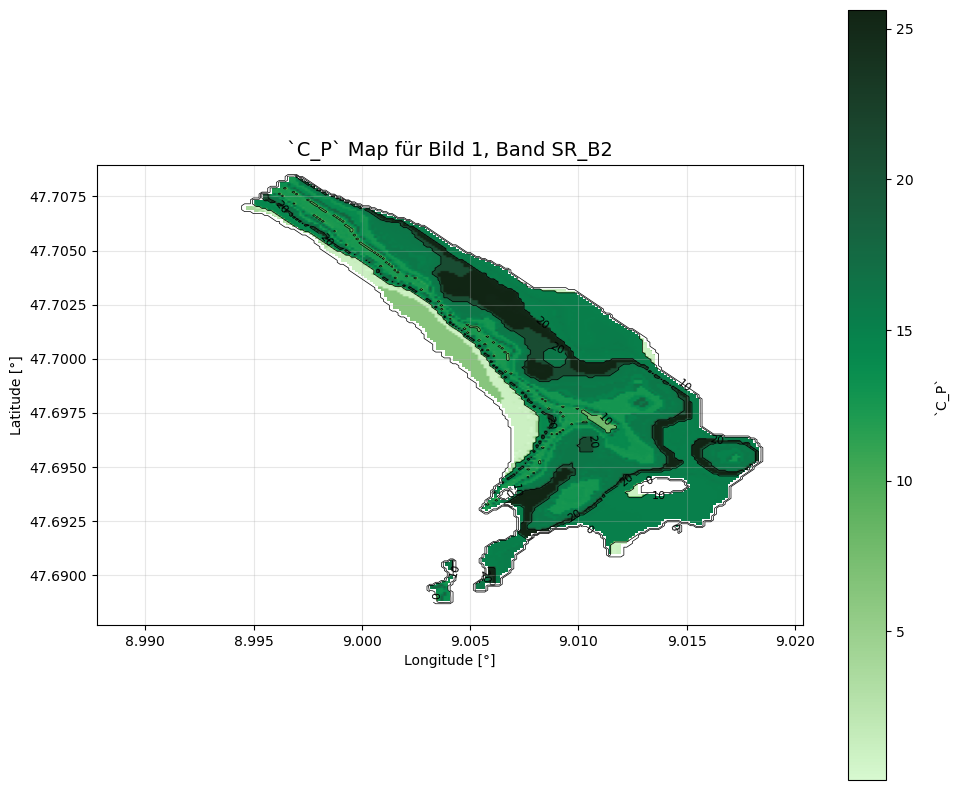

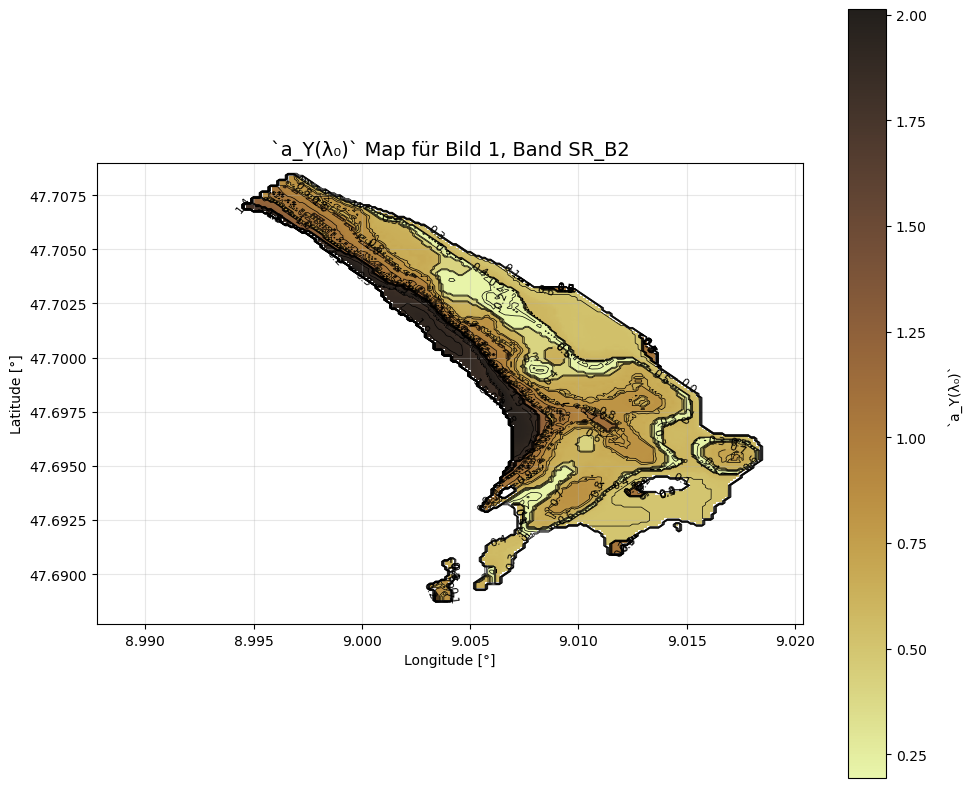

In [84]:
def simulate_rrs_pixel(a, theta_s, theta_v, Rrs_inf, ars1, ars2, k0,
                       krs1_W, krs2_W, krs1_B, krs2_B, R_B, z_B, bb):
    import numpy as np
    wb = bb / (a + bb)
    
    Kd = k0 * (a + bb) / np.cos(theta_s)
    Ku_W = (a + bb) * (1 + wb)**krs1_W * (1 + krs2_W / np.cos(theta_s)) / np.cos(theta_v)
    Ku_B = (a + bb) * (1 + wb)**krs1_B * (1 + k2b / np.cos(theta_s)) / np.cos(theta_v)

    exp1 = np.exp(-(Kd + Ku_W) * z_B)
    exp2 = np.exp(-(Kd + Ku_B) * z_B)

    Rrs_sim = Rrs_inf * (1 - ars1 * exp1) + ars2 * (R_B / np.pi) * exp2
    return Rrs_sim

def residuals_pixelwise(a, Rrs_measured, theta_s, theta_v, Rrs_inf,
                        ars1, ars2, k0, krs1_W, krs2_W, krs1_B, krs2_B,
                        R_B, z_B, bb):
    Rrs_model = simulate_rrs_pixel(a[0], theta_s, theta_v, Rrs_inf, ars1, ars2,
                                   k0, krs1_W, krs2_W, krs1_B, krs2_B, R_B, z_B, bb)
    return Rrs_measured - Rrs_model

def optimize_a_pixelwise(
    R_rs_measured, theta_s, theta_v, Rrs_inf,
    ars1, ars2, k0, k1u, k2u, k1b, k2b,
    R_B, z_B, bb, aw=1.0, a_init=0.75, threshold=0.001, max_iter=2000
):
    import numpy as np

    a_result = np.full_like(R_rs_measured, np.nan, dtype=np.float64)
    valid_mask = ~np.isnan(R_rs_measured) & ~np.isnan(z_B) & ~np.isnan(bb)
    rows, cols = np.where(valid_mask)

    for i, j in zip(rows, cols):
        a = a_init
        for _ in range(max_iter):
            wb = bb[i, j] / (a + bb[i, j])
            
            Kd = k0 * (a + bb[i, j]) / np.cos(theta_s)
            Ku_W = ((a + bb[i, j]) * (1 + wb)**k1u * (1 + k2u / np.cos(theta_s)))/ np.cos(theta_v)
            Ku_B = ((a + bb[i, j]) * (1 + wb)**k1b * (1 + k2b / np.cos(theta_s)))/ np.cos(theta_v)

            exp1 = np.exp(-(Kd + Ku_W) * z_B[i, j])
            exp2 = np.exp(-(Kd + Ku_B) * z_B[i, j])

            Rrs_sim = Rrs_inf[i, j] * (1 - ars1 * exp1) + ars2 * (R_B / np.pi) * exp2
            error = abs(R_rs_measured[i, j] - Rrs_sim)

            if error < threshold:
                break

            a += (R_rs_measured[i, j] - Rrs_sim) * 0.005
            a = np.clip(a, aw, 5.0)

        a_result[i, j] = a

    return a_result

#def residuals(params, a_measured, a_W, a_P_star, lambda_val):
def residuals(params, a_measured, a_W, a_P_star, ay):
        C_P, a_Y_lambda0 = params
        return a_measured - (a_W + a_P_star * C_P + a_Y_lambda0 * ay)
        #return a_measured - (a_W + a_P_star * C_P + a_Y_lambda0 * np.exp(-0.011 * (lambda_val - LAMBDA_0)))

if mission== "Sentinel":
    CP_MIN, CP_MAX = 0.0, 100.0
    AY_MIN, AY_MAX = 0.0, 5.0
    LAMBDA_0 = 443

    bands_with_lambda = {
        "B1": 443,
        "B2": 490#,
      #  "B3": 560,
      #  "B4": 665,
      #  "B5": 705,
       # "B6": 740,
      #  "B7": 783,
       # "B11": 1610,
    }

    cp_ay_results = []
    
    for band, wavelength in bands_with_lambda.items():
        for image_idx in range(num_images):
            print(f"\nBerechnung von `C_P` und `a_Y(λ₀)` für Bild {image_idx + 1} mit Band {band}...")

            try:
                a_measured = next(
                    (entry["a_values"] for entry in all_a_values if entry["Bildnummer"] == image_idx + 1 and entry["Band"] == band),
                    None
                )

                if a_measured is None or np.isnan(a_measured).all():
                    print(f"  ➝ Keine gültigen a-Werte vorhanden, überspringe...")
                    continue

                aw = empirical_coefficients[band]["aw"]
                aP_star = empirical_coefficients[band]["a*_P"]
                ay_star = empirical_coefficients[band]["a*_Y"]

                if np.isnan(aw) or np.isnan(aP_star):
                    print(f"  ➝ Ungültige Koeffizientenwerte für Band {band}, überspringe...")
                    continue

                C_P_values = np.full_like(a_measured, np.nan)
                a_Y_lambda0_values = np.full_like(a_measured, np.nan)
                initial_guess = np.array([10.0, 0.5])

                for i in range(a_measured.shape[0]):
                    for j in range(a_measured.shape[1]):
                        if np.isnan(a_measured[i, j]):
                            continue

                        try:
                            result = least_squares(
                                residuals,
                                initial_guess,
                                #args=(a_measured[i, j], aw, aP_star, wavelength),
                                args=(a_measured[i, j], aw, aP_star, ay_star),
                                bounds=([CP_MIN, AY_MIN], [CP_MAX, AY_MAX])
                            )
                            C_P_values[i, j], a_Y_lambda0_values[i, j] = result.x
                        except Exception:
                            continue

                cp_ay_results.append({
                    "Bildnummer": image_idx + 1,
                    "Band": band,
                    "C_P": C_P_values,
                    "a_Y_lambda0": a_Y_lambda0_values,
                })

                print(f"  ➝ Optimierung abgeschlossen für Bild {image_idx + 1}, Band {band}")

                for data, title, cmap, levels in zip(
                        [C_P_values, a_Y_lambda0_values],
                        ["`C_P` Map", "`a_Y(λ₀)` Map"],
                        [cmocean.cm.algae, cmocean.cm.turbid],
                        [np.arange(0, 100.1, 10), np.arange(0, 5.01, 0.1)]
                    ):
                    valid_values = data[~np.isnan(data)]
                    if valid_values.size > 0:
                        vmin, vmax = np.nanpercentile(valid_values, [5, 95])
                    else:
                        vmin, vmax = np.nanmin(data), np.nanmax(data)

                    fig, ax = plt.subplots(figsize=(10, 8))
                    im = ax.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax, extent=[
                        region.bounds().coordinates().getInfo()[0][0][0], 
                        region.bounds().coordinates().getInfo()[0][2][0], 
                        region.bounds().coordinates().getInfo()[0][0][1], 
                        region.bounds().coordinates().getInfo()[0][2][1]
                    ])
                    
                
                    contour_data = np.nan_to_num(data, nan=0.0)
                    contour = ax.contour(contour_data, levels=levels, colors='black', linewidths=0.5, extent=[lon_min, lon_max, lat_max, lat_min])
                    ax.clabel(contour, fmt='%0.1f' if "a_Y" in title else '%d', fontsize=8)
                    ax.set_title(f"{title} für Bild {image_idx + 1}, Band {band}", fontsize=14)
                    ax.set_xlabel("Longitude [°]")
                    ax.set_ylabel("Latitude [°]")
                    plt.grid(alpha=0.3)
                    cbar = plt.colorbar(im, ax=ax)
                    cbar.set_label(title.split()[0], rotation=90, labelpad=15)
                    plt.tight_layout()
                    plt.grid(alpha=0.3)
                    plt.show()

            except Exception as e:
                print(f"  ⚠️ Fehler bei Bild {image_idx + 1}, Band {band}: {e}")
                continue
                
if mission== "Landsat":
        CP_MIN, CP_MAX = 0.0, 100.0
        AY_MIN, AY_MAX = 0.0, 5.0
        LAMBDA_0 = 443

        bands_with_lambda = {
            'SR_B1': 443,
            'SR_B2': 482#,
           # 'SR_B3': 560,
           # 'SR_B4': 655,
           # 'SR_B5': 842
        }

        cp_ay_results = []

        for band, wavelength in bands_with_lambda.items():
            for image_idx in range(num_images):
                print(f"\nBerechnung von `C_P` und `a_Y(λ₀)` für Bild {image_idx + 1} mit Band {band}...")

                try:
                    a_measured = next(
                        (entry["a_values"] for entry in all_a_values if entry["Bildnummer"] == image_idx + 1 and entry["Band"] == band),
                        None
                    )

                    if a_measured is None or np.isnan(a_measured).all():
                        print(f"  ➝ Keine gültigen a-Werte vorhanden, überspringe...")
                        continue

                    aw = empirical_coefficients[band]["aw"]
                    aP_star = empirical_coefficients[band]["a*_P"]
                    ay_star = empirical_coefficients[band]["a*_Y"]

                    if np.isnan(aw) or np.isnan(aP_star):
                        print(f"  ➝ Ungültige Koeffizientenwerte für Band {band}, überspringe...")
                        continue

                    C_P_values = np.full_like(a_measured, np.nan)
                    a_Y_lambda0_values = np.full_like(a_measured, np.nan)
                    initial_guess = np.array([10.0, 0.5])

                    for i in range(a_measured.shape[0]):
                        for j in range(a_measured.shape[1]):
                            if np.isnan(a_measured[i, j]):
                                continue
                            try:
                                result = least_squares(
                                    residuals,
                                    initial_guess,
                                    args=(a_measured[i, j], aw, aP_star, ay_star),
                                    #args=(np.array([a_measured[i, j]]), aw, aP_star, wavelength),
                                    bounds=([CP_MIN, AY_MIN], [CP_MAX, AY_MAX])
                                )
                                C_P_values[i, j], a_Y_lambda0_values[i, j] = result.x
                            except Exception as e:
                                print(f"   ⚠️ Fehler bei Pixel ({i},{j}): {e}")
                                continue

                    cp_ay_results.append({
                        "Bildnummer": image_idx + 1,
                        "Band": band,
                        "C_P": C_P_values,
                        "a_Y_lambda0": a_Y_lambda0_values,
                    })

                    print(f"📌 Band: {band}, Bild: {image_idx + 1}")
                    print(f"   a_measured: min={np.nanmin(a_measured):.4f}, max={np.nanmax(a_measured):.4f}, NaNs={np.isnan(a_measured).sum()}")
                    print(f"   aw = {aw:.4f}, aP_star = {aP_star:.4f}, λ = {wavelength}")
                    print(f"  ➝ Optimierung abgeschlossen für Bild {image_idx + 1}, Band {band}")
                    if not np.isnan(C_P_values).all():
                        print(f"   ⬅️ Mittelwert C_P: {np.nanmean(C_P_values):.3f}")
                    else:
                        print(f"   ⬅️ Mittelwert C_P: nur NaN-Werte")
                    if not np.isnan(a_Y_lambda0_values).all():
                        print(f"   ⬅️ Mittelwert a_Y(λ₀): {np.nanmean(a_Y_lambda0_values):.3f}")
                    else:
                        print(f"   ⬅️ Mittelwert a_Y(λ₀): nur NaN-Werte")

                    for data, title, cmap, levels in zip(
                        [C_P_values, a_Y_lambda0_values],
                        ["`C_P` Map", "`a_Y(λ₀)` Map"],
                        [cmocean.cm.algae, cmocean.cm.turbid],
                        [np.arange(0, 100.1, 10), np.arange(0, 5.01, 0.1)]
                    ):
                        fig, ax = plt.subplots(figsize=(10, 8))
                        im = ax.imshow(data, cmap=cmap, extent=extent_b7)
                        contour_data = np.nan_to_num(data, nan=0.0)
                        contour = ax.contour(contour_data, levels=levels, colors='black', linewidths=0.5, extent=[lon_min, lon_max, lat_max, lat_min])
                        ax.clabel(contour, fmt='%0.1f' if "a_Y" in title else '%d', fontsize=8)
                    
                        ax.set_title(f"{title} für Bild {image_idx + 1}, Band {band}", fontsize=14)
                        ax.set_xlabel("Longitude [°]")
                        ax.set_ylabel("Latitude [°]")
                        plt.grid(alpha=0.3)
                        cbar = plt.colorbar(im, ax=ax)
                        cbar.set_label(title.split()[0], rotation=90, labelpad=15)
                        plt.tight_layout()
                        plt.show()

                except Exception as e:
                    print(f" Fehler bei Bild {image_idx + 1}, Band {band}: {e}")
                    continue

In [85]:
# Ergbnisse hier zeigen unssin ab B6, -> 740 nm, passt aj dazu dsass ab 750 nm cp nicht mehr absorpiert wird
# Für cp wäre daher gut B1 440 nm und b4/b5 (665/705)
# Für Gelbstoff peak B1, but a higher than a for phytoplankton

# cp absorption: albert 2004: peak 440 nm, sharply peak around 675 nm, green light weak, only 40% at 550 compared to 440, no absption above 750 nm. 
#Even for low amount of gelbstoﬀ, the absorption in the blue from 400 to 450 nm is higher than the absorption of phytoplankton.

# Mosaic ? ay -> B1, cp -> B2 besseres zusammenspiel beider werte, input für iteration
if mission == "Sentinel":
    for image_idx in range(num_images):

        try:
            ay_entry = next(
                    (entry for entry in cp_ay_results 
                     if entry["Bildnummer"] == image_idx + 1 and entry["Band"] == "B1"), 
                None
                    )
            cp_entry = next(
                (entry for entry in cp_ay_results 
                 if entry["Bildnummer"] == image_idx + 1 and entry["Band"] == "B2"), 
                None
            )

            if ay_entry is None or cp_entry is None:
                    print(f"  ➝ Kein `C_P` oder `a_Y_lambda0` für Bild {image_idx + 1} gefunden, überspringe...")
                    continue

            ay_estimated = ay_entry["a_Y_lambda0"]
            cp_estimated = cp_entry["C_P"]

        except (IndexError, KeyError):
            print(f"  ➝ Keine Werte für Bild {image_idx + 1} gefunden, überspringe...")
            continue
    
elif mission== "Landsat": 
    for image_idx in range(num_images):  # <- hier die fehlende Schleife ergänzt
        try:
            ay_entry = next(
                (entry for entry in cp_ay_results 
                 if entry["Bildnummer"] == image_idx + 1 and entry["Band"] == "SR_B1"), 
                None
            )
            cp_entry = next(
                (entry for entry in cp_ay_results 
                 if entry["Bildnummer"] == image_idx + 1 and entry["Band"] == "SR_B2"), 
                None
            )

            if ay_entry is None or cp_entry is None:
                print(f"  ➝ Kein `C_P` oder `a_Y_lambda0` für Bild {image_idx + 1} gefunden, überspringe...")
                continue

            ay_estimated = ay_entry["a_Y_lambda0"]
            cp_estimated = cp_entry["C_P"]

        except (IndexError, KeyError):
            print(f"  ➝ Keine Werte für Bild {image_idx + 1} gefunden, überspringe...")
            continue

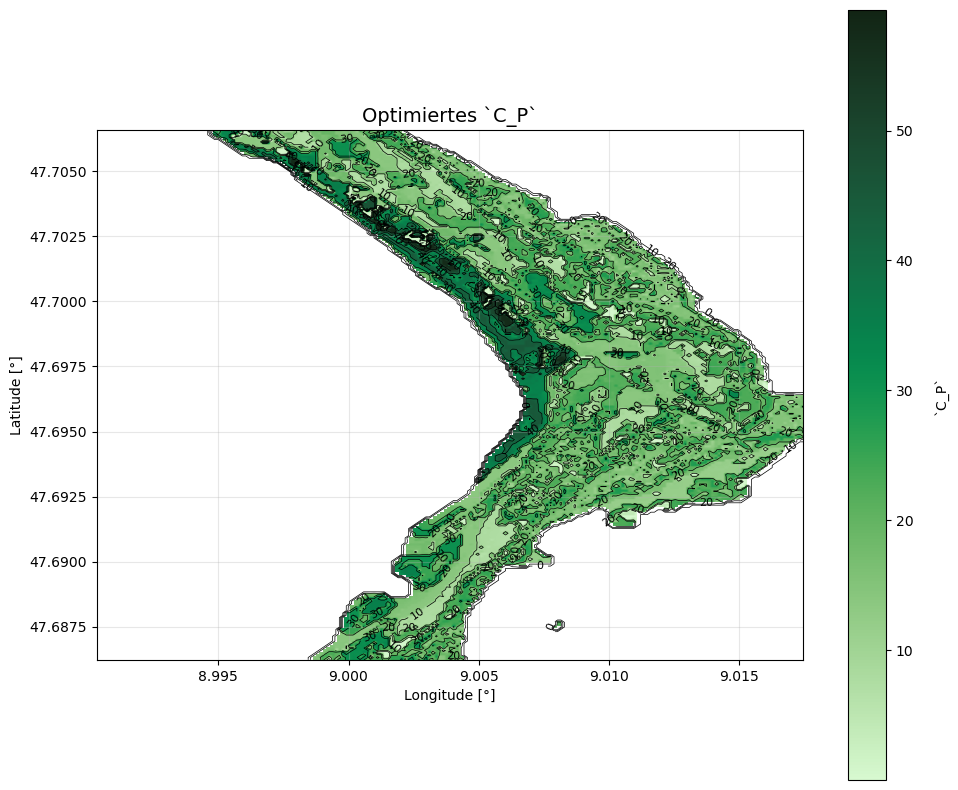

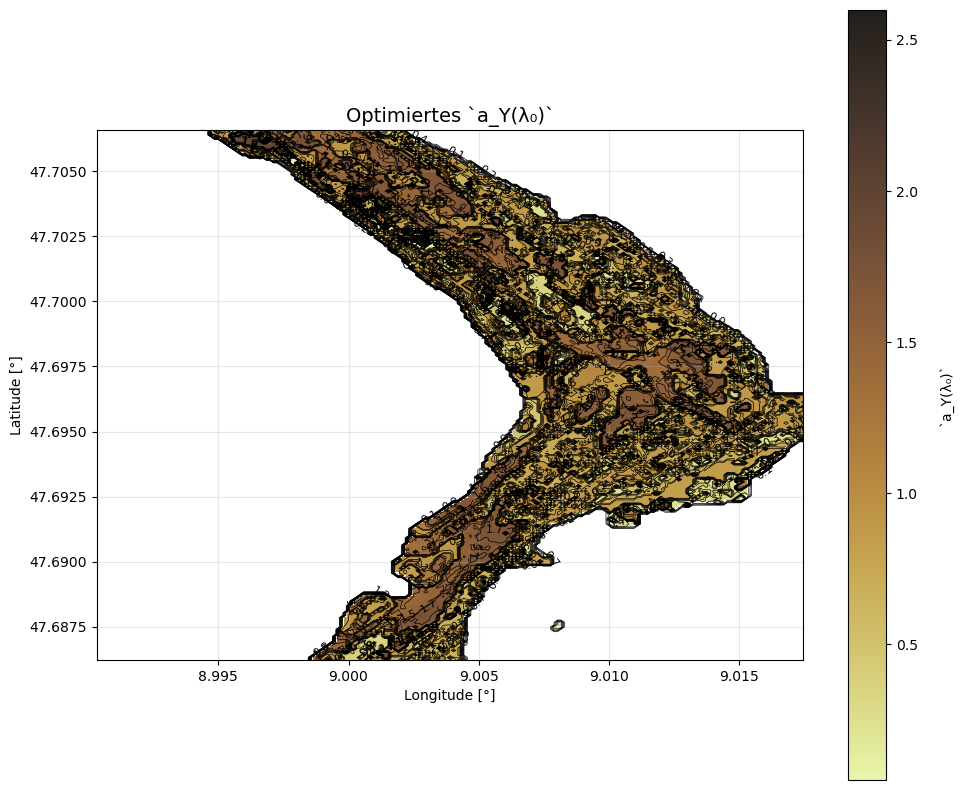

In [34]:
#ohne ghet es besser. 


def model_a(params, aw, aP_star, wavelength, LAMBDA_0=443):
    C_P, a_Y_lambda0 = params
    return aw + aP_star * C_P + a_Y_lambda0 * np.exp(-0.011 * (wavelength - LAMBDA_0))

def residuals(params, a_measured, aw, aP_star, wavelength, LAMBDA_0=443):
    return a_measured - model_a(params, aw, aP_star, wavelength, LAMBDA_0)

def reoptimize_cp_ay_from_estimates(
    a_measured_map,  # 2D array of measured a values (per band)
    cp_estimated_map,  # estimated initial C_P values (same shape)
    ay_estimated_map,  # estimated initial a_Y(λ₀) values (same shape)
    aw, aP_star, wavelength,
    cp_bounds=(0.0, 100.0), ay_bounds=(0.0, 5.0)
):
    cp_optimized = np.full_like(a_measured_map, np.nan)
    ay_optimized = np.full_like(a_measured_map, np.nan)

    for i in range(a_measured_map.shape[0]):
        for j in range(a_measured_map.shape[1]):
            a_val = a_measured_map[i, j]
            cp_init = cp_estimated_map[i, j]
            ay_init = ay_estimated_map[i, j]

            if np.isnan(a_val) or np.isnan(cp_init) or np.isnan(ay_init):
                continue

            try:
                result = least_squares(
                    residuals,
                    x0=np.array([cp_init, ay_init]),
                    bounds=([cp_bounds[0], ay_bounds[0]], [cp_bounds[1], ay_bounds[1]]),
                    args=(a_val, aw, aP_star, wavelength)
                )
                cp_optimized[i, j], ay_optimized[i, j] = result.x
            except Exception as e:
                continue

    return cp_optimized, ay_optimized

if mission=="Sentinel":

    cp_optimized, ay_optimized = reoptimize_cp_ay_from_estimates(
        a_measured_map= next((entry["a_values"] for entry in all_a_values if entry["Bildnummer"] == image_idx + 1 and entry["Band"] == "B2")),
        cp_estimated_map=cp_estimated,
        ay_estimated_map=ay_estimated,
        aw=empirical_coefficients["B2"]["aw"],
        aP_star=empirical_coefficients["B2"]["a*_P"],
        wavelength=490
    )

elif mission=="Landsat":

    cp_optimized, ay_optimized = reoptimize_cp_ay_from_estimates(
        a_measured_map= next((entry["a_values"] for entry in all_a_values if entry["Bildnummer"] == image_idx + 1 and entry["Band"] == "SR_B2")),
        cp_estimated_map=cp_estimated,
        ay_estimated_map=ay_estimated,
        aw=empirical_coefficients["SR_B2"]["aw"],
        aP_star=empirical_coefficients["SR_B2"]["a*_P"],
        wavelength=482
    )

for data, title, cmap, levels in zip(
    [cp_optimized, ay_optimized],
    ["Optimiertes `C_P`", "Optimiertes `a_Y(λ₀)`"],
    [cmocean.cm.algae, cmocean.cm.turbid],
    [np.arange(0, 100.1, 10), np.arange(0, 5.01, 0.1)]
):
    fig, ax = plt.subplots(figsize=(10, 8))
    im = ax.imshow(data, cmap=cmap, extent=extent_b7)

    contour_data = np.nan_to_num(data, nan=0.0)
    contour = ax.contour(contour_data, levels=levels, colors='black', linewidths=0.5, extent=[lon_min, lon_max, lat_max, lat_min])               
    ax.clabel(contour, fmt='%0.1f' if "a_Y" in title else '%d', fontsize=8)
    ax.set_title(title, fontsize=14)
    ax.set_xlabel("Longitude [°]")
    ax.set_ylabel("Latitude [°]")
    plt.grid(alpha=0.3)
    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label(title.split()[1], rotation=90, labelpad=15)
    plt.tight_layout()
    plt.show()

In [159]:
def plot_comparison(name_x, data_x, name_y, data_y, max_depth=None):
    from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
    import matplotlib.pyplot as plt
    valid_mask = ~np.isnan(data_x) & ~np.isnan(data_y)
    if max_depth is not None:
        valid_mask &= data_y <= max_depth

    x = data_x[valid_mask].flatten()
    y = data_y[valid_mask].flatten()

    if len(x) == 0:
        print(f"⚠️ Keine gültigen Daten für {name_x} vs. {name_y} bis {max_depth} m.")
        return
    r2 = r2_score(y, x)
    rmse = mean_squared_error(y, x, squared=False)
    mae = mean_absolute_error(y, x)
    bias = np.mean(x - y)
    
    coeffs = np.polyfit(x, y, 1)
    poly_eqn = np.poly1d(coeffs)
    x_line = np.linspace(min(x.min(), y.min()), max(x.max(), y.max()), 100)
    y_line = poly_eqn(x_line)

    distance = np.abs(x - y)

    fig, ax = plt.subplots(figsize=(6.5, 5)) 
    sc = ax.scatter(x, y, c=distance, cmap='viridis', s=10, alpha=0.6)
    ax.plot(x_line, x_line, color='black', linestyle='--', label='1:1')
    ax.plot(x_line, y_line, color='red', label='Regression')

    ax.set_xlabel(f"{name_x} chlorophyll-a concentration [µg/l]")
    ax.set_ylabel(f"{name_y} chlorophyll-a concentration [µg/l]")
    ax.grid(alpha=0.3)
    ax.legend(loc="lower right")

    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label('Offset from 1:1 line [µg/l]')

    stats_text = (
        f"$N$ = {len(x)}\n"
        f"$R^2$ = {r2:.2f}\n"
        f"RMSE = {rmse:.2f} µg/l\n"
        f"MAE = {mae:.2f} µg/l\n"
        f"Bias = {bias:.2f} µg/l"
    )
    ax.text(0.05, 0.3, stats_text, transform=ax.transAxes, fontsize=12,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    plt.tight_layout()
    filename = f"{name_x}_vs_{name_y}_chl.pdf".replace(" ", "_")
    plt.savefig(filename, format="pdf", dpi=300)
    plt.show()

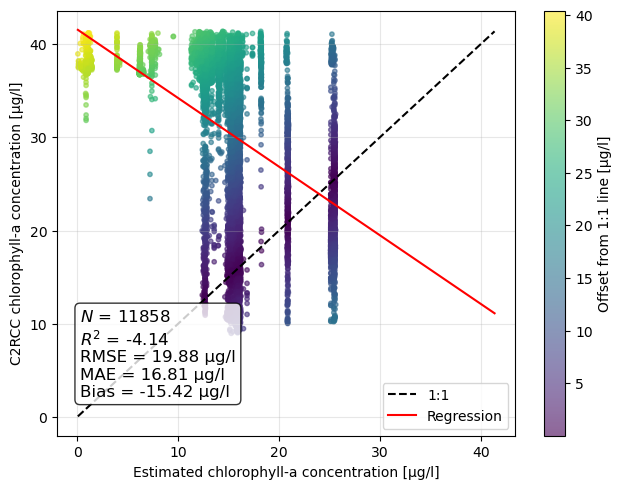


📊 Statistik-Tabelle: Estimated vs. C2RCC
Tiefenbereich [m]   N  RMSE [m]   MAE [m]   Bias [m]            R²
          0.0–0.5   0       NaN       NaN        NaN           NaN
          0.5–1.0   0       NaN       NaN        NaN           NaN
          1.0–1.5   0       NaN       NaN        NaN           NaN
          1.5–2.0   0       NaN       NaN        NaN           NaN
          2.0–2.5   0       NaN       NaN        NaN           NaN
          2.5–3.0   0       NaN       NaN        NaN           NaN
          3.0–3.5   0       NaN       NaN        NaN           NaN
          3.5–4.0   0       NaN       NaN        NaN           NaN
          4.0–4.5   0       NaN       NaN        NaN           NaN
          4.5–5.0   0       NaN       NaN        NaN           NaN
          5.0–5.5   0       NaN       NaN        NaN           NaN
          5.5–6.0   0       NaN       NaN        NaN           NaN
          6.0–6.5   0       NaN       NaN        NaN           NaN
          6.5–7.0   

In [160]:
comparisons = [
    ("Estimated", cp_estimated, "C2RCC", cp_aligned1)
]

for name_x, data_x, name_y, data_y in comparisons:
    plot_comparison(name_x, data_x, name_y, data_y)
    evaluate_bins(name_x, data_x, name_y, data_y)
    

In [157]:
def plot_comparison(name_x, data_x, name_y, data_y, max_depth=None):
    from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
    import matplotlib.pyplot as plt
    valid_mask = ~np.isnan(data_x) & ~np.isnan(data_y)
    if max_depth is not None:
        valid_mask &= data_y <= max_depth

    x = data_x[valid_mask].flatten()
    y = data_y[valid_mask].flatten()

    if len(x) == 0:
        print(f"⚠️ Keine gültigen Daten für {name_x} vs. {name_y} bis {max_depth} m.")
        return
    r2 = r2_score(y, x)
    rmse = mean_squared_error(y, x, squared=False)
    mae = mean_absolute_error(y, x)
    bias = np.mean(x - y)
    
    coeffs = np.polyfit(x, y, 1)
    poly_eqn = np.poly1d(coeffs)
    x_line = np.linspace(min(x.min(), y.min()), max(x.max(), y.max()), 100)
    y_line = poly_eqn(x_line)

    distance = np.abs(x - y)

    fig, ax = plt.subplots(figsize=(6.5, 5)) 
    sc = ax.scatter(x, y, c=distance, cmap='viridis', s=10, alpha=0.6)
    ax.plot(x_line, x_line, color='black', linestyle='--', label='1:1')
    ax.plot(x_line, y_line, color='red', label='Regression')

    ax.set_xlabel(f"{name_x} absorption coeﬃcient of gelbstoﬀ [m−1]")
    ax.set_ylabel(f"{name_y} absorption coeﬃcient of gelbstoﬀ [m−1]")
    ax.grid(alpha=0.3)
    ax.legend(loc="lower right")

    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label('Offset from 1:1 line [m−1]')

    stats_text = (
        f"$N$ = {len(x)}\n"
        f"$R^2$ = {r2:.2f}\n"
        f"RMSE = {rmse:.2f} m−1\n"
        f"MAE = {mae:.2f} m−1\n"
        f"Bias = {bias:.2f} m−1"
    )
    ax.text(0.05, 0.3, stats_text, transform=ax.transAxes, fontsize=12,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    plt.tight_layout()
    filename = f"{name_x}_vs_{name_y}_gelb.pdf".replace(" ", "_")
    plt.savefig(filename, format="pdf", dpi=300)
    plt.show()

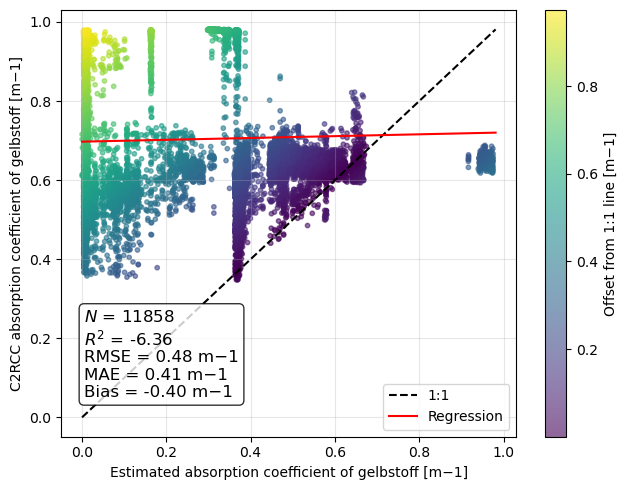


📊 Statistik-Tabelle: Estimated vs. C2RCC
Tiefenbereich [m]     N  RMSE [m]  MAE [m]  Bias [m]         R²
          0.0–0.5   978  0.363119 0.315586 -0.314586 -83.691861
          0.5–1.0 10880  0.492872 0.419185 -0.407167  -7.565125


In [158]:
comparisons = [
    ("Estimated", ay_estimated, "C2RCC", ay_aligned1)
]

for name_x, data_x, name_y, data_y in comparisons:
    plot_comparison(name_x, data_x, name_y, data_y)
    evaluate_bins(name_x, data_x, name_y, data_y)
    

In [ ]:
# geändert, bei einem fehlenden wert so wie bei beidem fehlenden bercehnen und dann nur dne fehlenden verwendetn

### **10. Simultaneous Optimization of `z_B`, `C_X`, `C_P` and `a_Y(λ₀)`**

The final step involves a **simultaneous pixelwise optimization** of the four key parameters:

- **`z_B`**: Water depth  
- **`C_X`**: Suspended sediment concentration  
- **`C_P`**: Particle concentration  
- **`a_Y(λ₀)`**: Absorption of yellow substances at reference wavelength λ₀  

This step is crucial to improve the accuracy of the reflectance simulation by refining the input parameters based on measured reflectance values.

---

#### **Optimization Strategy**

The following equation forms the core of the optimization:

\[
a(\lambda) = a_W(\lambda) + a_P^*(\lambda) \cdot C_P + a_Y(\lambda_0) \cdot e^{-s_Y(\lambda - \lambda_0)}
\]

\[
bb(\lambda) = bb_W(\lambda) + bb_X(\lambda) \cdot C_X
\]

These parameters influence:

- **`w_B`**: Single-scattering albedo  
- **`K_d`**: Diffuse attenuation coefficient  
- **`Ku`**: Upward attenuation coefficient  
- **`R_{rs_{simulated}}`**: Simulated surface reflectance

The optimization minimizes the difference between the simulated reflectance **`R_{rs_{simulated}}`** and the measured reflectance **`R_{rs_{measured}}`**.

---

#### **Parameter Constraints**

| Parameter    | Range                           | Unit              |
|-------------|---------------------------------|-------------------|
| `C_X`        | 0 to 50.0                    | mg/l              |
| `C_P`        | 0 to 100.0                    | µg/l              |
| `a_Y(λ₀)`    | 0 to 5.0                     | m⁻¹               |
| `z_B`        | ±40% variation from initial z_B | meters            |

---

#### **Pixelwise Optimization Approach**

For each pixel:

1. Load the initial values:
    - `R_rs_measured` for Band B3
    - Initial estimates of `C_X`, `C_P`, `a_Y(λ₀)`, and `z_B`
  
2. Define the residual function:
    - Calculate **`a(λ)`** and **`bb(λ)`** based on current parameters.
    - Compute **`R_{rs_{simulated}}`**.
    - Return the difference between **`R_{rs_{simulated}}`** and **`R_{rs_{measured}}`**.

3. Apply the **Nelder-Mead Simplex Algorithm** (or bounded least squares) with the specified parameter ranges.

4. Store optimized parameters for each pixel.

---

#### **Result Visualization**

- Visualize optimized maps for:
  - **`C_X`**
  - **`C_P`**
  - **`a_Y(λ₀)`**
  - **`z_B`**
  
Each map is plotted per image, showing spatial variability across the scene.

---


In [ ]:
he input spectrum is fitted for infrared wavelengths
from 700 to 800 nm and then for blue from 400 to 500 nm. The investigations to optimise
between accuracy and computation time showed that a wavelength interval of 5 nm is suﬃcient
here and also a maximum number of iterations of the Simplex of 100. This step improves the
accuracy of the initial values of those parameters, which have a strong impact on specific spectral
regions: suspended matter concentration in the infrared and gelbstoﬀ absorption in the blue.
Furthermore, the initial values of the phytoplankton concentration and the bottom depth are
improved as well.
The pre-calculations and pre-fits are finished at this point and the main fit starts calculating all
fit parameters selected by the user. albert 2004
dh. b1 und b2, sowie b

1. Optimierung

In [187]:
def residuals_opt(params, Rrs_pixel, ay,theta_s, theta_v, Rrs_inf, ars1, ars2, ko, aw, aP_star, wavelength, bbw, bb_x):
    return Rrs_pixel - simulate_rrs_pixel(params, ay,theta_s, theta_v, Rrs_inf, ars1, ars2, ko, aw, aP_star, wavelength, bbw, bb_x)

def simulate_rrs_pixel(params, ay,theta_s, theta_v, Rrs_inf, ars1, ars2, ko, aw, aP_star, wavelength, bbw, bb_x):
    import numpy as np
    zB, CX, CP, aY0, R_B = params
    bb = bbw + bb_x * CX 
   # a = aw + aP_star * CP + aY0 * np.exp(-0.011 * (wavelength - 440))
    a = aw + aP_star * CP + aY0 * ay
    wb = bb / (a + bb)
    Kd = ko * (a + bb) / np.cos(theta_s)
    Ku_W = (a + bb) * (1 + wb) ** k1u * (1 + k2u / np.cos(theta_s)) / np.cos(theta_v)
    Ku_B = (a + bb) * (1 + wb) ** k1b * (1 + k2b / np.cos(theta_s))/ np.cos(theta_v)
    exp_KuW = np.exp(-(Kd + Ku_W) * zB)
    exp_KuB = np.exp(-(Kd + Ku_B) * zB)
    Rrs_sim = Rrs_inf * (1 - ars1 * exp_KuW) + ars2 * (R_B/np.pi) * exp_KuB
    #Rrs_sim = Rrs_inf * (1 - ars1 * exp_KuW) + ars2 * R_B * exp_KuB
    return Rrs_sim


➝ Optimierung mit R_B für Bild 1, Band SR_B2...
 Optimierung abgeschlossen für Band SR_B2


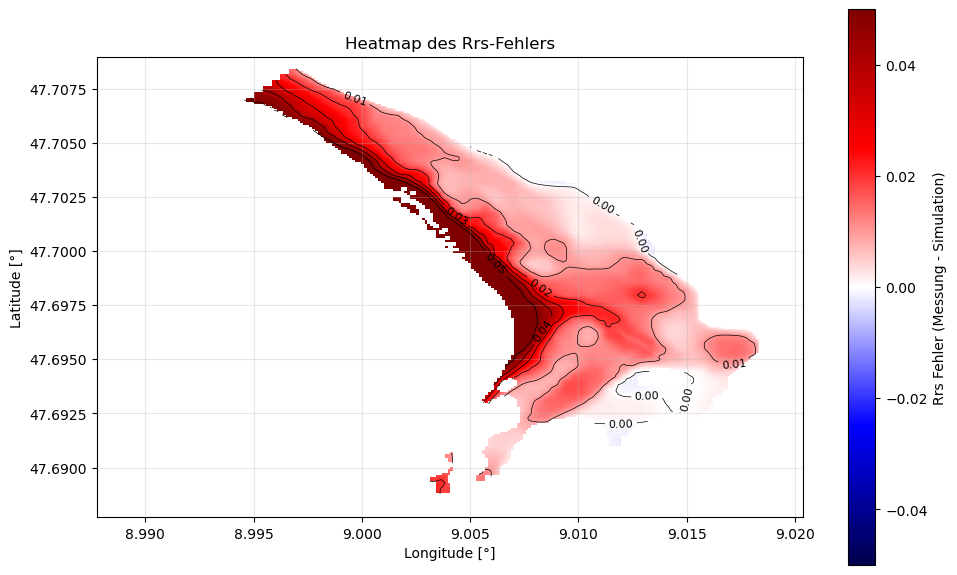

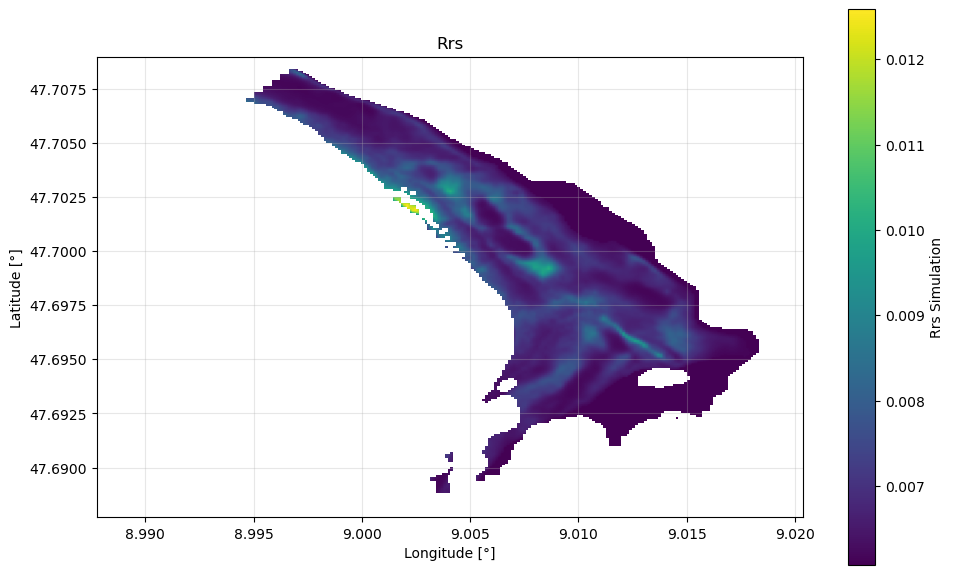

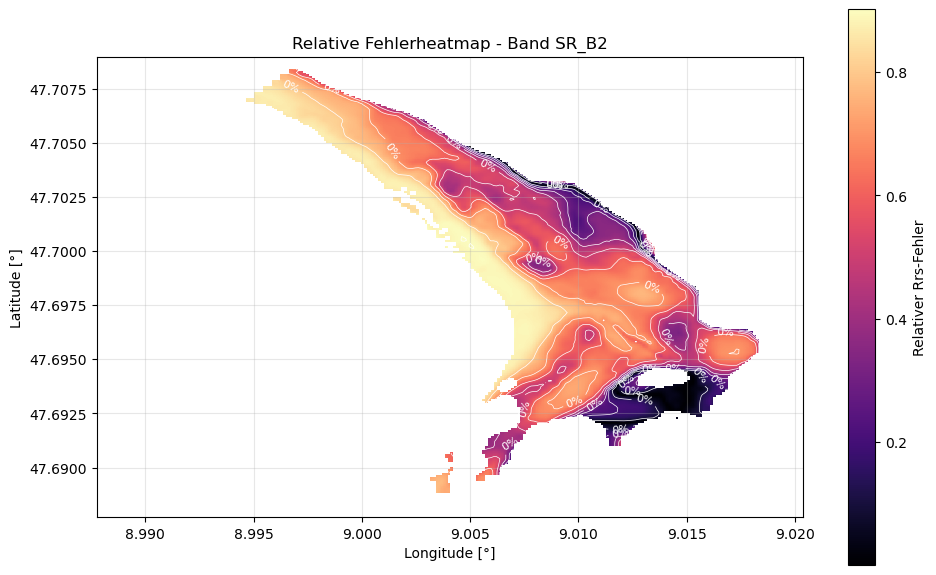


➝ Optimierung mit R_B für Bild 1, Band SR_B3...
 Optimierung abgeschlossen für Band SR_B3


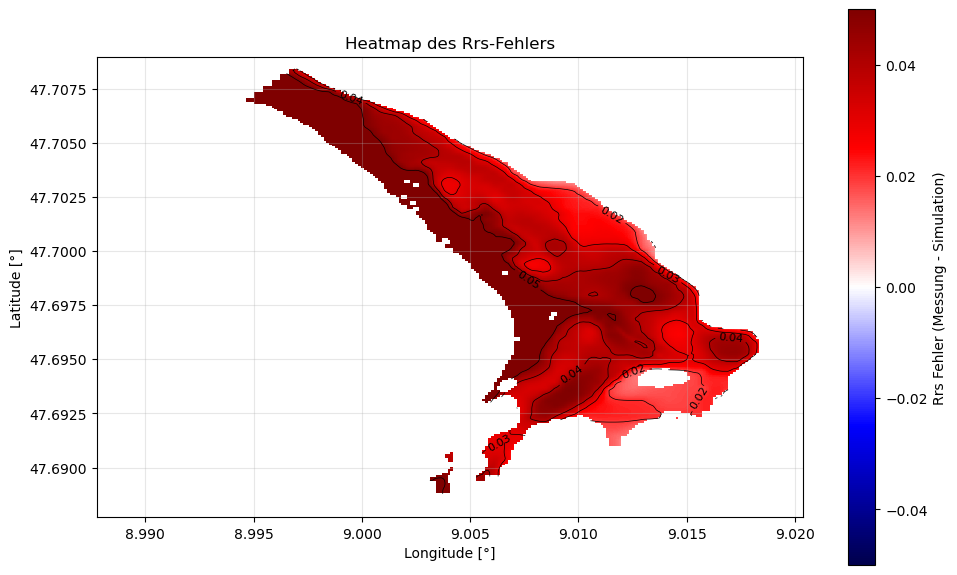

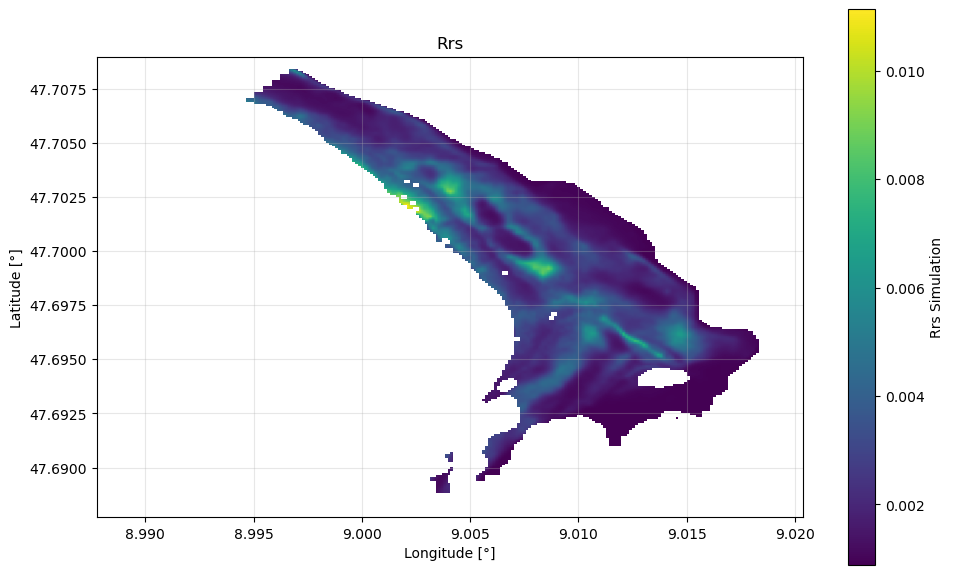

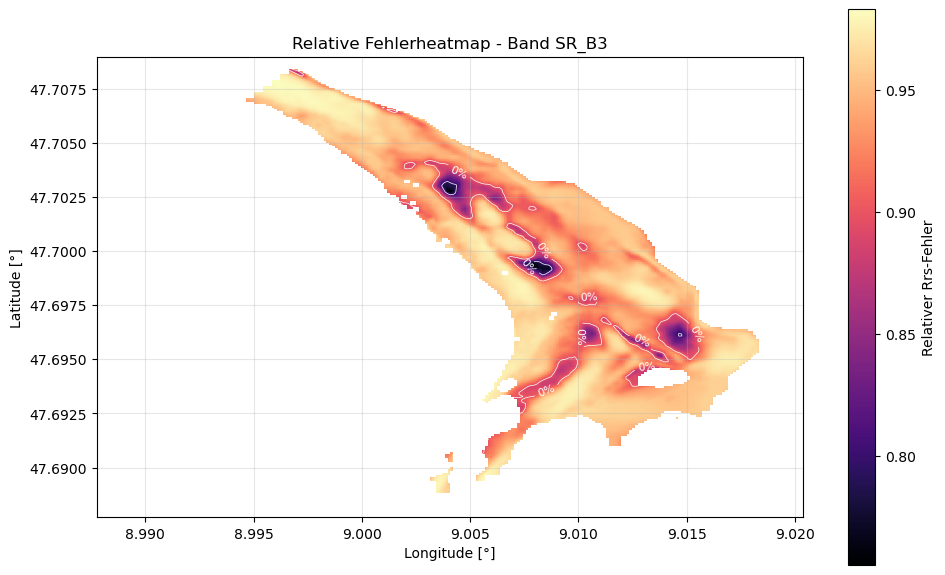


➝ Optimierung mit R_B für Bild 1, Band SR_B4...
 Optimierung abgeschlossen für Band SR_B4


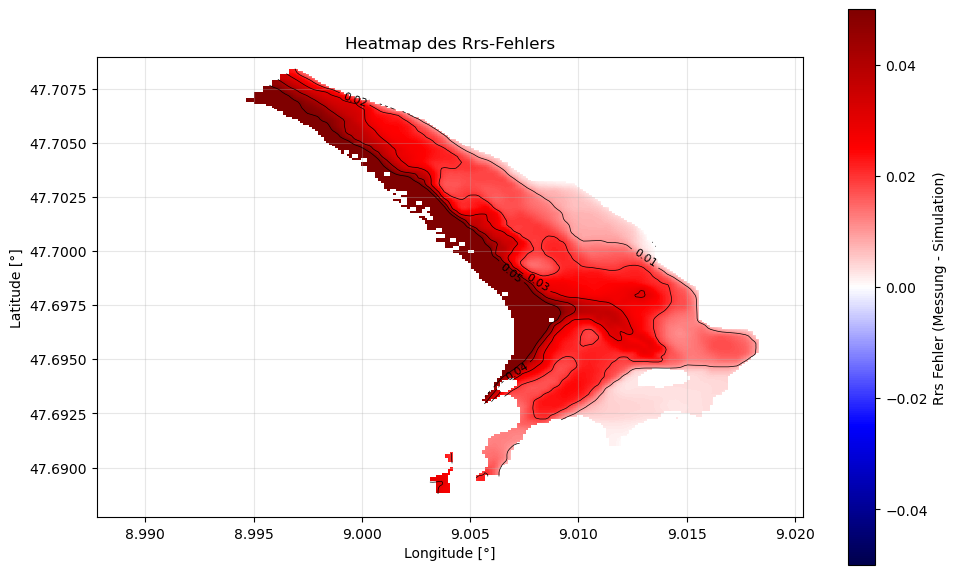

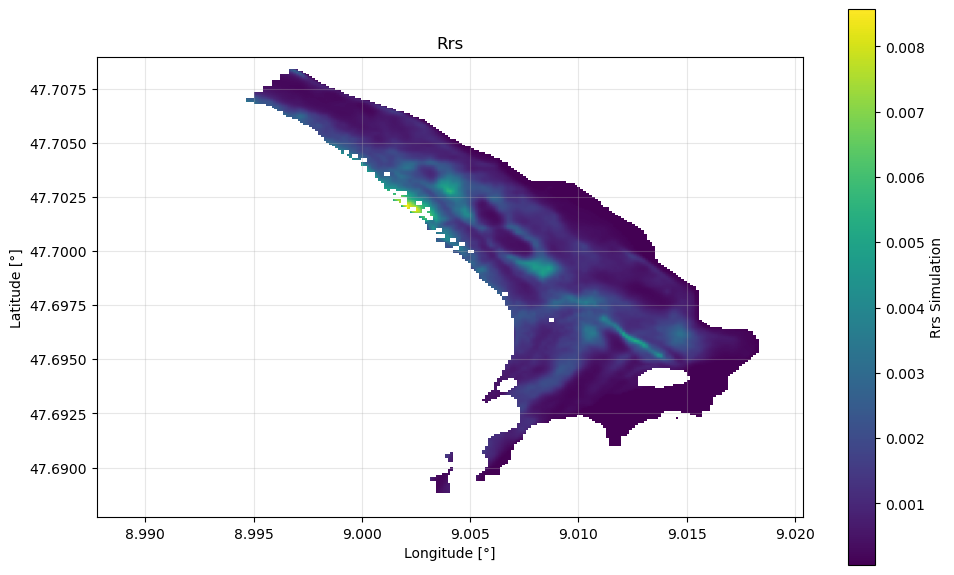

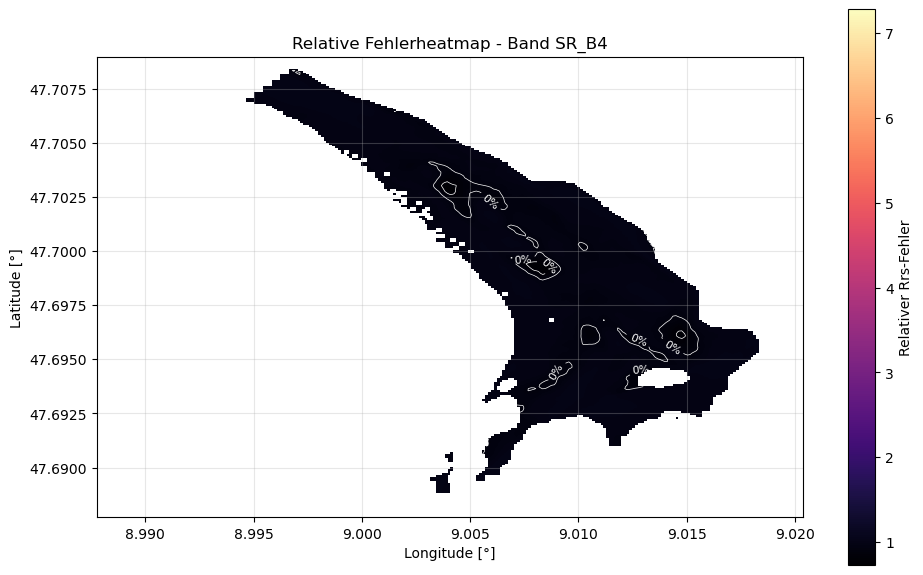


➝ Optimierung mit R_B für Bild 1, Band SR_B6...
 Optimierung abgeschlossen für Band SR_B6


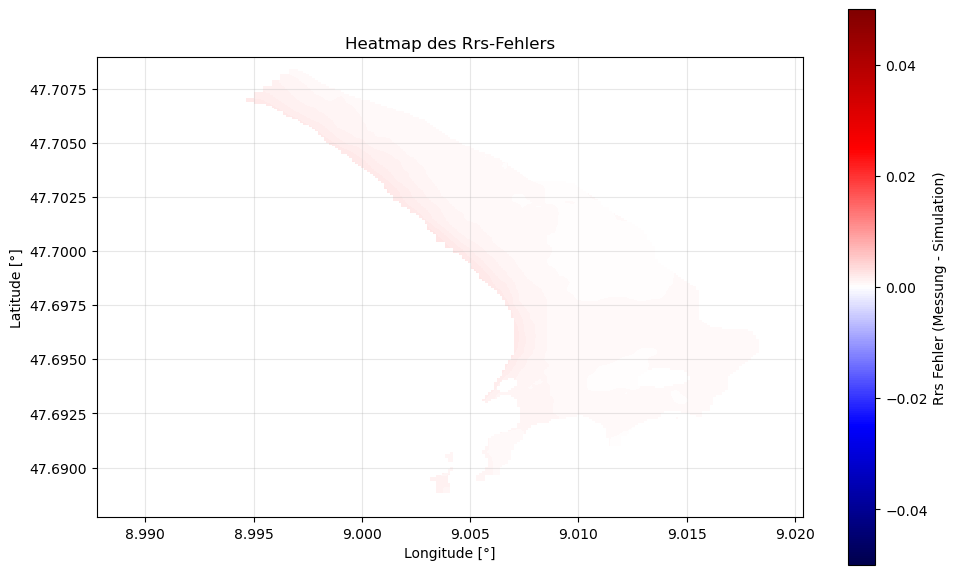

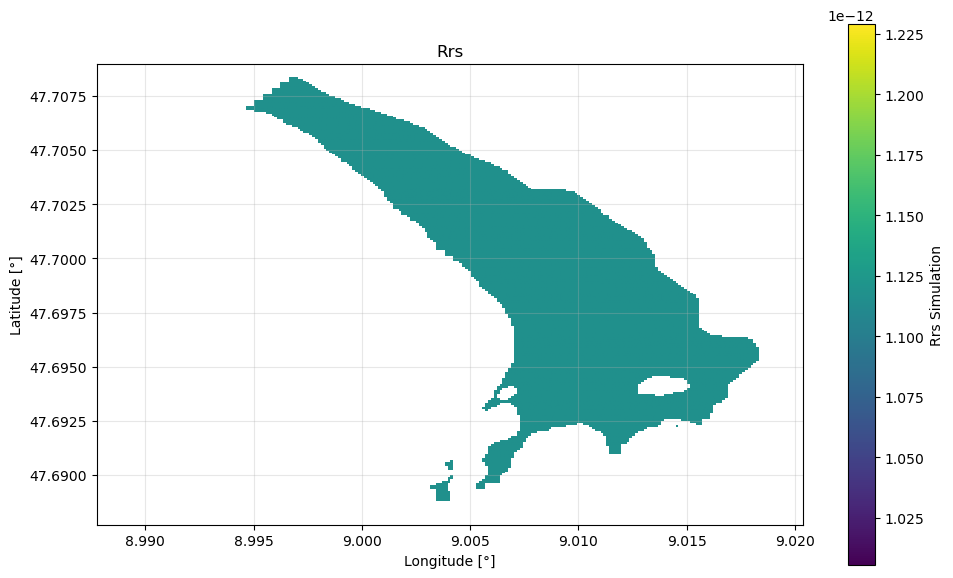

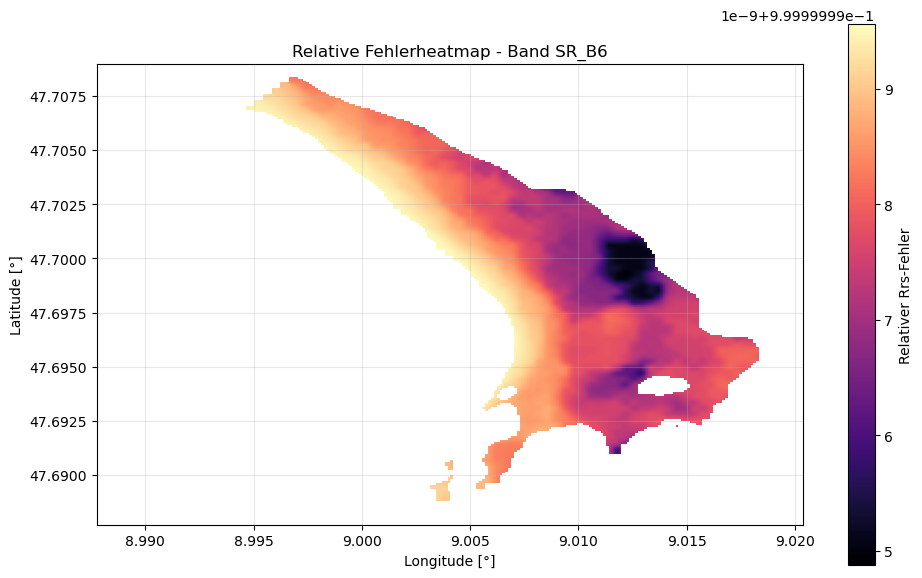

In [188]:
zB_all_bands = {}
CX_all_bands = {}
CP_all_bands = {}
aY_all_bands = {}
Rb_all_bands = {}

#Considering the natural range of R∞ < 0.3 and RB < 0.7 in the visible spectrum the maximum22 CHAPTER 2. RADIATIVE TRANSFER THEORY(2.56)(2.57)diﬀerence is about 3
#' dis alber rb kleiner 0.7, r undendlöich keliner 0.3'

band_specific_rb_bounds = {
   # "B1": (0.025, 0.33),
 #   "B2": (0.03, 0.36),
  #  "B3": (0.07, 0.42),
  #  "B4": (0.05, 0.53),
  #  "B5": (0.1, 0.65),
  #  "B6": (0.1, 0.66),
  #  "B7": (0.1, 0.67),
  #  "B11": (0.1, 0.67),
    "B1": (0, 0.7),
    "B2": (0, 0.7),
    "B3": (0, 0.7),
    "B4": (0, 0.7),
    "B5": (0, 0.7),
    "B6": (0, 0.7),
    "B7": (0, 0.7),
    "B11": (0, 0.7),
    "SR_B1": (0, 0.7),
    "SR_B2": (0, 0.7),
    "SR_B3": (0, 0.7),
    "SR_B4": (0, 0.7),
    "SR_B5": (0, 0.7),
    "SR_B6": (0, 0.7)
}

if mission in ["Sentinel", "Landsat"]:
    for image_idx in range(num_images):
        zB_init = depth_aligned1
        CX_init = cx_aligned1
        CP_init = cp_aligned1
        aY_init = ay_aligned1
        
        
        #CX_init = next((d["C_X"] for d in Cx_results if d["Bildnummer"] == image_idx + 1), None)
       # zB_init = next((d["Mosaic_Depth"] for d in depth_mosaic_results if d["Image"] == image_idx + 1), None)
        
        #CP_init = cp_estimated
        #aY_init = ay_estimated
        
        #CP_init = cp_optimized
        #aY_init = ay_optimized
        
        if mission == "Sentinel":
            band_names = ["B1", "B2", "B3", "B4", "B5", "B6", "B7", "B11"]
        elif mission == "Landsat":
            band_names = [ "SR_B2", "SR_B3", "SR_B4","SR_B6"]

        for band in band_names:
            try:
                print(f"\n➝ Optimierung mit R_B für Bild {image_idx + 1}, Band {band}...")

                aw = empirical_coefficients[band]["aw"]
                bbw = empirical_coefficients[band]["bbw"]
                bb_x = empirical_coefficients[band]["b*b_X"]
                aP_star = empirical_coefficients[band]["a*_P"]
                ay = empirical_coefficients[band]["a*_Y"]
                R_B_init_value = empirical_coefficients[band]["Rb_LC"]
                Wv = band_wavelengths[band]
                R_B_MIN, R_B_MAX = band_specific_rb_bounds[band]

                R_rs_measured = np.squeeze(all_corrected_images[image_idx][band])
                Rrs_inf_value = next((r['Rrs_infinity'] for r in rrs_infinity_results if r['Image'] == image_idx + 1 and r['Band'] == band), None)
                Rrs_inf = np.full(zB_init.shape, float(Rrs_inf_value), dtype=np.float64)
                if mission == "Sentinel":
                    theta_v_key = f"Subsurface Viewing Angle {band} (θv) (rad)"
                    theta_s_key = "Subsurface Solar Zenith Angle (θs) (rad)"

                    if theta_v_key not in metadata or theta_s_key not in metadata:
                        print(f" Fehlende Winkelwerte für Band {band} in Bild {image_idx + 1}, überspringe...")
                        continue

                    theta_v_rad = metadata[theta_v_key]
                    theta_s_rad = metadata[theta_s_key]
                elif mission == "Landsat":
                    theta_s_rad = metadata["Subsurface Solar Angle (rad)"]
                    theta_v_rad = metadata[f"Subsurface Viewing Angle {band} (θv) (rad)"]
                    
    

                zB_result = np.full_like(R_rs_measured, np.nan)
                CX_result = np.full_like(R_rs_measured, np.nan)
                CP_result = np.full_like(R_rs_measured, np.nan)
                aY_result = np.full_like(R_rs_measured, np.nan)
                RB_result = np.full_like(R_rs_measured, np.nan)
                error_map = np.full_like(R_rs_measured, np.nan)
                error_rel_map = np.full_like(R_rs_measured, np.nan)
                sim_rrs_map=np.full_like(R_rs_measured, np.nan)
                a_map = np.full_like(R_rs_measured, np.nan)
                bb_map = np.full_like(R_rs_measured, np.nan)
                wb_map = np.full_like(R_rs_measured, np.nan)
                Kd_map = np.full_like(R_rs_measured, np.nan)
                KuW_map = np.full_like(R_rs_measured, np.nan)
                KuB_map = np.full_like(R_rs_measured, np.nan)
                exp_KuW_map = np.full_like(R_rs_measured, np.nan)
                exp_KuB_map = np.full_like(R_rs_measured, np.nan)


                for i in range(R_rs_measured.shape[0]):
                    for j in range(R_rs_measured.shape[1]):
                        Rrs_val = R_rs_measured[i, j]
                        if np.isnan(Rrs_val):
                            continue

                        init_params = [
                            float(zB_init[i, j]),
                            float(CX_init[i, j]),
                            float(CP_init[i, j]),
                            float(aY_init[i, j]),
                            float(R_B_init_value)
                        ]

                        try:
                            #wenn parameter fix sein soll dann beide bounds auf 0.99 bzw 1.0001zB_init[i, j] setzten
                            #bounds_lower = [0.8*zB_init[i, j],  0.99999*CX_init[i, j], 0, 0, R_B_MIN]
                            #bounds_upper = [1.2*zB_init[i, j],CX_init[i, j], 100.0, 5.0, R_B_MAX]
                            
                            #bounds_lower = [0, 0, 0.999999999*CP_init[i, j],0.999999*aY_init[i, j] ,R_B_MIN]
                            #bounds_upper = [5, 50.0,1*CP_init[i, j] , 1*aY_init[i, j],R_B_MAX]
                            
                            #bounds_lower = [0, 0, 0,0, R_B_MIN]
                            #bounds_upper = [10,50, 100,5, R_B_MAX]
                           
                            
                            bounds_lower = [0.8*zB_init[i, j], 0.8*CX_init[i, j], 0.8*CP_init[i, j],0.8*aY_init[i, j], R_B_MIN]
                            bounds_upper = [1.2*zB_init[i, j], 1.2*CX_init[i, j], 1.2*CP_init[i, j],1.2*aY_init[i, j], R_B_MAX]
                            Rrs_val=Rrs_val
                            res = least_squares(
                                residuals_opt,
                                x0=init_params,
                                bounds=(bounds_lower, bounds_upper),
                                args=(Rrs_val,ay, theta_s_rad, theta_v_rad, Rrs_inf[i, j],
                                      ars1, ars2, ko, aw, aP_star, Wv, bbw, bb_x)
                            )
                            if res.success:
                                zB_result[i, j], CX_result[i, j], CP_result[i, j], aY_result[i, j], RB_result[i, j] = res.x
                       
                                sim_rrs = simulate_rrs_pixel(
                                        res.x,ay,
                                        theta_s_rad, theta_v_rad, Rrs_inf[i, j],
                                        ars1, ars2, ko, aw, aP_star, Wv,
                                        bbw, bb_x
                                    )

                                error_map[i, j] = R_rs_measured[i, j] - sim_rrs 
                              
                                if R_rs_measured[i, j] != 0:
                                    error_rel = np.abs(R_rs_measured[i, j] - sim_rrs) / R_rs_measured[i, j]
                                else:
                                    error_rel = np.nan

                                error_rel_map[i, j] = error_rel
                                sim_rrs_map[i, j]= sim_rrs
                                zB_val, CX_val, CP_val, aY_val, R_B_val = res.x

                                bb_val = bbw + bb_x * CX_val
                                #a_val = aw + aP_star * CP_val + aY_val * np.exp(-0.011 * (Wv - 440))
                                a_val = aw + aP_star * CP_val + aY_val * ay
                                wb_val = bb_val / (a_val + bb_val)
                                Kd_val = ko * (a_val + bb_val) / np.cos(theta_s_rad)
                                KuW_val = (a_val + bb_val) * (1 + wb_val)**k1u * (1 + k2u / np.cos(theta_s_rad)) / np.cos(theta_v_rad)
                                KuB_val = (a_val + bb_val) * (1 + wb_val)**k1b * (1 + k2b / np.cos(theta_s_rad)) / np.cos(theta_v_rad)
                                exp_KuW_val = np.exp(-(Kd_val + KuW_val) * zB_val)
                                exp_KuB_val = np.exp(-(Kd_val + KuB_val) * zB_val)

        
                                a_map[i, j] = a_val
                                bb_map[i, j] = bb_val
                                wb_map[i, j] = wb_val
                                Kd_map[i, j] = Kd_val
                                KuW_map[i, j] = KuW_val
                                KuB_map[i, j] = KuB_val
                                exp_KuW_map[i, j] = exp_KuW_val
                                exp_KuB_map[i, j] = exp_KuB_val
                                
                        except Exception:
                                continue
                            
                        zB_all_bands[band] = zB_result
                        CX_all_bands[band] = CX_result
                        CP_all_bands[band] = CP_result
                        aY_all_bands[band] = aY_result
                        Rb_all_bands[band] = RB_result

                print(f" Optimierung abgeschlossen für Band {band}")
                plt.figure(figsize=(10, 6))
                im = plt.imshow(error_map, cmap='seismic',vmin=-0.05,vmax=0.05, extent=extent_b7)  # für absoluten Fehler
                contour1 = plt.contour(error_map, levels=np.arange(-0.05, 0.051, 0.01), colors='black', linewidths=0.5,extent=[lon_min, lon_max, lat_max, lat_min])
                plt.clabel(contour1, fmt='%.2f', fontsize=8)
                plt.colorbar(im, label="Rrs Fehler (Messung - Simulation)")
                plt.title("Heatmap des Rrs-Fehlers")
                plt.xlabel("Longitude [°]")
                plt.ylabel("Latitude [°]")
                plt.grid(alpha=0.3)
                plt.tight_layout()
                plt.show()
                
                plt.figure(figsize=(10, 6))
                im = plt.imshow(sim_rrs_map, cmap='viridis',extent=extent_b7)  # für absoluten Fehler
                contour2 = plt.contour(sim_rrs_map, levels=np.arange(0, 0.201, 0.02), colors='black', linewidths=0.5, extent=[lon_min, lon_max, lat_max, lat_min])
                plt.clabel(contour2, fmt='%.2f', fontsize=8)
                plt.colorbar(im, label="Rrs Simulation")
                plt.title("Rrs")
                plt.xlabel("Longitude [°]")
                plt.ylabel("Latitude [°]")
                plt.grid(alpha=0.3)
                plt.tight_layout()
                plt.show()
                
                plt.figure(figsize=(10, 6))
                im = plt.imshow(error_rel_map, cmap='magma',extent=extent_b7)
                contour3 = plt.contour(error_rel_map, levels=np.arange(0, 11, 0.1), colors='white', linewidths=0.5, extent=[lon_min, lon_max, lat_max, lat_min])
                plt.clabel(contour3, fmt='%d%%', fontsize=8)
                plt.colorbar(im, label="Relativer Rrs-Fehler")
                plt.title(f"Relative Fehlerheatmap - Band {band}")
                plt.xlabel("Longitude [°]")
                plt.ylabel("Latitude [°]")
                plt.grid(alpha=0.3)
                plt.tight_layout()
                plt.show()

            except Exception as e:
                print(f" Fehler bei der Optimierung von Bild {image_idx + 1}, Band {band}: {e}")
                continue

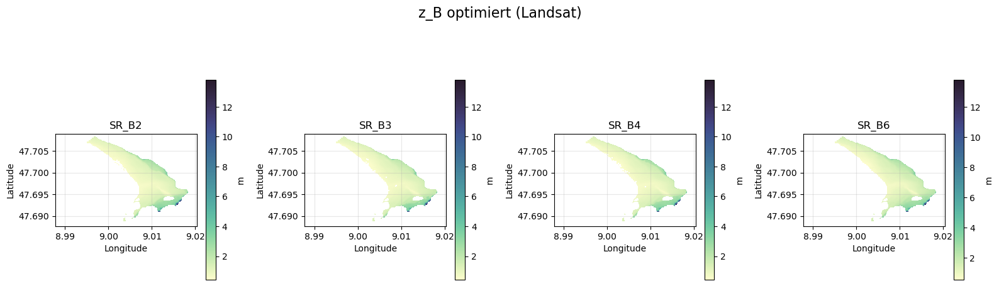

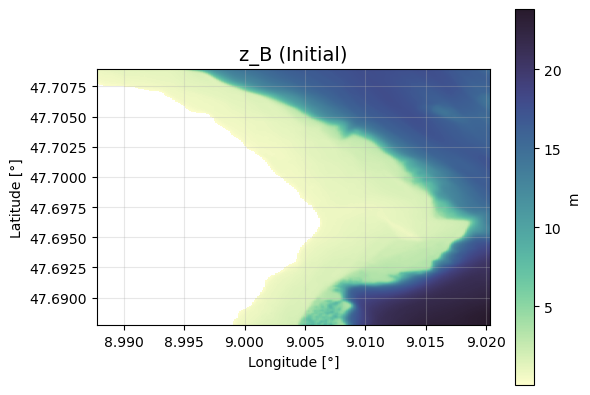

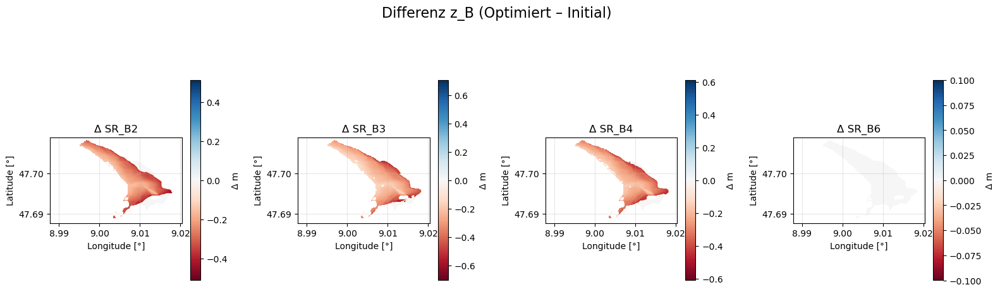

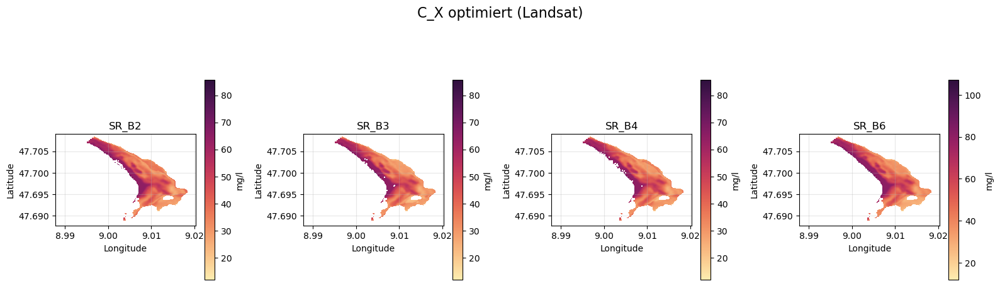

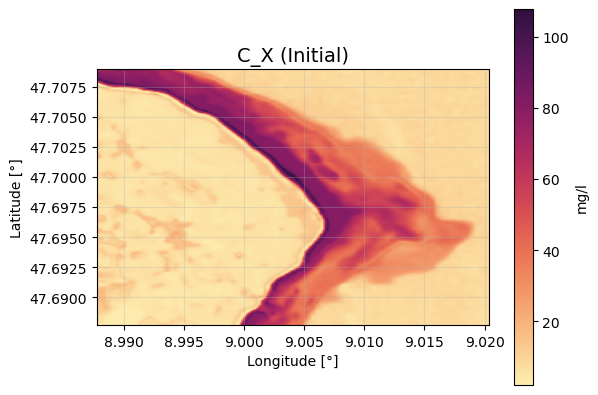

...

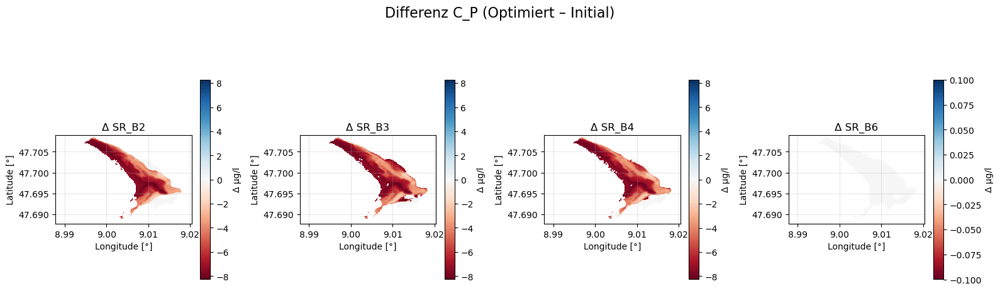

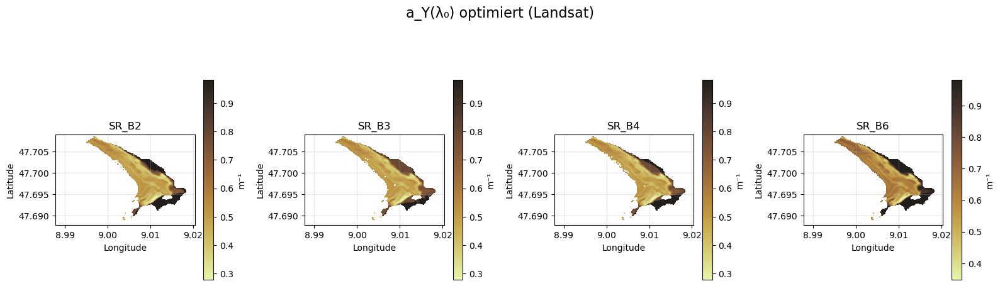

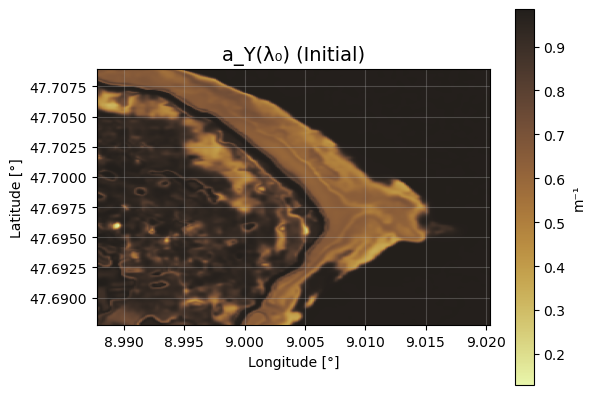

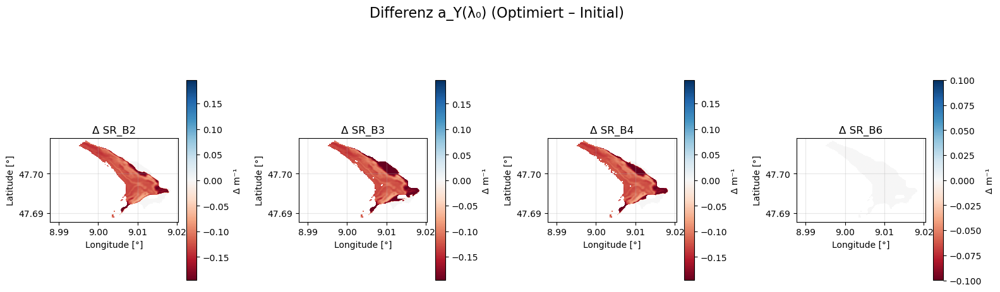

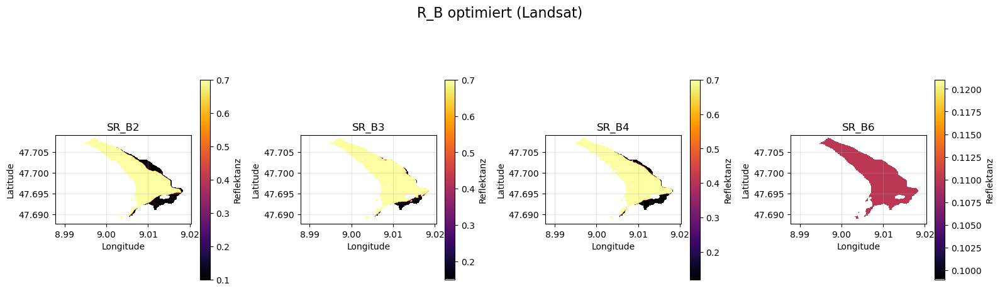

In [189]:
band_names_per_mission = {
    "Sentinel": ["B2", "B3", "B4", "B5", "B6", "B7", "B11"],
    "Landsat": ["SR_B2", "SR_B3", "SR_B4", #"SR_B5"
                "SR_B6"]
}

parameter_settings = {
    "z_B": {"cmap": cmocean.cm.deep, "label": "m", "init": depth_aligned1},
    "C_X": {"cmap": cmocean.cm.matter, "label": "mg/l", "init": cx_aligned1},
    "C_P": {"cmap": cmocean.cm.algae, "label": "µg/l", "init": cp_aligned1},
    "a_Y(λ₀)": {"cmap": cmocean.cm.turbid, "label": "m⁻¹", "init": ay_aligned1},
    "R_B": {"cmap": "inferno", "label": "Reflektanz", "init": None} 
}

parameter_data = {
    "z_B": zB_all_bands,
    "C_X": CX_all_bands,
    "C_P": CP_all_bands,
    "a_Y(λ₀)": aY_all_bands,
    "R_B": Rb_all_bands
}

for param_name, band_data in parameter_data.items():
    if mission not in ["Sentinel", "Landsat"]:
        continue

    settings = parameter_settings[param_name]
    cmap = settings["cmap"]
    colorbar_label = settings["label"]
    init_data = settings["init"]
    bands_to_plot = [b for b in band_names_per_mission[mission] if b in band_data]

    if not bands_to_plot:
        print(f" Keine Daten für {param_name}")
        continue

    fig, axes = plt.subplots(1, len(bands_to_plot), figsize=(4 * len(bands_to_plot), 5))
    if len(bands_to_plot) == 1:
        axes = [axes]

    for ax, band in zip(axes, bands_to_plot):
        data = band_data[band]
        if data is None or np.isnan(data).all():
            im = ax.imshow(np.zeros((10, 10)), cmap=cmap)
            ax.set_title(f"{band} (leer)")
        else:
            im = ax.imshow(data, cmap=cmap, extent=extent_b7)
            ax.set_title(f"{band}", fontsize=12)
        ax.grid(alpha=0.3)
        ax.set_xlabel("Longitude")
        ax.set_ylabel("Latitude")
        cbar = plt.colorbar(im, ax=ax, shrink=0.8)
        cbar.set_label(colorbar_label)

    plt.suptitle(f"{param_name} optimiert ({mission})", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.grid(alpha=0.3)
    plt.show()

    if init_data is not None:
        plt.figure(figsize=(6, 5))
        im = plt.imshow(init_data, cmap=cmap, extent=extent_b7)
        plt.title(f"{param_name} (Initial)", fontsize=14)
        plt.xlabel("Longitude [°]")
        plt.ylabel("Latitude [°]")
        plt.grid(alpha=0.3)
        cbar = plt.colorbar(im, shrink=0.8)
        cbar.set_label(colorbar_label)
        plt.tight_layout()
        plt.show()

        fig, axes = plt.subplots(1, len(bands_to_plot), figsize=(4 * len(bands_to_plot), 5))
        if len(bands_to_plot) == 1:
            axes = [axes]

        for ax, band in zip(axes, bands_to_plot):
            optimized = band_data[band]
            if optimized is None or np.isnan(optimized).all():
                ax.imshow(np.zeros((10, 10)), cmap="RdBu")
                ax.set_title(f"{band} (leer)")
                continue

            delta = optimized - init_data
            max_abs = np.nanmax(np.abs(delta))
            im = ax.imshow(delta, cmap="RdBu", extent=extent_b7, vmin=-max_abs, vmax=max_abs)
            ax.grid(alpha=0.3)
            ax.set_title(f"Δ {band}", fontsize=12)
            ax.set_xlabel("Longitude [°]")
            ax.set_ylabel("Latitude [°]")
            cbar = plt.colorbar(im, ax=ax, shrink=0.8)
            cbar.set_label(f"Δ {colorbar_label}")

        plt.suptitle(f"Differenz {param_name} (Optimiert – Initial)", fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.93])
        plt.grid(alpha=0.3)
        plt.show()

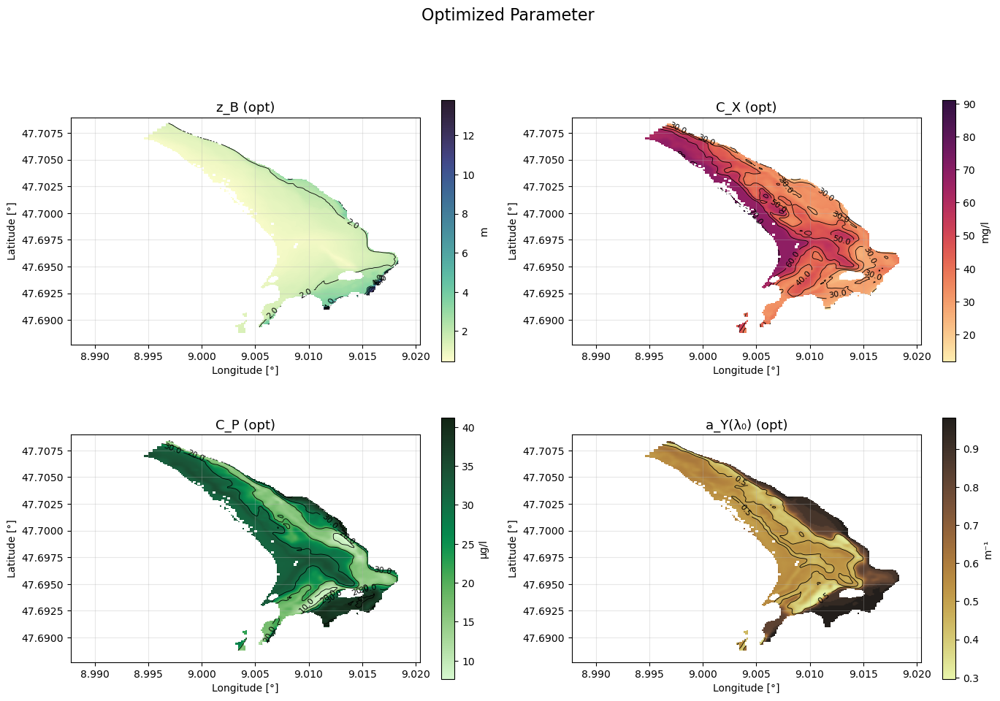

In [194]:
for band in band_names_per_mission[mission]:
    if band not in zB_all_bands:
        print(f" zB fehlt für {band}")
    if band not in CX_all_bands:
        print(f" CX fehlt für {band}")
    if band not in CP_all_bands:
        print(f" CP fehlt für {band}")
    if band not in aY_all_bands:
        print(f" aY fehlt für {band}")


zB_opt = np.full((R_rs_measured.shape[0], R_rs_measured.shape[1]), np.nan)
CX_opt = np.full((R_rs_measured.shape[0], R_rs_measured.shape[1]), np.nan)
CP_opt = np.full((R_rs_measured.shape[0], R_rs_measured.shape[1]), np.nan)
aY_opt = np.full((R_rs_measured.shape[0], R_rs_measured.shape[1]), np.nan)

for i in range(R_rs_measured.shape[0]):
    for j in range(R_rs_measured.shape[1]):
        try:
            values_zB = [zB_all_bands[band][i, j] for band in band_names_per_mission[mission]]
            values_CX = [CX_all_bands[band][i, j] for band in band_names_per_mission[mission]]
            values_CP = [CP_all_bands[band][i, j] for band in band_names_per_mission[mission]]
            values_aY = [aY_all_bands[band][i, j] for band in band_names_per_mission[mission]]

            if np.any(np.isnan(values_zB)) or np.any(np.isnan(values_CX)) or \
               np.any(np.isnan(values_CP)) or np.any(np.isnan(values_aY)):
                continue

            res_zB = least_squares(residual_zB, x0=[np.nanmedian(values_zB)], args=(values_zB,), bounds=(0.01, 50))
            res_CX = least_squares(residual_CX, x0=[np.nanmedian(values_CX)], args=(values_CX,), bounds=(0.01, 100))
            res_CP = least_squares(residual_CP, x0=[np.nanmedian(values_CP)], args=(values_CP,), bounds=(0.01, 100))      
            res_aY = least_squares(residual_aY, x0=[np.nanmedian(values_aY)], args=(values_aY,), bounds=(0.01, 5))

            zB_opt[i, j] = res_zB.x[0]
            CX_opt[i, j] = res_CX.x[0]
            CP_opt[i, j] = res_CP.x[0]
            aY_opt[i, j] = res_aY.x[0]

        except Exception:
            continue

param_maps = [
    (zB_opt, "z_B (opt)", cmocean.cm.deep, "m", np.arange(0, 30.1, 2)),
    (CX_opt, "C_X (opt)", cmocean.cm.matter, "mg/l", np.arange(0, 101, 10)),
    (CP_opt, "C_P (opt)", cmocean.cm.algae, "µg/l", np.arange(0, 101, 10)),
    (aY_opt, "a_Y(λ₀) (opt)", cmocean.cm.turbid, "m⁻¹", np.arange(0, 5.1, 0.5))
]

ig, axes = plt.subplots(2, 2, figsize=(14, 10))

for ax, (data, title, cmap, unit, levels) in zip(axes.flat, param_maps):
    im = ax.imshow(data, cmap=cmap, extent=extent_b7)
    contours = ax.contour(data, levels=levels, colors='black', linewidths=0.6, extent=[lon_min, lon_max, lat_max, lat_min])
    ax.grid(alpha=0.3)
    ax.clabel(contours, fmt='%.1f', fontsize=8)
    ax.set_title(title, fontsize=13)
    ax.set_xlabel("Longitude [°]")
    ax.set_ylabel("Latitude [°]")
    cbar = plt.colorbar(im, ax=ax, shrink=0.8)
    cbar.set_label(unit)


plt.suptitle("Optimized Parameter", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
filename = f"optimierung.pdf".replace(" ", "_")
plt.savefig(filename, format="pdf", dpi=300)
plt.show()

In [208]:
def plot_comparison(name_x, data_x, name_y, data_y, max_depth=None):
    from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
    import matplotlib.pyplot as plt
    valid_mask = ~np.isnan(data_x) & ~np.isnan(data_y)
    if max_depth is not None:
        valid_mask &= data_y <= max_depth

    x = data_x[valid_mask].flatten()
    y = data_y[valid_mask].flatten()

    if len(x) == 0:
        print(f"⚠️ Keine gültigen Daten für {name_x} vs. {name_y} bis {max_depth} m.")
        return
    r2 = r2_score(y, x)
    rmse = mean_squared_error(y, x, squared=False)
    mae = mean_absolute_error(y, x)
    bias = np.mean(x - y)
    
    coeffs = np.polyfit(x, y, 1)
    poly_eqn = np.poly1d(coeffs)
    x_line = np.linspace(min(x.min(), y.min()), max(x.max(), y.max()), 100)
    y_line = poly_eqn(x_line)

    distance = np.abs(x - y)

    fig, ax = plt.subplots(figsize=(6.5, 5)) 
    sc = ax.scatter(x, y, c=distance, cmap='viridis', s=10, alpha=0.6)
    ax.plot(x_line, x_line, color='black', linestyle='--', label='1:1')
    ax.plot(x_line, y_line, color='red', label='Regression')

    ax.set_xlabel(f"{name_x} depth [m]")
    ax.set_ylabel(f"{name_y} depth [m]")
    ax.grid(alpha=0.3)
    ax.legend(loc="lower right")

    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label('Offset from 1:1 line [m]')

    stats_text = (
        f"$N$ = {len(x)}\n"
        f"$R^2$ = {r2:.2f}\n"
        f"RMSE = {rmse:.2f} m\n"
        f"MAE = {mae:.2f} m\n"
        f"Bias = {bias:.2f} m"
    )
    ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, fontsize=12,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    plt.tight_layout()
    filename = f"{name_x}_vs_{name_y}_opt.pdf".replace(" ", "_")
    plt.savefig(filename, format="pdf", dpi=300)
    plt.show()

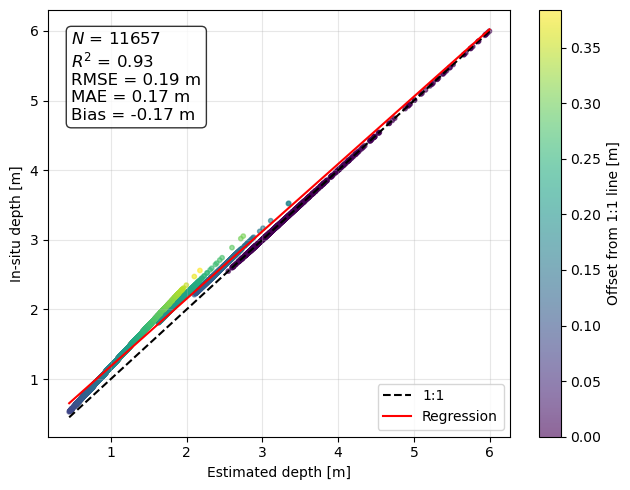

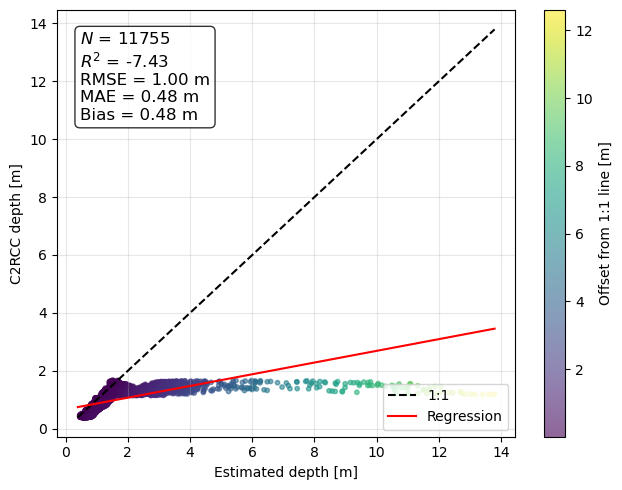


📊 Statistik-Tabelle: Estimated vs. In-situ
Tiefenbereich [m]    N  RMSE [m]  MAE [m]  Bias [m]        R²
          0.0–0.5    0       NaN      NaN       NaN       NaN
          0.5–1.0 2490  0.127328 0.126455 -0.126455 -0.647678
          1.0–1.5 4329  0.186625 0.185407 -0.185407 -0.730266
          1.5–2.0 2448  0.249741 0.248697 -0.248697 -2.542441
          2.0–2.5 1151  0.217851 0.206579 -0.206579 -1.466445
          2.5–3.0  711  0.101407 0.072883 -0.072883  0.474967
          3.0–3.5  342  0.031016 0.004499 -0.004499  0.950923
          3.5–4.0   95  0.025551 0.003707 -0.003707  0.967397
          4.0–4.5   47  0.000000 0.000000  0.000000  1.000000
          4.5–5.0   12  0.000000 0.000000  0.000000  1.000000
          5.0–5.5   18  0.000000 0.000000  0.000000  1.000000
          5.5–6.0   14  0.000000 0.000000  0.000000  1.000000
          6.0–6.5   13  0.000000 0.000000  0.000000  1.000000
          6.5–7.0    3  0.000000 0.000000  0.000000  1.000000
          7.0–7.5    6  0.

In [209]:
comparisons = [
    ("Estimated", zB_opt, "In-situ", depth_aligned1),
    ("Estimated", zB_opt, "C2RCC", depth_aligned2),
]

for name_x, data_x, name_y, data_y in comparisons:
    plot_comparison(name_x, data_x, name_y, data_y,6)

bin_tables = {}
for name_x, data_x, name_y, data_y in comparisons:
    df = evaluate_bins(name_x, data_x, name_y, data_y)
    bin_tables[f"{name_x}_vs_{name_y}"] = df

In [206]:
def plot_comparison(name_x, data_x, name_y, data_y, max_depth=None):
    from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
    import matplotlib.pyplot as plt
    valid_mask = ~np.isnan(data_x) & ~np.isnan(data_y)
    if max_depth is not None:
        valid_mask &= data_y <= max_depth

    x = data_x[valid_mask].flatten()
    y = data_y[valid_mask].flatten()

    if len(x) == 0:
        print(f"⚠️ Keine gültigen Daten für {name_x} vs. {name_y} bis {max_depth} m.")
        return
    r2 = r2_score(y, x)
    rmse = mean_squared_error(y, x, squared=False)
    mae = mean_absolute_error(y, x)
    bias = np.mean(x - y)
    
    coeffs = np.polyfit(x, y, 1)
    poly_eqn = np.poly1d(coeffs)
    x_line = np.linspace(min(x.min(), y.min()), max(x.max(), y.max()), 100)
    y_line = poly_eqn(x_line)

    distance = np.abs(x - y)

    fig, ax = plt.subplots(figsize=(6.5, 5)) 
    sc = ax.scatter(x, y, c=distance, cmap='viridis', s=10, alpha=0.6)
    ax.plot(x_line, x_line, color='black', linestyle='--', label='1:1')
    ax.plot(x_line, y_line, color='red', label='Regression')

    ax.set_xlabel(f"{name_x} suspended matter concentration [mg/l]")
    ax.set_ylabel(f"{name_y} suspended matter concentration [mg/l]")
    ax.grid(alpha=0.3)
    ax.legend(loc="lower right")

    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label('Offset from 1:1 line [mg/l]')

    stats_text = (
        f"$N$ = {len(x)}\n"
        f"$R^2$ = {r2:.2f}\n"
        f"RMSE = {rmse:.2f} mg/l\n"
        f"MAE = {mae:.2f} mg/l\n"
        f"Bias = {bias:.2f} mg/l"
    )
    ax.text(0.1, 0.95, stats_text, transform=ax.transAxes, fontsize=12,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    plt.tight_layout()
    filename = f"{name_x}_vs_{name_y}_opt.pdf".replace(" ", "_")
    plt.savefig(filename, format="pdf", dpi=300)
    plt.show()

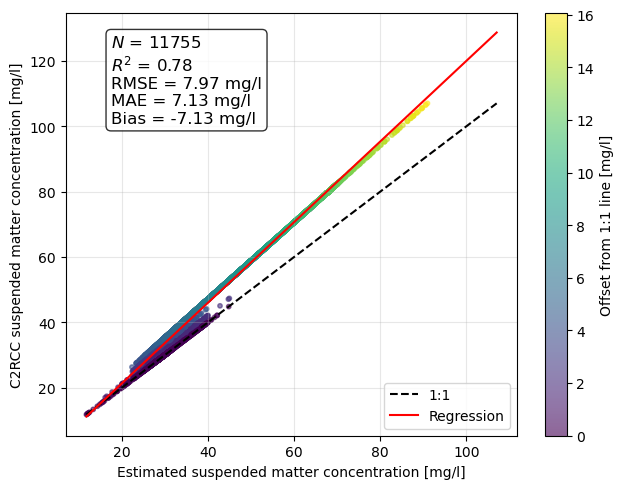

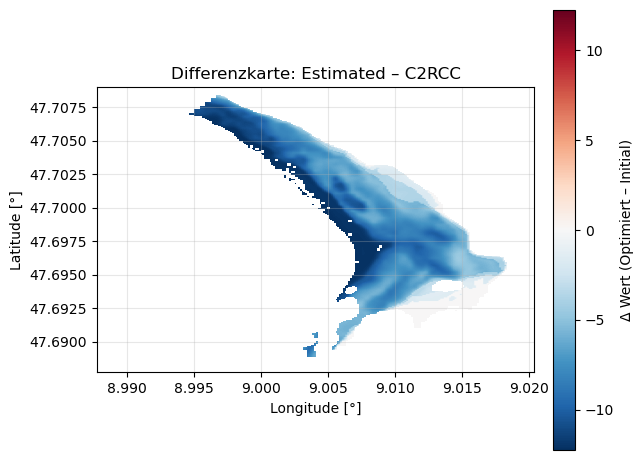

In [207]:
comparisons = [
    ("Estimated", CX_opt, "C2RCC", cx_aligned1)
]

for name_x, data_x, name_y, data_y in comparisons:
    plot_comparison(name_x, data_x, name_y, data_y)
    

for name_x, data_x, name_y, data_y in comparisons:
    valid_mask = ~np.isnan(data_x) & ~np.isnan(data_y)
    diff = np.full_like(data_x, np.nan)
    diff[valid_mask] = data_x[valid_mask] - data_y[valid_mask]

    vmax = np.nanpercentile(np.abs(diff), 98)
    vmin = -vmax

    fig, ax = plt.subplots(figsize=(6.5, 5))
    cmap = plt.get_cmap("RdBu_r")

    im = ax.imshow(diff, cmap=cmap, vmin=vmin, vmax=vmax, extent=extent_b7)
    ax.set_title(f"Differenzkarte: {name_x} – {name_y}")
    ax.set_xlabel("Longitude [°]")
    ax.set_ylabel("Latitude [°]")
    ax.grid(alpha=0.3)

    cbar = plt.colorbar(im, ax=ax, orientation='vertical', fraction=0.046, pad=0.04)
    cbar.set_label("Δ Wert (Optimiert – Initial)")

    plt.tight_layout()
    plt.show()

In [204]:
def plot_comparison(name_x, data_x, name_y, data_y, max_depth=None):
    from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
    import matplotlib.pyplot as plt
    valid_mask = ~np.isnan(data_x) & ~np.isnan(data_y)
    if max_depth is not None:
        valid_mask &= data_y <= max_depth

    x = data_x[valid_mask].flatten()
    y = data_y[valid_mask].flatten()

    if len(x) == 0:
        print(f"⚠️ Keine gültigen Daten für {name_x} vs. {name_y} bis {max_depth} m.")
        return
    r2 = r2_score(y, x)
    rmse = mean_squared_error(y, x, squared=False)
    mae = mean_absolute_error(y, x)
    bias = np.mean(x - y)
    
    coeffs = np.polyfit(x, y, 1)
    poly_eqn = np.poly1d(coeffs)
    x_line = np.linspace(min(x.min(), y.min()), max(x.max(), y.max()), 100)
    y_line = poly_eqn(x_line)

    distance = np.abs(x - y)

    fig, ax = plt.subplots(figsize=(6.5, 5)) 
    sc = ax.scatter(x, y, c=distance, cmap='viridis', s=10, alpha=0.6)
    ax.plot(x_line, x_line, color='black', linestyle='--', label='1:1')
    ax.plot(x_line, y_line, color='red', label='Regression')

    ax.set_xlabel(f"{name_x} chlorophyll-a concentration [µg/l]")
    ax.set_ylabel(f"{name_y} chlorophyll-a concentration [µg/l]")
    ax.grid(alpha=0.3)
    ax.legend(loc="lower right")

    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label('Offset from 1:1 line [µg/l]')

    stats_text = (
        f"$N$ = {len(x)}\n"
        f"$R^2$ = {r2:.2f}\n"
        f"RMSE = {rmse:.2f} µg/l\n"
        f"MAE = {mae:.2f} µg/l\n"
        f"Bias = {bias:.2f} µg/l"
    )
    ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, fontsize=12,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    plt.tight_layout()
    filename = f"{name_x}_vs_{name_y}_chl_opt.pdf".replace(" ", "_")
    plt.savefig(filename, format="pdf", dpi=300)
    plt.show()

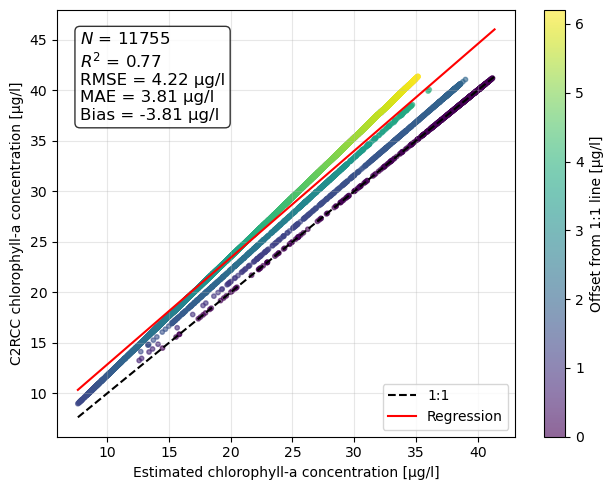

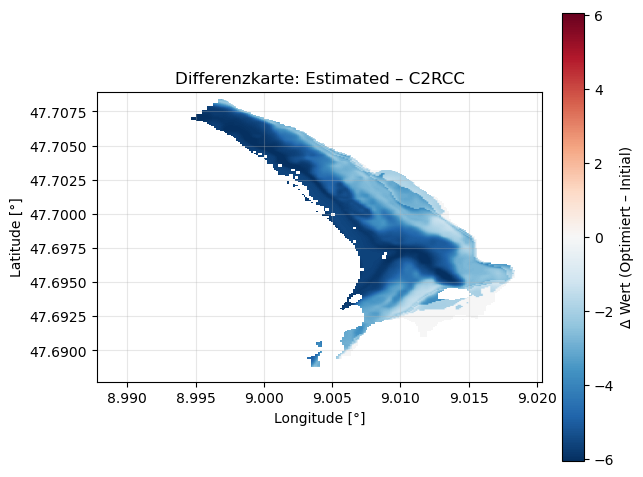

In [205]:
comparisons = [
    ("Estimated", CP_opt, "C2RCC", cp_aligned1)
]

for name_x, data_x, name_y, data_y in comparisons:
    plot_comparison(name_x, data_x, name_y, data_y)
    

for name_x, data_x, name_y, data_y in comparisons:
    valid_mask = ~np.isnan(data_x) & ~np.isnan(data_y)
    diff = np.full_like(data_x, np.nan)
    diff[valid_mask] = data_x[valid_mask] - data_y[valid_mask]

    vmax = np.nanpercentile(np.abs(diff), 98)
    vmin = -vmax

    fig, ax = plt.subplots(figsize=(6.5, 5))
    cmap = plt.get_cmap("RdBu_r")

    im = ax.imshow(diff, cmap=cmap, vmin=vmin, vmax=vmax, extent=extent_b7)
    ax.set_title(f"Differenzkarte: {name_x} – {name_y}")
    ax.set_xlabel("Longitude [°]")
    ax.set_ylabel("Latitude [°]")
    ax.grid(alpha=0.3)

    cbar = plt.colorbar(im, ax=ax, orientation='vertical', fraction=0.046, pad=0.04)
    cbar.set_label("Δ Wert (Optimiert – Initial)")

    plt.tight_layout()
    plt.show()

In [198]:
def plot_comparison(name_x, data_x, name_y, data_y, max_depth=None):
    from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
    import matplotlib.pyplot as plt
    valid_mask = ~np.isnan(data_x) & ~np.isnan(data_y)
    if max_depth is not None:
        valid_mask &= data_y <= max_depth

    x = data_x[valid_mask].flatten()
    y = data_y[valid_mask].flatten()

    if len(x) == 0:
        print(f"⚠️ Keine gültigen Daten für {name_x} vs. {name_y} bis {max_depth} m.")
        return
    r2 = r2_score(y, x)
    rmse = mean_squared_error(y, x, squared=False)
    mae = mean_absolute_error(y, x)
    bias = np.mean(x - y)
    
    coeffs = np.polyfit(x, y, 1)
    poly_eqn = np.poly1d(coeffs)
    x_line = np.linspace(min(x.min(), y.min()), max(x.max(), y.max()), 100)
    y_line = poly_eqn(x_line)

    distance = np.abs(x - y)

    fig, ax = plt.subplots(figsize=(6.5, 5)) 
    sc = ax.scatter(x, y, c=distance, cmap='viridis', s=10, alpha=0.6)
    ax.plot(x_line, x_line, color='black', linestyle='--', label='1:1')
    ax.plot(x_line, y_line, color='red', label='Regression')

    ax.set_xlabel(f"{name_x} absorption coeﬃcient of gelbstoﬀ [m−1]")
    ax.set_ylabel(f"{name_y} absorption coeﬃcient of gelbstoﬀ [m−1]")
    ax.grid(alpha=0.3)
    ax.legend(loc="lower right")

    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label('Offset from 1:1 line [m−1]')

    stats_text = (
        f"$N$ = {len(x)}\n"
        f"$R^2$ = {r2:.2f}\n"
        f"RMSE = {rmse:.2f} m−1\n"
        f"MAE = {mae:.2f} m−1\n"
        f"Bias = {bias:.2f} m−1"
    )
    ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, fontsize=12,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    plt.tight_layout()
    filename = f"{name_x}_vs_{name_y}_gelb_opt.pdf".replace(" ", "_")
    plt.savefig(filename, format="pdf", dpi=300)
    plt.show()

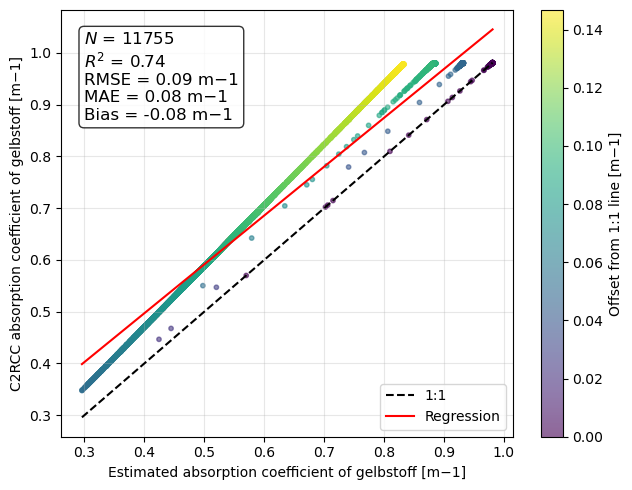

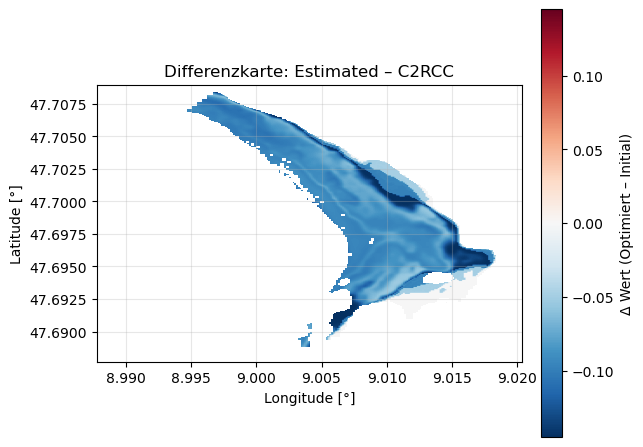

In [200]:
comparisons = [
    ("Estimated", aY_opt, "C2RCC", ay_aligned1)
]

for name_x, data_x, name_y, data_y in comparisons:
    plot_comparison(name_x, data_x, name_y, data_y)
    

for name_x, data_x, name_y, data_y in comparisons:
    valid_mask = ~np.isnan(data_x) & ~np.isnan(data_y)
    diff = np.full_like(data_x, np.nan)
    diff[valid_mask] = data_x[valid_mask] - data_y[valid_mask]

    vmax = np.nanpercentile(np.abs(diff), 98)
    vmin = -vmax

    fig, ax = plt.subplots(figsize=(6.5, 5))
    cmap = plt.get_cmap("RdBu_r")

    im = ax.imshow(diff, cmap=cmap, vmin=vmin, vmax=vmax, extent=extent_b7)
    ax.set_title(f"Differenzkarte: {name_x} – {name_y}")
    ax.set_xlabel("Longitude [°]")
    ax.set_ylabel("Latitude [°]")
    ax.grid(alpha=0.3)

    cbar = plt.colorbar(im, ax=ax, orientation='vertical', fraction=0.046, pad=0.04)
    cbar.set_label("Δ Wert (Optimiert – Initial)")

    plt.tight_layout()
    plt.show()

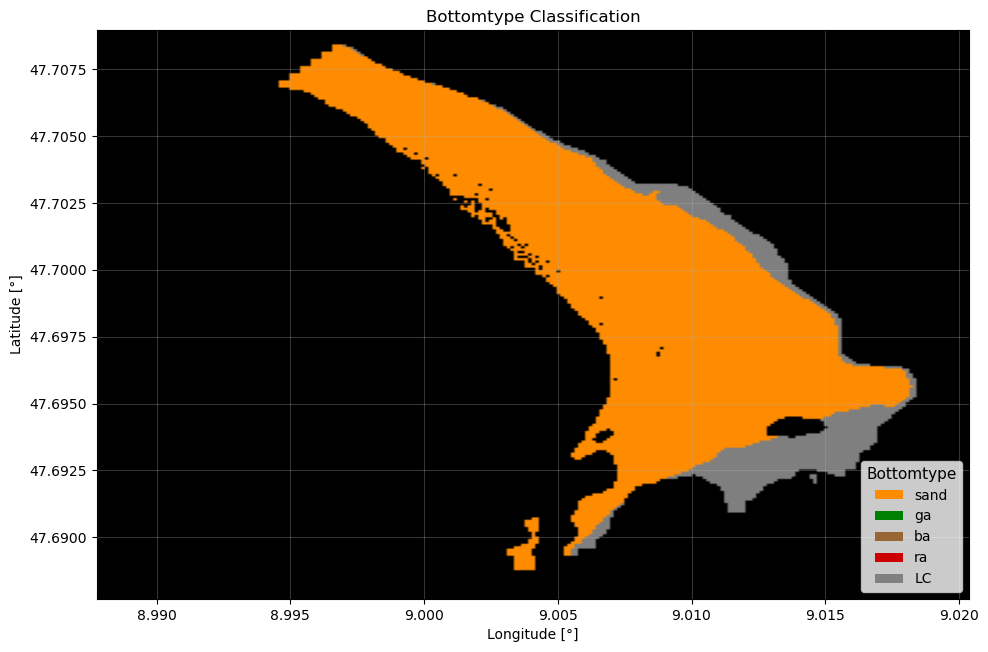

In [211]:
band_wavelengths_sen = {
    'B1':443,
    'B2':490 ,
    'B3': 560,
    'B4': 665,
    'B5': 705,
    'B6': 740,
    'B7': 783,
    'B11': 1610
}
band_wavelengths_land = {
   # 'SR_B1':443,
    'SR_B2':482 ,
    'SR_B3': 560,
    'SR_B4': 655,
   # 'SR_B5': 842,
    'SR_B6': 1610
}
#substrate_classes = ["Sand", "Green Algae", "Brown Algae", "Red Algae", "Silt"]
substrate_classes = ["sand", "ga", "ba", "ra", "LC"]

if mission == "Sentinel":
    bands = ["B1", "B2", "B3", "B4", "B5", "B6", "B7"]
    band_wavelengths = band_wavelengths_sen
elif mission == "Landsat":
    bands = [ "SR_B2", "SR_B3", "SR_B4", "SR_B6"]
    band_wavelengths = band_wavelengths_land
else:
    raise ValueError("Mission muss 'Sentinel' oder 'Landsat' sein.")

sample_band = next(iter(Rb_all_bands))
height, width = Rb_all_bands[sample_band].shape

substrate_map = np.full((height, width), "", dtype=object)
min_error_map = np.full((height, width), np.nan)

reference_spectra = {cls: [] for cls in substrate_classes}
for band in bands:
    for cls in substrate_classes:
        key = "Rb_LC" if cls == "LC" else f"Rb_{cls}"
        reference_spectra[cls].append(empirical_coefficients[band][key])

reference_spectra = {cls: np.array(vals) for cls, vals in reference_spectra.items()}
                     
for i in range(height):
    for j in range(width):
        try:
            pixel_rb = np.array([Rb_all_bands[band][i, j] for band in bands])
            if np.any(np.isnan(pixel_rb)):
                continue

            errors = {
                cls: np.sum((pixel_rb - reference_spectra[cls]) ** 2)
                for cls in substrate_classes
            }

            best_class = min(errors, key=errors.get)
            substrate_map[i, j] = best_class
            min_error_map[i, j] = errors[best_class]

        except Exception:
            continue

color_map = {
   "sand": [1.0, 0.55, 0.0],     
    "ga": [0.0, 0.5, 0.0],        
    "ba": [0.6, 0.4, 0.2],      
    "ra": [0.8, 0.0, 0.0],        
    "LC": [0.5, 0.5, 0.5]     
}
rgb_map = np.zeros((height, width, 3))

for cls, color in color_map.items():
    mask = substrate_map == cls
    for k in range(3):
        rgb_map[..., k][mask] = color[k]


fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(rgb_map, extent=extent_b7)
ax.set_title("Bottomtype Classification", fontsize=12)
ax.set_xlabel("Longitude [°]")
ax.set_ylabel("Latitude [°]")
ax.grid(alpha=0.3)
legend_elements = [Patch(facecolor=color_map[cls], label=cls) for cls in substrate_classes]
ax.legend(handles=legend_elements, title="Bottomtype", loc="lower right", fontsize=10, title_fontsize=11)
plt.tight_layout()
plt.show()

In [ ]:
kd490_results = []
sdd_results = []

band_names_per_mission = {
    "Sentinel": [ "B3", "B4"],
    "Landsat": ["SR_B3", "SR_B4"]
}

bands = band_names_per_mission.get(mission, [])

for image_idx in range(num_images):
    print(f"\n🔍 Berechne Kd490 und SDD für Bild {image_idx + 1}...")

    kd490_per_band = {}


    for band in bands:
        try:
            if mission == "Sentinel":
                theta_s_rad = metadata[f"Subsurface Solar Zenith Angle (θs) (rad)"]
                theta_v_rad = metadata[f"Subsurface Viewing Angle {band} (θv) (rad)"]
            elif mission == "Landsat":
                theta_s_rad = metadata["Subsurface Solar Angle (rad)"]
                theta_v_rad = metadata[f"Subsurface Viewing Angle {band} (θv) (rad)"]
            else:
                continue

            aw = empirical_coefficients[band]['aw']
            bbw = empirical_coefficients[band]['bbw']
            bb_x = empirical_coefficients[band]['b*b_X']
            aP_star = empirical_coefficients[band]['a*_P']
            Wv = band_wavelengths[band]

            aY = aY_opt
            CP = CP_opt
            CX = CX_opt

            a = aw + aP_star * CP + aY * np.exp(-0.011 * (Wv - 440))
            bb = bbw + bb_x * CX
            
            kd490 = (1 + 0.005 * theta_s_rad) * a + 4.18 * (1 - 0.52 - 10.8 * a) * bb
            kd490_per_band[band] = kd490
  

            kd490_results.append({
                "Image": image_idx + 1,
                "Band": band,
                "Kd490": kd490
            })

        except Exception as e:
            print(f"⚠️ Fehler bei Band {band}: {e}")
            continue

    print("Bands mit Kd490:", list(kd490_per_band.keys()))
    try:
        kd_stack = np.stack([kd490_per_band[b] for b in kd490_per_band if b in bands], axis=0)
        kd_min = np.nanmin(kd_stack, axis=0)

       
        #sdd = np.where(kd_min > 0, 2.3 / (2.5 * kd_min), np.nan)
        sdd = 2.3 / (2.5 * kd_min)
        #sdd[sdd>30]=np.nan

        # Ergebnis speichern
        sdd_results.append({
            "Image": image_idx + 1,
            "Kdmin": kd_min,
            "SDD [m]": sdd
        })

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

        im1 = ax1.imshow(kd_min, cmap=cmocean.cm.thermal, extent=extent_b7)
        ax1.set_title("Kd₄₉₀ (min über Bänder)")
        plt.colorbar(im1, ax=ax1, shrink=0.8)

        im2 = ax2.imshow(sdd, cmap=cmocean.cm.deep, extent=extent_b7)
        ax2.set_title("SDD [m]")
        plt.colorbar(im2, ax=ax2, shrink=0.8)

        for ax in [ax1, ax2]:
            ax.set_xlabel("Longitude")
            ax.set_ylabel("Latitude")
            ax.grid(alpha=0.3)

        plt.suptitle(f"Karte Kd490 & SDD für Bild {image_idx + 1} ({mission})", fontsize=16)
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"⚠️ Fehler beim Stacken oder Visualisieren von Bild {image_idx + 1}: {e}")
        continue

print("\n✅ Berechnung abgeschlossen.")

In [ ]:
#spectral kurve darstellen


In [ ]:
import numpy as np
from scipy.optimize import least_squares

# Deine Simulationsfunktion
def simulate_rrs_pixel(params, ay, theta_s, theta_v, Rrs_inf, ars1, ars2, ko, aw, aP_star, wavelength, bbw, bb_x):
    zB, CX, CP, aY0, R_B = params
    bb = bbw + bb_x * CX
    a = aw + aP_star * CP + aY0 * ay
    wb = bb / (a + bb)
    Kd = ko * (a + bb) / np.cos(theta_s)
    #Ku_W = ((a + bb) * (1 + wb)**k1u * (1 + (k2u / np.cos(theta_s)))) / np.cos(theta_v)
    #Ku_B = ((a + bb) * (1 + wb)**k1b * (1 + (k2b / np.cos(theta_s)))) / np.cos(theta_v)
    Ku_W=Kd
    Ku_B=Kd
    exp_KuW = np.exp(-(Kd + Ku_W) * zB)
    exp_KuB = np.exp(-(Kd + Ku_B) * zB)
    Rrs_sim = Rrs_inf * (1 - exp_KuW) + (R_B) * exp_KuB
    return Rrs_sim

# Residuenfunktion
def residuals_opt(params, Rrs_pixel, ay, theta_s, theta_v, Rrs_inf, ars1, ars2, ko, aw, aP_star, wavelength, bbw, bb_x):
    return Rrs_pixel - simulate_rrs_pixel(params, ay, theta_s, theta_v, Rrs_inf,
                                          ars1, ars2, ko, aw, aP_star, wavelength, bbw, bb_x)

# Parameter aus deinem Paperbeispiel (neuer Fall)
Rrs_measured = 0.099993
Rrs_inf = 0.055871
theta_s = np.radians(0)
theta_v = np.radians(0)
wavelength = 509

aw = 0.032544
bbw = 0.000959
bb_x = 0.012114
aP_star = 0.013512
ay = 0.377657

ars1 = 1.1576
ars2 = 1.0389
ko = 1.0546
k1u = 3.5421
k2u = -0.2786
k1b = 2.2658
k2b = 0.0577

# Initialwerte
init_params = [2.5, 1.0, 1.5, 0.03, 0.1]  # zB, CX, CP, aY, R_B

# Schranken für R_B (z. B. Sand in B3 = 0.07–0.42)
bounds_lower = [2.5, 1, 1.5, 0.03, 0.05]
bounds_upper = [2.50000001, 1.000001, 1.5000001, 0.3000001, 0.5]

# Optimierung
res = least_squares(
    residuals_opt,
    x0=init_params,
    bounds=(bounds_lower, bounds_upper),
    args=(Rrs_measured, ay, theta_s, theta_v, Rrs_inf,
          ars1, ars2, ko, aw, aP_star, wavelength, bbw, bb_x)
)

# Ergebnis
if res.success:
    print("\n✅ Optimierung erfolgreich!")
    print("Optimierte Parameter:")
    print(f"zB   = {res.x[0]:.4f} m")
    print(f"CX   = {res.x[1]:.4f} mg/l")
    print(f"CP   = {res.x[2]:.4f} µg/l")
    print(f"aY   = {res.x[3]:.4f}")
    print(f"R_B  = {res.x[4]:.4f}")
    
    rrs_sim = simulate_rrs_pixel(res.x, ay, theta_s, theta_v, Rrs_inf,
                                 ars1, ars2, ko, aw, aP_star, wavelength, bbw, bb_x)
    
    abs_err = Rrs_measured - rrs_sim
    rel_err = abs_err / Rrs_measured * 100
    
    print(f"\nGemessene Rrs = {Rrs_measured}")
    print(f"Simulierte Rrs = {rrs_sim:.6f}")
    print(f"Absoluter Fehler = {abs_err:.6f}")
    print(f"Relativer Fehler = {rel_err:.2f} %")

else:
    print("❌ Optimierung fehlgeschlagen.")
